In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys, os
sys.path.append("../..")
sys.path.append("..")
sys.path.append(os.getcwd())
import re
import datetime
from urllib.request import urlopen
import collections

from matplotlib import pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
import seaborn as sns
sns.set()
sns.set(palette="bright")
sns.set_style("whitegrid")

from sklearn import linear_model
from cycler import cycler
from celluloid import Camera

from IPython.display import HTML

import importlib

#importlib.reload(some_module)
import datetime as dt

import warnings

import numpy as np
import pandas as pd
import copy
import random


from tslib.src import tsUtils
from tslib.tests import testdata

warnings.filterwarnings(action='always')

from sklearn.cluster import KMeans, AgglomerativeClustering, AffinityPropagation, DBSCAN #For clustering
from sklearn.mixture import GaussianMixture #For GMM clustering

from sklearn.metrics import mean_squared_error

import hdbscan
%matplotlib inline
from filter_data import *

from syn_model import *

from kneed import DataGenerator, KneeLocator


#global settings for graphs        
cc = (cycler(linestyle=['-', '--', '-.',':']) * cycler(color=list('brgcmyk')))
plt.rc('lines', linewidth=2)
plt.rc('axes', prop_cycle=cc)
plt.rcParams.update({'font.size': 14})
plt.rcParams['figure.figsize'] = (8.0, 6.0)

plt.rcParams["animation.html"] = "html5"

## Vaccination

In [5]:
def _create_dir(path):
    if not os.path.exists(path):
        os.mkdir(path)
_create_dir("../data/vaccination")


_vaccine_state_web_path = "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/vaccinations/us_state_vaccinations.csv"
_vaccine_state_local_path = "../data/vaccination/us_state_vaccinations.csv"

_vaccine_global_web_path = "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/vaccinations/vaccinations.csv"
_vaccine_global_local_path = "../data/vaccination/vaccinations.csv"


def _update_vaccination_data(local_path = _vaccine_state_local_path, web_path = _vaccine_state_web_path):
    vaccine_hidden_path = "../data/vaccination/.us_vaccine.csv";
    return_value = os.system("curl -o %s -z %s %s" % (vaccine_hidden_path, vaccine_hidden_path, web_path))
    if return_value != 0:
        print("Unable to update vaccination data (%d)" % return_value, file=sys.stderr)
        return 1
    return_value_copy = os.system(powershell_path + "cp %s %s" % (vaccine_hidden_path, local_path))
    if return_value_copy != 0:
        print("Unable to update vaccination data (copy: %d)" % return_value_copy, file=sys.stderr)
        return 1
    return 0


def _import_vaccination_data(local_path = _vaccine_state_local_path):
    def interpolate_missing_vaccine(vaccine_data):
        cols = vaccine_data.columns
        vaccine_data[cols] = vaccine_data[cols].replace(0,np.nan)
        vaccine_data = vaccine_data.interpolate(method='linear', limit_direction='backward', axis=0)
        return vaccine_data
    
    regions = pd.read_csv(local_path)

    regions["location"].replace({"New York State": "New York"}, inplace=True)
    vaccine = regions.pivot(index='date', columns='location', values='people_vaccinated')
    full_vaccine = regions.pivot(index='date', columns='location', values='people_fully_vaccinated')

    # for region in regions:
    #     cases[region] = cases[regions[region]].sum(axis = 1)
    #     deaths[region] = deaths[regions[region]].sum(axis = 1)
    #vaccine = vaccine.fillna(0)
    #full_vaccine = full_vaccine.fillna(0)
    
    
    
    return interpolate_missing_vaccine(vaccine), interpolate_missing_vaccine(full_vaccine), regions

    
    '''
    vaccine_state = pd.read_csv(_NYTimes_local_path + "us_vaccine.csv")[1:]

    counties['county_state'] = counties['county']+'-'+counties['state']
    cases = counties.pivot_table(index='date', columns='county_state', values='cases')
    deaths = counties.pivot_table(index='date', columns='county_state', values='deaths')
    cases = cases.fillna(0)
    deaths = deaths.fillna(0)

    return cases, deaths, counties
    '''


In [6]:
_update_vaccination_data()
vaccine_US, full_vaccine_US,regions_US = _import_vaccination_data(local_path = _vaccine_state_local_path)


full_vaccine_US = full_vaccine_US.reindex(all_cases_data_pop.index, fill_value=0)
vaccine_US = vaccine_US.reindex(all_cases_data_pop.index, fill_value=0)


vaccine_pop_US, full_vaccine_pop_US = create_population_adjusted_data(vaccine_US, all_population, fast=True), \
                                    create_population_adjusted_data(full_vaccine_US, all_population, show_exception = True, fast=True)


These countries/region do not have population data:  {'Federated States of Micronesia', 'Indian Health Svc', 'Dept of Defense', 'United States', 'Virgin Islands', 'Bureau of Prisons', 'Veterans Health', 'Republic of Palau', 'Long Term Care'}


C:\Users\wangy\Github\synthetic_control_analysis\filter_data.py:49: FutureWarning: Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead
  cap = df.columns & pop
C:\Users\wangy\Github\synthetic_control_analysis\filter_data.py:55: FutureWarning: Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead
  cap2 = df2.columns & pop
C:\Users\wangy\Github\synthetic_control_analysis\filter_data.py:49: FutureWarning: Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead
  cap = df.columns & pop
C:\Users\wangy\Github\synthetic_control_analysis\filter_data.py:55: FutureWarning: Index.__and__ operating as a set operation is deprecated, in the future this will be

In [22]:
county_vaccine_csv = pd.read_csv('https://data.cdc.gov/api/views/8xkx-amqh/rows.csv')
county_vaccine_csv = county_vaccine_csv[['Date', 'FIPS', 'Series_Complete_Pop_Pct', 'Booster_Doses']]

county_vaccine_data = county_vaccine_csv
rgx = r'UNKNOWN|UNK'
mask = county_vaccine_data['FIPS'].str.contains(rgx, na=False, flags=re.IGNORECASE, regex=True, case=False)
county_vaccine_data = county_vaccine_data[~mask]
county_vaccine_data['FIPS'] = (county_vaccine_data['FIPS'].astype(str)).astype(int) #.sort_values(by=['Date'])

fips2county = pd.read_csv('fips2counties.csv')
fips2county = fips2county.drop('Unnamed: 0',1)
county_vaccine_data = pd.merge(county_vaccine_data, fips2county, how='inner', left_on=['FIPS'], right_on=['fips'])

county_vaccine_data = county_vaccine_data.pivot_table(index='Date', columns='county_state', values='Series_Complete_Pop_Pct') # or values = "Booster_Doses" 
county_vaccine_data.index = pd.to_datetime(county_vaccine_data.index)
county_vaccine_data = county_vaccine_data.sort_index()
# x.str.to_datetime)# datetime.datetime.strptime(x,"%m/%d/%Y"))
county_vaccine_data[county_vaccine_data.select_dtypes(include=['number']).columns] *= 10000 # vaccine per million

county_vaccine_data = county_vaccine_data.rename_axis(None, axis=1)  
#df = df.rename_axis(None, axis=1)  

county_vaccine_data = county_vaccine_data.rename_axis(None, axis=0)



C:\Users\wangy\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3186: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\wangy\Anaconda\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


## Some other data

In [ ]:
US_regions = {"northeast" : ["Connecticut","Maine","Massachusetts","New Hampshire",
             "Rhode Island","Vermont","New Jersey","New York",
             "Pennsylvania", "Delaware","District of Columbia","Maryland"],
              
              "midwest" : ["Indiana","Illinois","Michigan","Ohio","Wisconsin",
             "Iowa","Kansas","Minnesota","Missouri","Nebraska",
             "North Dakota","South Dakota"],
              
              "south" : ["Florida","Georgia",
            "North Carolina","South Carolina","Virginia",
            "West Virginia","Alabama","Kentucky","Mississippi",
            "Tennessee","Arkansas","Louisiana","Oklahoma","Texas"],
              
              "west" : ["Arizona","Colorado","Idaho","New Mexico","Montana",
            "Utah","Nevada","Wyoming","Alaska","California",
            "Hawaii","Oregon","Washington"]}


EU = ['Austria','Belgium','Bulgaria','Croatia','Cyprus','Czech Republic','Denmark','Estonia', 'Finland',
      'France', 'Germany','Greece', 'Hungary', 'Italy', 'Latvia', 'Lithuania','Luxembourg', 'Malta',
      'Netherlands','Poland', 'Portugal','Ireland','Romania','Slovakia','Slovenia','Spain','Sweden']


## Load COVID Data

In [66]:
from load_and_clean import *

#update_data()

#us = load_clean('NYTimes US')
uscases, usdeaths, usstates = load_clean('NYTimes states')
uscounties_cases, uscounties_deaths, uscounties = load_clean('NYTimes counties')
global_cases, global_deaths = load_clean('JHU global')
us_covid_jhu_cases, us_covid_jhu_deaths = load_clean('JHU US')
# mobility_data_apple = load_clean('mobility Apple')
# mobility_data_google, google_social = load_clean('mobility Google')
# sd_data = load_clean('IHME intervention')
all_population, us_population, usstates_population, uscounties_population = load_clean('population')

uscases_pop_adjusted, usdeaths_pop_adjusted = create_population_adjusted_data(uscases, all_population), \
                                    create_population_adjusted_data(usdeaths, all_population, show_exception = True)
global_cases_pop_adjusted, global_deaths_pop_adjusted = create_population_adjusted_data(global_cases, all_population), \
                                    create_population_adjusted_data(global_deaths, all_population, show_exception = True)

uscounties_cases_pop_adjusted = create_population_adjusted_data(uscounties_cases, all_population, show_exception = True, county = True)
uscounties_deaths_pop_adjusted = create_population_adjusted_data(uscounties_deaths, all_population, county = True)

# state_reopen = load_clean('state reopen')
# #fips_df = pd.read_csv("../COVID/COVID-19/csse_covid_19_data/UID_ISO_FIPS_LookUp_Table.csv")

# ctp_us_data = load_clean('CTP US')
# ctp_state_data = load_clean('CTP states')
# ctp_state_pop_adjusted = {stat: create_population_adjusted_data(data, all_population, show_exception=False) for stat, data in ctp_state_data.items()}


These countries/region do not have population data ['Virgin Islands']
These countries/region do not have population data ['Bahamas', 'Burma', 'Cabo Verde', 'Congo (Brazzaville)', 'Congo (Kinshasa)', "Cote d'Ivoire", 'Diamond Princess', 'Eswatini', 'Gambia', 'Holy See', 'Kyrgyzstan', 'MS Zaandam', 'Micronesia', 'North Macedonia', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Slovakia', 'Summer Olympics 2020', 'Syria', 'Taiwan*', 'West Bank and Gaza']
These countries/region do not have population data ['Adjuntas-Puerto Rico', 'Aguada-Puerto Rico', 'Aguadilla-Puerto Rico', 'Aguas Buenas-Puerto Rico', 'Aibonito-Puerto Rico', 'Anasco-Puerto Rico', 'Anchorage-Alaska', 'Arecibo-Puerto Rico', 'Arroyo-Puerto Rico', 'Barceloneta-Puerto Rico', 'Barranquitas-Puerto Rico', 'Bayamon-Puerto Rico', 'Bristol Bay plus Lake and Peninsula-Alaska', 'Cabo Rojo-Puerto Rico', 'Caguas-Puerto Rico', 'Camuy-Puerto Rico', 'Canovanas-Puerto Rico', 'Carolina-Puerto Rico', 'Catano-Puer

In [44]:
#Filter data (this part might be overlapping some cells, but it should contain most of the varilables that are analyzed. )
# This part might be to split and explain
# This part might be to split and explain
t = 7
#column = list(mobility_data_google.columns).index('retail_and_recreation_percent_change_from_baseline')
global_deaths_filtered = create_filtered_data(global_deaths, 500 )
#the last column of social distancing dataset is the last social distancing measure used by a location
#educational_distancing = get_social_distancing(sd_data, sd_data.columns[-1])

all_data = pd.concat([global_deaths, usdeaths, uscounties_deaths], axis=1).dropna()
all_data_daily = create_rolling_data(all_data, t)

all_data_cases = pd.concat([global_cases, uscases, uscounties_cases], axis=1).dropna()
all_data_cases_daily = create_rolling_data(all_data_cases, t)

all_cases_data_pop = pd.concat([uscases_pop_adjusted,global_cases_pop_adjusted, uscounties_cases_pop_adjusted], axis = 1).dropna()
all_cases_data_pop_daily = create_rolling_data(all_cases_data_pop, t)

all_death_data_pop = pd.concat([usdeaths_pop_adjusted,global_deaths_pop_adjusted, uscounties_deaths_pop_adjusted], axis = 1).dropna()
all_death_data_pop_daily = create_rolling_data(all_death_data_pop, t)

## Omincron data

In [12]:
# source : https://www.nbcchicago.com/news/local/the-omicron-variant-is-confirmed-in-16-us-states-heres-where-and-what-we-know-about-each-case/2700769/
# https://www.beckershospitalreview.com/public-health/states-where-the-omicron-variant-has-been-detected.html
low_thresh = 20
omincron_variant_data_US = {'Alabama': '2021-12-16',
                            'Alaska':'2021-12-13',
                            'Arizona': '2021-12-08',
                            'Arkansas': '2021-12-17',
                            'California': '2021-12-01',
                            'Colorado': '2021-12-02',
                            'Connecticut': '2021-12-04',
                            'Delaware': '2021-12-17',
                            'Florida': '2021-12-07',
                            'Georgia': '2021-12-03',
                            'Hawaii': '2021-12-02',
                            'Idaho': '2021-12-10',
                            'Illinois': '2021-12-07',
                            'Indiana': '2021-12-19',
                            'Iowa': '2021-12-09',
                            'Kansas': '2021-12-16',
                            'Kentucky': '2021-12-17', # https://www.wymt.com/2021/12/17/first-case-omicron-variant-confirmed-kentucky/
                            'Louisiana': '2021-12-03',
                            'Maine': '2021-12-17',
                            'Maryland': '2021-12-03',
                            'Massachusetts': '2021-12-04',
                            'Michigan': '2021-12-09',
                            'Minnesota': '2021-12-02',
                            'Mississippi': '2021-12-06',
                            'Missouri': '2021-12-03',
                            'Montana': '2021-12-20',
                            'Nebraska': '2021-12-03',
                            'New Hampshire': '2021-12-13',
                            'New Jersey': '2021-12-03', #https://www.inquirer.com/news/omicron-first-new-jersey-case-gov-murphy-20211204.html
                            'New Mexico': '2021-12-13', 
                            'Nevada':'2021-12-13', 
                            'New York': '2021-12-02',
                            'North Carolina': '2021-12-10',
                            'North Dakota': '2021-12-19',
                            'Ohio':  '2021-12-10',
                            'Oklahoma': '2021-12-21',
                            'Oregon': '2021-12-13',
                            'Pennsylvania': '2021-12-03',
                            'Rhode Island':'2021-12-11',
                            'South Carolina': '2021-12-15',
                            'South Dakota': '2021-12-22',
                            'Tennessee': '2021-12-11',
                            'Texas': '2021-12-06', # https://www.kxan.com/news/texas/texas-announces-first-detected-case-of-omicron-variant-in-harris-county/
                            'Utah': '2021-12-03',
                            'Vermont':'2021-12-18',
                            'Virginia': '2021-12-09',
                            'Wisconsin': '2021-12-04',
                            'Washington': '2021-12-04',
                            'District of Columbia': '2021-12-12',
                            'West Virginia':'2021-12-16',
                            'Wyoming':'2021-12-17',
                     }



tmp ={state: 
      (dt.datetime.strptime(omincron_variant_data_US[state],  '%Y-%m-%d') -dt.timedelta(days = low_thresh)).strftime('%Y-%m-%d')
      for state in omincron_variant_data_US
     }


d = {'country': ['USA']*len(tmp), 'name': tmp.keys(), 'date':tmp.values()}
interventions_omicron_state = pd.DataFrame(data=d)


In [56]:
# TODO: fix the knee point: We want it to be located after first case in the corresponding state => done
low_thresh = 14

intervention_dates_counties = {}
df = uscounties_cases # [pd.to_datetime(all_cases_data_pop_daily.index)  > datetime.datetime.strptime("2021-11-01","%Y-%m-%d" )]


for county in donors+targets:
    if county not in df:
        continue
    
    state = county.split('-')[1]
    if len(interventions_omicron_state[interventions_omicron_state["name"] == state]["date"].values) == 0:
        continue
        
    date = interventions_omicron_state[interventions_omicron_state["name"] == state]["date"].values[0]        
    
    Omicron_data = df[county][pd.to_datetime(df.index)  >= datetime.datetime.strptime(date,"%Y-%m-%d" )]
    #print(date, Omicron_data)
    
    x = [i for i in range(len(Omicron_data))]
    kl = KneeLocator(x, Omicron_data.to_list(), 
                     curve="convex", direction="increasing",online=True , interp_method="interp1d")
    
    if len(Omicron_data.index[kl.knee][0]) > 1:
        continue
    tmp = dt.datetime.strptime(Omicron_data.index[kl.knee],  '%Y-%m-%d') -dt.timedelta(days = low_thresh)
    intervention_dates_counties[county] = tmp.strftime('%Y-%m-%d')

    #kl.plot_knee()

#plt.show()
d = {'country': ['USA']*len(intervention_dates_counties), 'name': intervention_dates_counties.keys(), 'date':intervention_dates_counties.values()}
interventions_omicron = pd.DataFrame(data=d)
interventions_omicron



,country,name,date
0,USA,Adams-Colorado,2021-11-06
1,USA,Aitkin-Minnesota,2021-10-31
2,USA,Alameda-California,2021-12-13
3,USA,Alamosa-Colorado,2021-10-31
4,USA,Albany-New York,2021-12-11
...,...,...,...
647,USA,Woods-Oklahoma,2021-11-23
648,USA,Woodward-Oklahoma,2021-11-23
649,USA,Yankton-South Dakota,2021-11-29
650,USA,Yellowstone-Montana,2021-12-19


In [57]:
county_full_vaccine_pop_adjusted_US, county_full_vaccine_pop_adjusted_US_daily ,  _ = create_intervention_adjusted_data(county_vaccine_data, interventions_omicron, t)

# there might be an overlap; hence we only look at vaccination data for now
 # .add(omicron_cases_pop_adjusted).add(omicron_deaths_pop_adjusted)

omicron_cases_pop_adjusted, omicron_cases_pop_adjusted_daily ,  _ = create_intervention_adjusted_data(all_cases_data_pop, interventions_omicron, t)

immune_per_million = county_full_vaccine_pop_adjusted_US

## Other functions

In [30]:
import scipy as sp

def passed_H0(donors, target, singval, alpha = 0.05, df= pd.DataFrame(), low_thresh=20, train=pd.DataFrame(), test=pd.DataFrame(), H0_t = [], modify_H0_t = True):
    if train.empty:
        if df.empty:
            return False
        train, test = df.loc[0:low_thresh], df.loc[low_thresh:]
    
    Y_pre = train[donors]#.values
    #Y_pre = Y_pre[donors]
    Y_post = test[donors]

    x_new = train[target]
    
    
    r_pre = singval #  rank(M_pre) = r_pre (check) ???
    r_post = r_pre # ???
    print(Y_pre.shape)

    u_pre, _, v_pre = sp.sparse.linalg.svds(Y_pre, k = singval)
    v_pre = v_pre.T # to make the dimensions match based on Dennis: v_pre should be Nxr_pre
    
    print(Y_post.shape)

    _, _, v_post = sp.sparse.linalg.svds(Y_post, k = singval)
    v_post = v_post.T # to make the dimensions match based on Dennis: v_post should be Nxr_post
    
    
    tau_hat = np.linalg.norm(v_post - np.matmul(np.matmul(v_pre, v_pre.T),v_post))**2/np.linalg.norm(v_post)**2 # computed through Frobenius norm

    tau_pre = np.linalg.norm(x_new - np.matmul(np.matmul(u_pre, u_pre.T),x_new))**2/np.linalg.norm(x_new)**2 # computed through Frobenius norm
    print('tau_hat:', tau_hat)
    print('tau_pre:', tau_pre)
    
    #print(tau_pre, alpha , tau_pre < alpha )
    if modify_H0_t:
        for t in Y_post.index:

            tau_post = np.linalg.norm(Y_post.loc[t] - np.matmul(np.matmul(v_pre, v_pre.T),Y_post.loc[t]))**2/np.linalg.norm(Y_post.loc[t])**2 # computed through Frobenius norm
            #print(tau_post)#, alpha , tau_post < alpha )
            if len(H0_t)<=t-low_thresh:
                H0_t.append([])
            H0_t[t-low_thresh].append(tau_post < alpha )
    
    #print(tau_hat,alpha )
    
    H_0 = tau_pre < alpha
    return H_0


    # test statistic:
    # tau_hat = np.linalg.norm(v_post - np.matmul(np.matmul(v_pre, v_pre.T),v_post)) # computed through Frobenius norm


FONTSIZE = 28

#TODO: debug filter_donor HBO

def generate_donors(target, pop_df, low_thresh, all_donors = None, donor_pool_length = 100):
    #    alpha = 0.5
    #    otherStates = pop_df.columns[(pop_df.iloc[low_thresh] < 
    #                                  pop_df[target].iloc[low_thresh]+alpha*pop_df[target].iloc[low_thresh])
    #                                &(pop_df.iloc[low_thresh] > pop_df[target].iloc[low_thresh]-alpha*pop_df[target].iloc[low_thresh])]
    #    
    #    
    #    while len(otherStates) > max_count:
    #        
    #        alpha = alpha * 0.9
    #        
    #        otherStates = pop_df.columns[(pop_df.iloc[low_thresh] < 
    #                                  pop_df[target].iloc[low_thresh]+alpha*pop_df[target].iloc[low_thresh])
    #                                &(pop_df.iloc[low_thresh] > pop_df[target].iloc[low_thresh]-alpha*pop_df[target].iloc[low_thresh])]
    #    
    #    return otherStates

    if all_donors == None or not len(all_donors):
        shared_donors = pop_df.columns
    else:
        shared_donors = pop_df.columns[pop_df.columns.isin(all_donors)]
    
    idx = np.argsort(np.abs(pop_df[shared_donors].iloc[low_thresh]-pop_df[target].iloc[low_thresh]))[:donor_pool_length]

    return shared_donors[idx]
    

 
    
def find_testing_diversion(y_actual, y_pred, MSE = False):    
    min_len = min(len(y_actual), len(y_pred))
    mse =  np.sum((y_actual[:min_len] - y_pred[:min_len]) ** 2) / min_len
    if MSE:
        return mse
    # return np.sum((y_actual[:min_len] - y_pred[:min_len])) / min_len
    R2 = 1. - mse/np.var(y_actual) # R^2

    return R2


def plot_counterfactual_vs_prediction(donors, targets, start_date= '2020-04-01',low_thresh = 20, high_thresh =0, date_indexed = True, df = None, df_pop = None,mRSC=True, singVals=4): 
    
    checked_donors = set()
        
    RMSE_target = []
    RMSE_donor = []
    div_target = []
    div_donor = []
    total_case_donors = 0
    total_case_targets = 0
    
    if date_indexed:
        df = [_df.loc[start_date:] for _df in df]
        df_pop = df_pop.loc[start_date:]
    plt.rcParams.update({'font.size': 30})
    tick_spacing=50
    if not high_thresh:
        high_thresh = df_pop.shape[0]
    #low_thresh = 50 We want the first line of the output (intervention day) to be 5/25

    
    num_rows_to_plot = int(len(targets))+1
    #plt.rcParams['figure.figsize'] = (24, num_rows_to_plot*5.0)
    plt.rcParams['figure.figsize'] = (26, 8.0)

    i=1
    for state in targets:
    #otherStates = donors.copy()
        try:
            otherStates = list(generate_donors(state, df_pop, low_thresh, all_donors=donors))
            print('other states:', len(otherStates))

        except Exception as e:
            #print(e)
            continue


        if state in otherStates:
            otherStates.remove(state)        
        rscModel =syn_model(state,  singVals, df, high_thresh, low_thresh, otherStates=otherStates, mRSC=mRSC)
        try:
            rscModel.fit_model(filter_donor = True, filter_method = 'hbo', backward_donor_eliminate = True, singVals_estimate = True, singval_mathod ='auto')
            print('rscModel.donors:', len(rscModel.donors))

        except Exception as e:
            print("fit error in 1:", state)
            print(e)
            continue
            
        print(state, 'singVals:', rscModel.kSingularValues)
        prediction_error = rscModel.test_err
        fit_error = rscModel.train_err
        predictions = rscModel.predictions
        model_fit = rscModel.model_fit
        diversion = find_testing_diversion(rscModel.actual[low_thresh:high_thresh].values, predictions)
        
        RMSE_target.append(np.sqrt(prediction_error))#/df_pop.loc[[low_thresh]][state].values)
        div_target.append(diversion)#/df_pop.loc[[low_thresh]][state].values)
        total_case_targets += df_pop.loc[[low_thresh]][state].values
        
        if(len(otherStates)<5):
            continue
              
        title_text = state+" donors: "+str(len(otherStates))\
                     + "\n Cases on intervention "+ str(df_pop.index[low_thresh])+ ": " + str(int(df_pop[state].iloc[low_thresh]))
        
        ax = plt.subplot(1,2,1)
        

        ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
        ax.set_title(title_text ,fontsize=FONTSIZE, pad=10)
        plt.plot(np.concatenate((model_fit[:low_thresh], predictions)), label='Model+Counterfactual', color='blue'), plt.plot(df[0][state], label='Actual', color='red'), 
        plt.ylabel('Daily cases per million',fontsize=FONTSIZE),
        plt.axvline(x=df[0].index[low_thresh], color='k', linestyle='--', linewidth=4), plt.legend(fontsize=FONTSIZE)
        plt.xlabel('Date',fontsize = FONTSIZE )
        plt.xticks(rotation=45, fontsize = FONTSIZE), plt.yticks(fontsize = FONTSIZE) 
        
        y_min1, y_max1 = ax.get_ylim()


        new_state = otherStates[np.argmin(np.abs(df_pop[otherStates].iloc[low_thresh]-df_pop[state].iloc[low_thresh]))]

        if new_state in otherStates:
            otherStates.remove(new_state)
  
        rscModel =syn_model(new_state,  singVals, df, high_thresh, low_thresh, otherStates=otherStates, mRSC=mRSC)
        try:
            rscModel.fit_model(filter_donor = True, filter_method = 'hbo', backward_donor_eliminate = True, singVals_estimate = True, singval_mathod ='auto')
            print('rscModel.donors:', len(rscModel.donors))

        except Exception as e:
            print("fit error in 2:", new_state)
            print(e)
            continue
            
        print(new_state, 'singVals:', rscModel.kSingularValues)
        
        prediction_error = rscModel.test_err
        fit_error = rscModel.train_err
        predictions = rscModel.predictions
        model_fit = rscModel.model_fit
        diversion = find_testing_diversion(rscModel.actual[low_thresh:high_thresh].values, predictions)
        
        if new_state not in checked_donors:
            RMSE_donor.append(np.sqrt(prediction_error))#/df_pop.loc[[low_thresh]][new_state].values)
            div_donor.append(diversion)#/df_pop.loc[[low_thresh]][new_state].values)
            total_case_donors += df_pop.loc[[low_thresh]][new_state].values

            
            checked_donors.add(new_state) 

        ax2 = plt.subplot(1,2,2)

        ax2.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
        title_text =new_state+" donors: "+str(len(otherStates))\
                     + "\n Cases on intervention "+ str(df_pop.index[low_thresh])+ ": " + str(int(df_pop[new_state].iloc[low_thresh])) 
        ax2.set_title(title_text,fontsize=FONTSIZE, pad=10)
                
        plt.plot(np.concatenate((model_fit[:low_thresh], predictions)), color='green', label='Model+Prediction'),
        plt.plot(df[0][new_state], label='Actual', color='red'), plt.legend(fontsize = FONTSIZE), 
        plt.ylabel('Daily cases per million',fontsize = FONTSIZE),
        y_min2, y_max2 = ax2.get_ylim()
        
        y_min, y_max = min(y_min1, y_min2), max(y_max1, y_max2)
        
        ax.set_ylim([y_min, y_max])
        ax2.set_ylim([y_min, y_max])
        plt.axvline(x=df[0].index[low_thresh], color='k', linestyle='--', linewidth=4), plt.legend(fontsize = FONTSIZE)
        #plt.savefig("../figures/"+state+".png")

        plt.xlabel('Date',fontsize = FONTSIZE )
        plt.xticks(rotation=45, fontsize = FONTSIZE), plt.yticks(fontsize = FONTSIZE) 
        
        
        
        i=i+1

        #plt.savefig('../Figures/COVID/'+state+'_'+new_state+'.pdf', bbox_inches='tight')

        plt.show()
        
    return RMSE_target, RMSE_donor, div_target, div_donor, total_case_targets, total_case_donors


## Analysis

In [32]:
## Select target and donor states
df_omicron_date = pd.DataFrame(omincron_variant_data_US, index = [0]).T
df_omicron_date.columns = ['Date']
df_omicron_date = df_omicron_date.sort_values(['Date'])
target_states = list(df_omicron_date.iloc[-6:].index)
donor_states = list(df_omicron_date.iloc[:6].index)

In [33]:
targets = []
for counties in uscounties_cases.columns:
    names = counties.split('-')
    if names[-1] in target_states and names[0] != 'Unknown' and names[0] != 'Hawaii':
        targets.append(counties)

In [34]:
donors = []
for counties in uscounties_cases.columns:
    names = counties.split('-')
    if names[-1] in donor_states and names[0] != 'Unknown' and names[0] != 'Hawaii':
        donors.append(counties)

Adair-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648626047
tau_pre: 1.6871888648874175e-06
1D for Adair-Oklahoma True


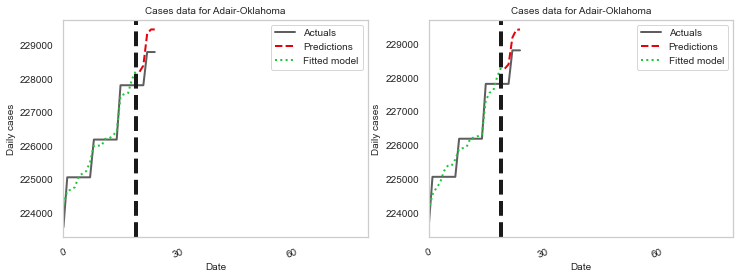

(40, 100)
(5, 100)
tau_hat: 0.5935952209374082
tau_pre: 2.5194519174261695e-06
2D for Adair-Oklahoma True
Adams-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648424623
tau_pre: 2.756016036135826e-06
1D for Adams-Indiana True


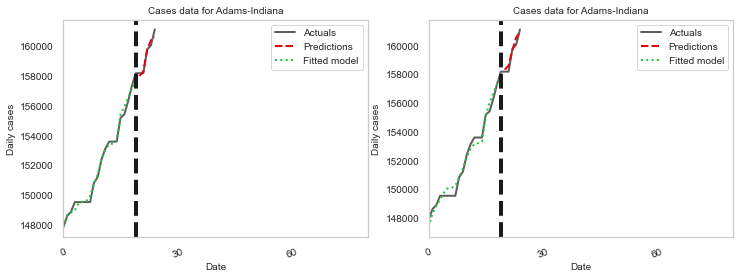

(40, 100)
(5, 100)
tau_hat: 0.5935952209321183
tau_pre: 7.244947697542555e-06
2D for Adams-Indiana True
Adams-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4893428929371839
tau_pre: 5.504869131686937e-06
1D for Adams-North Dakota True


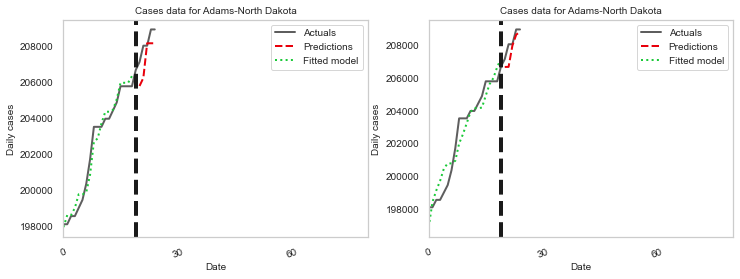

(40, 100)
(5, 100)
tau_hat: 0.5893856588812613
tau_pre: 2.424474119531983e-05
2D for Adams-North Dakota True
Addison-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5249036231746094
tau_pre: 0.00014390807478756144
1D for Addison-Vermont True


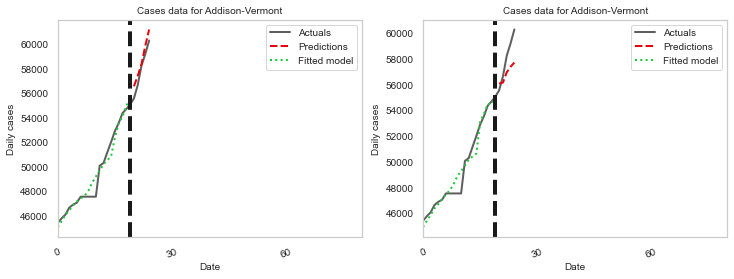

(40, 100)
(5, 100)
tau_hat: 0.6132440588510021
tau_pre: 6.985561950696994e-05
2D for Addison-Vermont True
Alfalfa-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5197248755884871
tau_pre: 6.147001560559527e-06
1D for Alfalfa-Oklahoma True


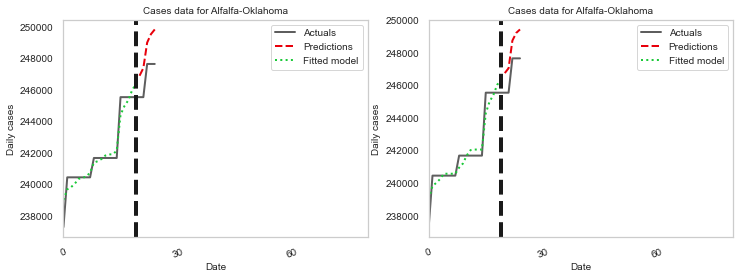

(40, 100)
(5, 100)
tau_hat: 0.6221763666760903
tau_pre: 7.831250633864169e-06
2D for Alfalfa-Oklahoma True
Allen-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.48258036403243354
tau_pre: 6.747128945836478e-06
1D for Allen-Indiana True


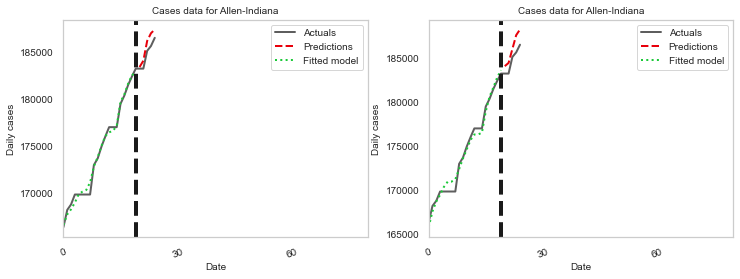

(40, 100)
(5, 100)
tau_hat: 0.5835912654915136
tau_pre: 1.7674983370546248e-05
2D for Allen-Indiana True
Atoka-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648480659
tau_pre: 6.132613787184657e-06
1D for Atoka-Oklahoma True


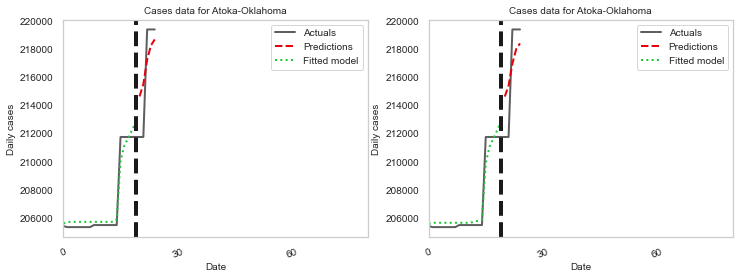

(40, 100)
(5, 100)
tau_hat: 0.5935952209328959
tau_pre: 7.411110513783367e-06
2D for Atoka-Oklahoma True
Aurora-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.43215029605525174
tau_pre: 5.530989033229133e-06
1D for Aurora-South Dakota True


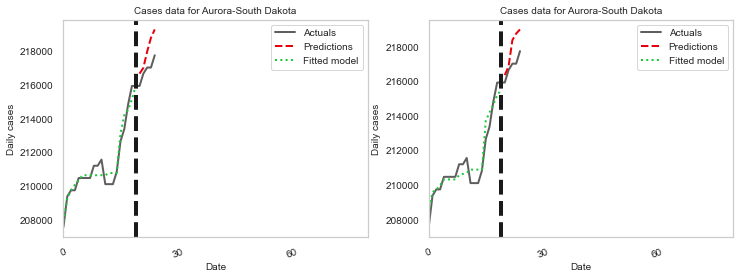

(40, 100)
(5, 100)
tau_hat: 0.52114718126016
tau_pre: 1.0362335557367837e-05
2D for Aurora-South Dakota True
Barnes-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5601666858164813
tau_pre: 2.139438336207987e-06
1D for Barnes-North Dakota True


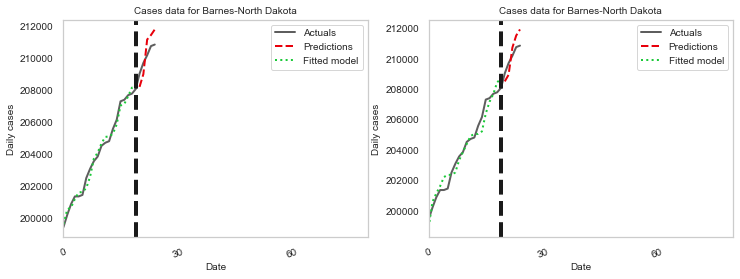

(40, 100)
(5, 100)
tau_hat: 0.6308574123727733
tau_pre: 9.0049107273224e-06
2D for Barnes-North Dakota True
Bartholomew-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5601666858159947
tau_pre: 9.053415109098392e-06
1D for Bartholomew-Indiana True


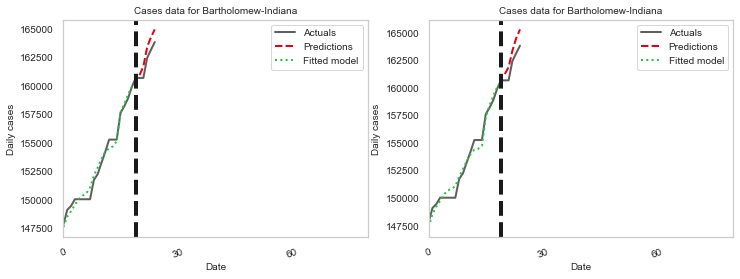

(40, 100)
(5, 100)
tau_hat: 0.6308574123745735
tau_pre: 1.3381139071821282e-05
2D for Bartholomew-Indiana True
Beadle-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5065823573694437
tau_pre: 7.074187894731895e-06
1D for Beadle-South Dakota True


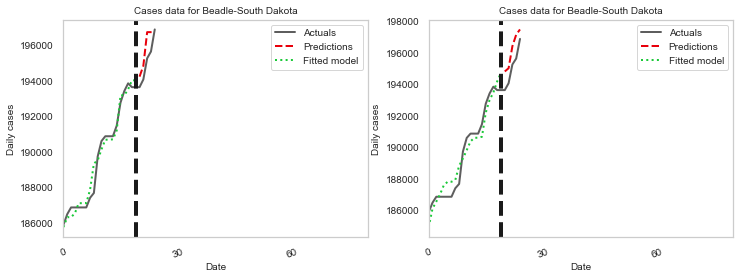

(40, 100)
(5, 100)
tau_hat: 0.614109779353257
tau_pre: 1.3733842097890902e-05
2D for Beadle-South Dakota True
Beaver-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648483919
tau_pre: 3.480244061643622e-05
1D for Beaver-Oklahoma True


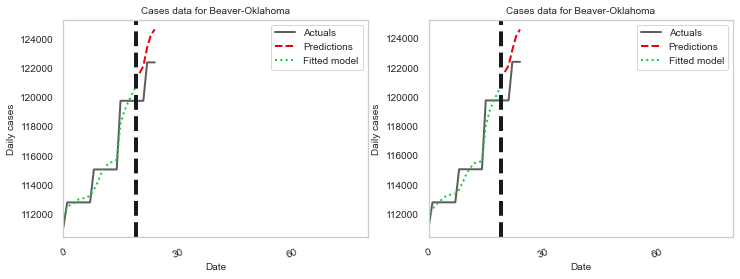

(40, 100)
(5, 100)
tau_hat: 0.5935952209400408
tau_pre: 3.609424299363473e-05
2D for Beaver-Oklahoma True
Beaverhead-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.4218196996008599
tau_pre: 1.2132300633845972e-06
1D for Beaverhead-Montana True


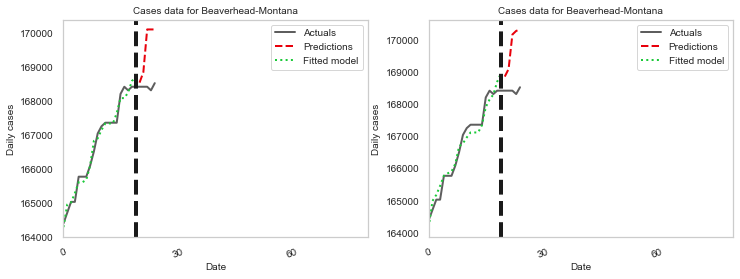

(40, 100)
(5, 100)
tau_hat: 0.49920373303567356
tau_pre: 5.482290261137805e-06
2D for Beaverhead-Montana True
Beckham-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.552424753707489
tau_pre: 3.6476348880001346e-05
1D for Beckham-Oklahoma True


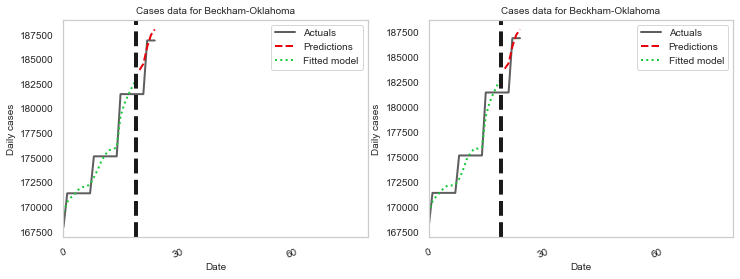

(40, 100)
(5, 100)
tau_hat: 0.6061585095824527
tau_pre: 3.803083895163003e-05
2D for Beckham-Oklahoma True
Bennett-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4296919110077074
tau_pre: 1.3520519919513068e-05
1D for Bennett-South Dakota True


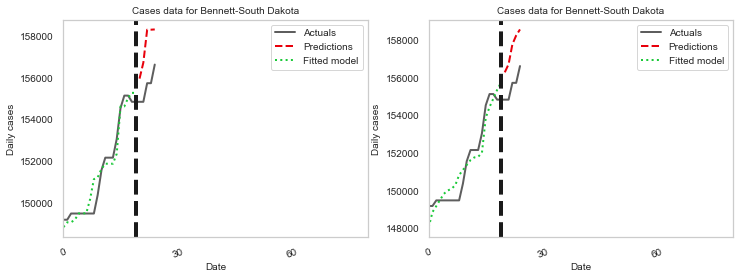

(40, 100)
(5, 100)
tau_hat: 0.5213014764796676
tau_pre: 2.204848570010392e-05
2D for Bennett-South Dakota True
Bennington-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5614759402626378
tau_pre: 0.0001237642902959815
1D for Bennington-Vermont True


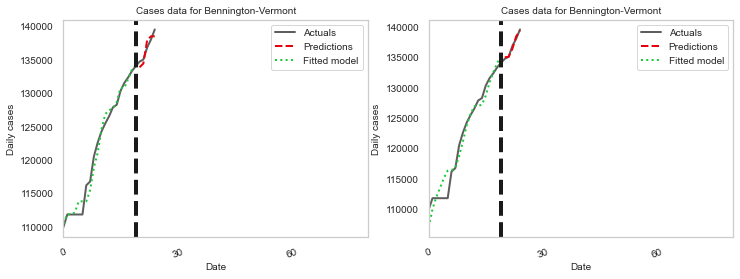

(40, 100)
(5, 100)
tau_hat: 0.614495331017895
tau_pre: 0.00019147607399248314
2D for Bennington-Vermont True
Benson-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.49372810703984066
tau_pre: 1.8356057814324024e-06
1D for Benson-North Dakota True


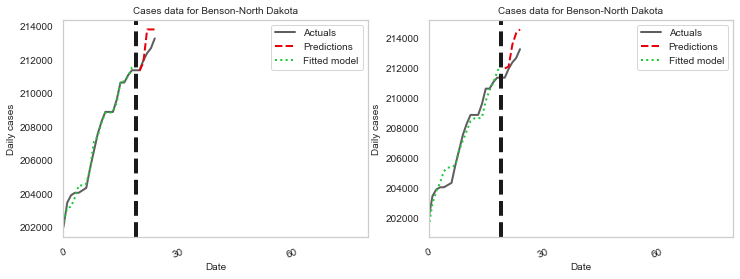

(40, 100)
(5, 100)
tau_hat: 0.5931155330366937
tau_pre: 1.661528052286988e-05
2D for Benson-North Dakota True
Benton-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536949062
tau_pre: 7.817160275392227e-06
1D for Benton-Indiana True


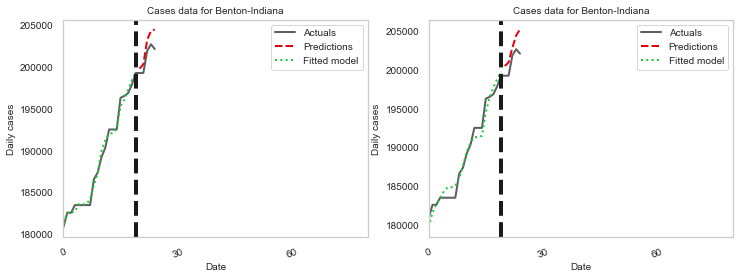

(40, 100)
(5, 100)
tau_hat: 0.606158509584223
tau_pre: 2.7977311221386244e-05
2D for Benton-Indiana True
Big Horn-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.568509962377646
tau_pre: 1.3540696070521428e-06
1D for Big Horn-Montana True


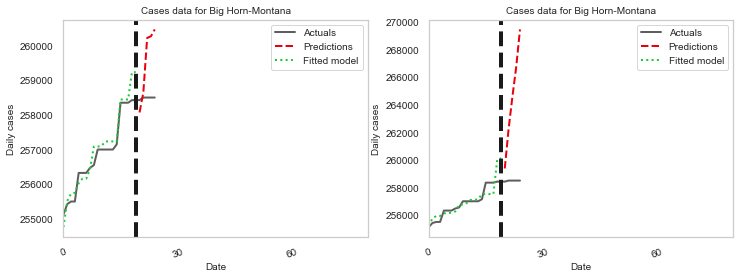

(40, 100)
(5, 100)
tau_hat: 0.6569921617616838
tau_pre: 1.1106874223047783e-05
2D for Big Horn-Montana True
Billings-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967246731
tau_pre: 4.0464139380058484e-05
1D for Billings-North Dakota True


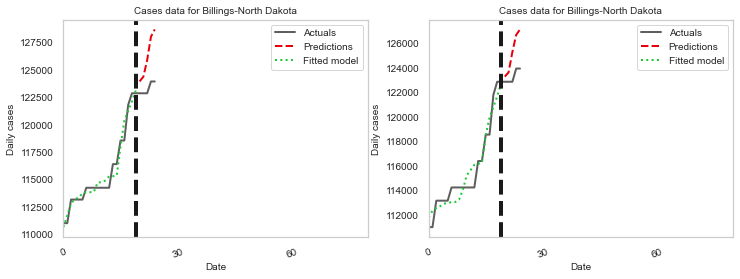

(40, 100)
(5, 100)
tau_hat: 0.6108728044031677
tau_pre: 7.675554008885337e-05
2D for Billings-North Dakota True
Blackford-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.519724875576724
tau_pre: 7.905136101004659e-06
1D for Blackford-Indiana True


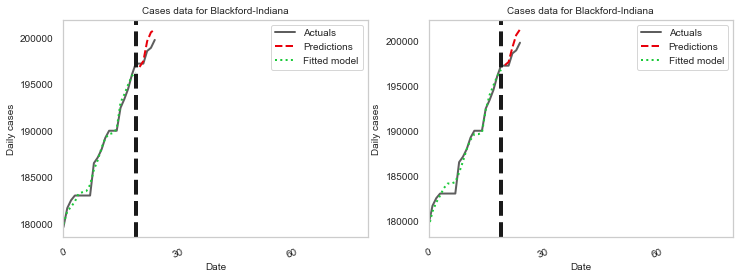

(40, 100)
(5, 100)
tau_hat: 0.6221763666681254
tau_pre: 1.3906544791679222e-05
2D for Blackford-Indiana True
Blaine-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5685099623768729
tau_pre: 2.054146705713145e-06
1D for Blaine-Montana True


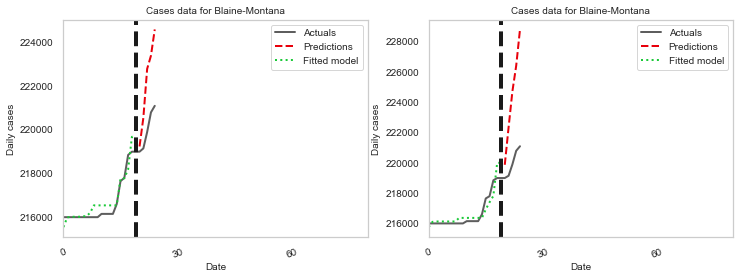

(40, 100)
(5, 100)
tau_hat: 0.6569921617608947
tau_pre: 4.3771590791245745e-06
2D for Blaine-Montana True
Blaine-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5267129134928258
tau_pre: 9.281151140452218e-06
1D for Blaine-Oklahoma True


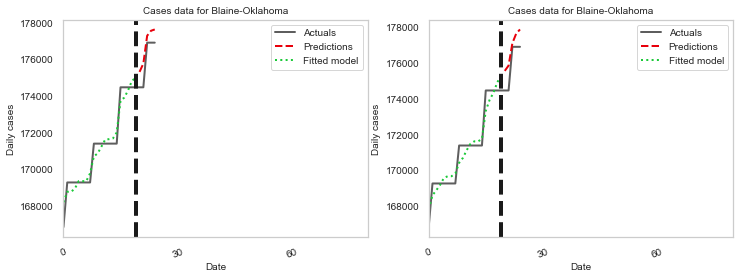

(40, 100)
(5, 100)
tau_hat: 0.6259695256175075
tau_pre: 1.2449143030092155e-05
2D for Blaine-Oklahoma True
Bon Homme-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5486140620988875
tau_pre: 3.429113145179343e-06
1D for Bon Homme-South Dakota True


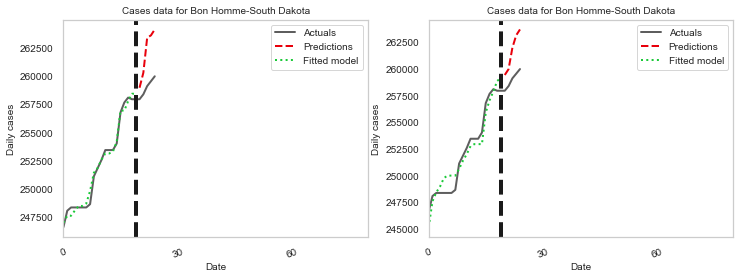

(40, 100)
(5, 100)
tau_hat: 0.6187803018882553
tau_pre: 1.6446654672840276e-05
2D for Bon Homme-South Dakota True
Boone-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5166994648091525
tau_pre: 7.238186463303315e-06
1D for Boone-Indiana True


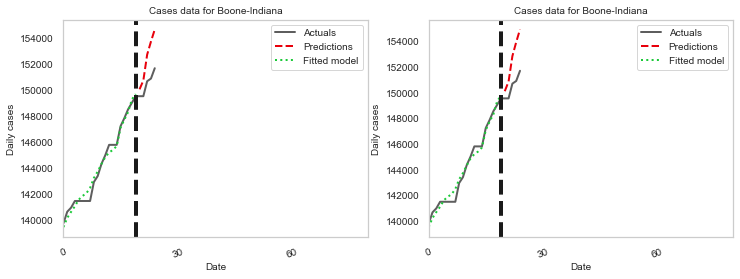

(40, 100)
(5, 100)
tau_hat: 0.6095044323901799
tau_pre: 7.680444440034098e-06
2D for Boone-Indiana True
Bottineau-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.48849402496579003
tau_pre: 4.639497205570218e-06
1D for Bottineau-North Dakota True


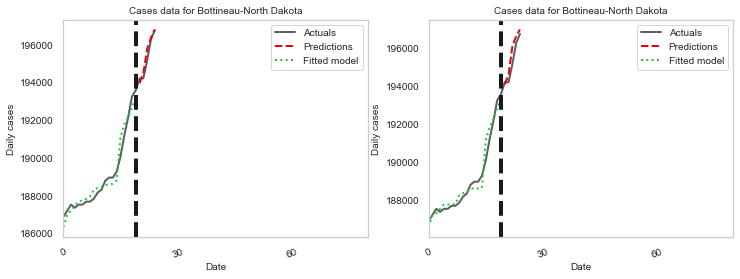

(40, 100)
(5, 100)
tau_hat: 0.5860272891007622
tau_pre: 5.952420469825237e-06
2D for Bottineau-North Dakota True
Bowman-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5463033942020613
tau_pre: 7.0424677189765256e-06
1D for Bowman-North Dakota True


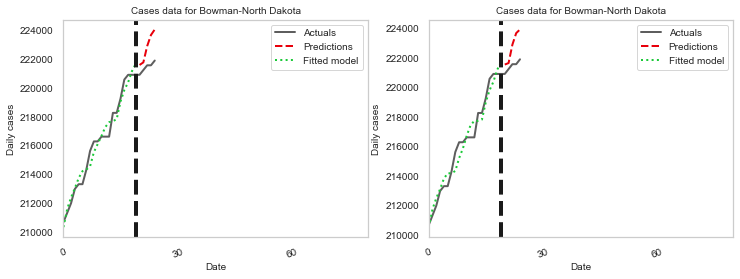

(40, 100)
(5, 100)
tau_hat: 0.6079376227302007
tau_pre: 1.059193676977275e-05
2D for Bowman-North Dakota True
Broadwater-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648457976
tau_pre: 4.079547924435475e-06
1D for Broadwater-Montana True


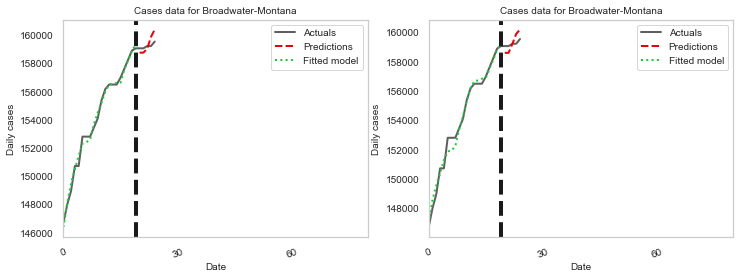

(40, 100)
(5, 100)
tau_hat: 0.5935952209322274
tau_pre: 1.0548200171760843e-05
2D for Broadwater-Montana True
Brookings-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4693765936661024
tau_pre: 2.7074484171452868e-05
1D for Brookings-South Dakota True


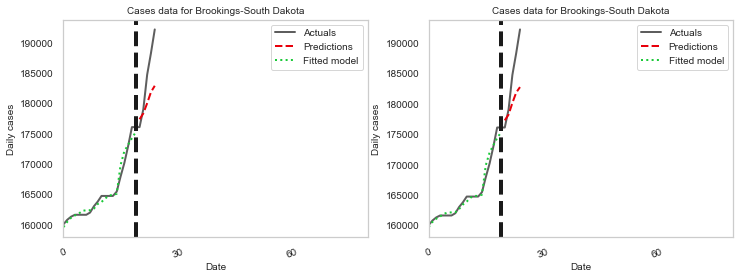

(40, 100)
(5, 100)
tau_hat: 0.5660254203842457
tau_pre: 2.221877085709959e-05
2D for Brookings-South Dakota True
Brown-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4884940249724053
tau_pre: 1.391400559418391e-05
1D for Brown-Indiana True


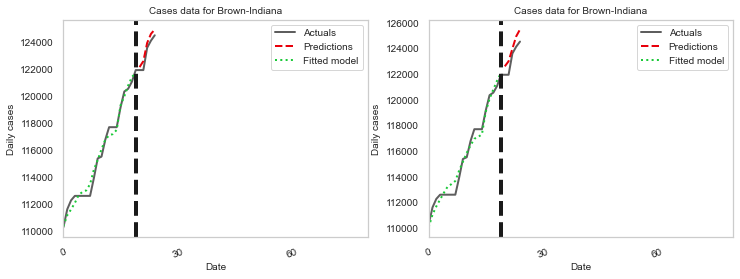

(40, 100)
(5, 100)
tau_hat: 0.5860272891787003
tau_pre: 1.83332345845478e-05
2D for Brown-Indiana True
Brown-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.551354971530288
tau_pre: 1.8662686710241351e-06
1D for Brown-South Dakota True


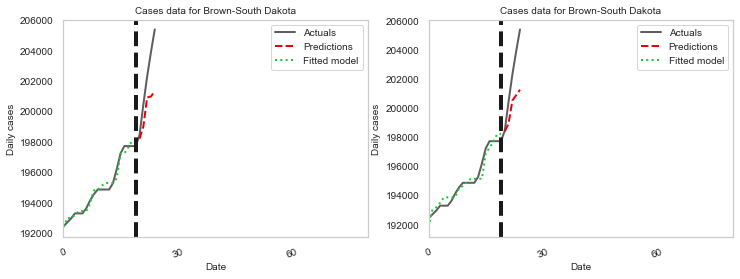

(40, 100)
(5, 100)
tau_hat: 0.6186050431158517
tau_pre: 5.9611613194380335e-06
2D for Brown-South Dakota True
Brule-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.42134744461292395
tau_pre: 8.564151983197762e-06
1D for Brule-South Dakota True


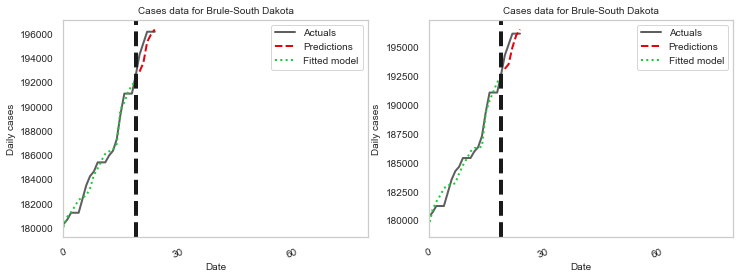

(40, 100)
(5, 100)
tau_hat: 0.4974599729429752
tau_pre: 1.3686004633155595e-05
2D for Brule-South Dakota True
Bryan-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536979329
tau_pre: 1.4306398846674096e-06
1D for Bryan-Oklahoma True


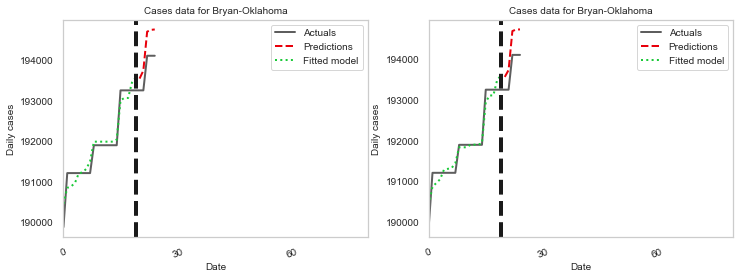

(40, 100)
(5, 100)
tau_hat: 0.6061585095851763
tau_pre: 2.4653772923142614e-06
2D for Bryan-Oklahoma True
Buffalo-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5608335812542995
tau_pre: 2.1850530920038177e-06
1D for Buffalo-South Dakota True


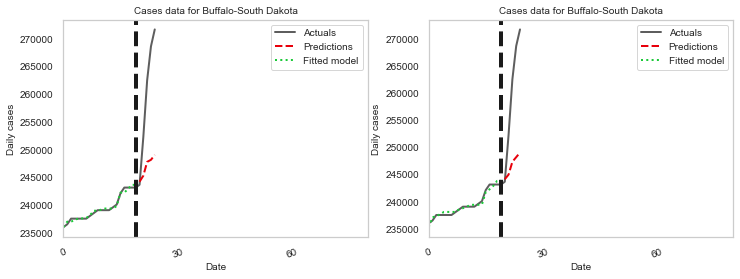

(40, 100)
(5, 100)
tau_hat: 0.6355785790515752
tau_pre: 5.185102799163212e-06
2D for Buffalo-South Dakota True
Burke-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218864467
tau_pre: 1.266442726018751e-06
1D for Burke-North Dakota True


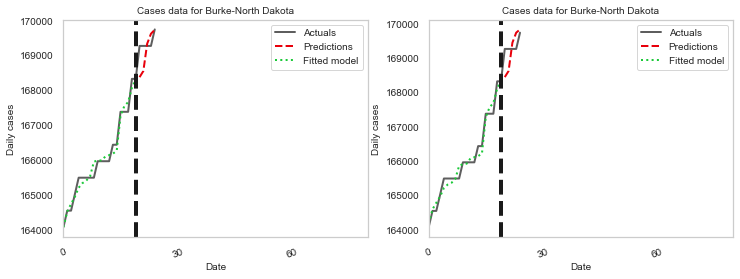

(40, 100)
(5, 100)
tau_hat: 0.6082688361138398
tau_pre: 3.4259356403671814e-06
2D for Burke-North Dakota True
Burleigh-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.48331045828131547
tau_pre: 6.067585259416686e-06
1D for Burleigh-North Dakota True


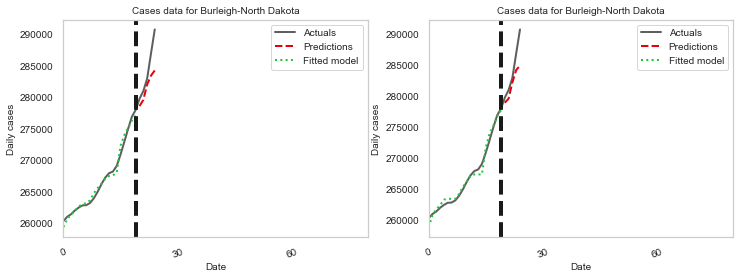

(40, 100)
(5, 100)
tau_hat: 0.5874898697168965
tau_pre: 1.0463178190416432e-05
2D for Burleigh-North Dakota True
Butte-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.546303394208446
tau_pre: 2.5775120334895395e-06
1D for Butte-South Dakota True


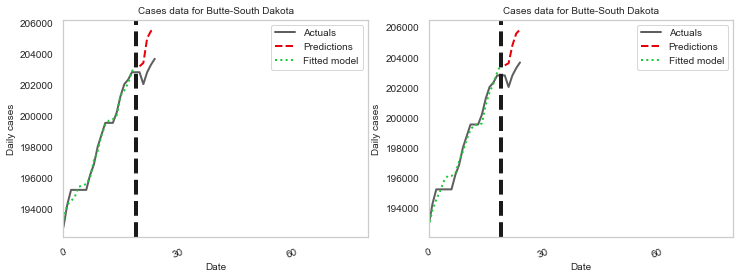

(40, 100)
(5, 100)
tau_hat: 0.6079376227297708
tau_pre: 6.158702163282414e-06
2D for Butte-South Dakota True
Caddo-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5672020078790612
tau_pre: 2.3107495110236664e-06
1D for Caddo-Oklahoma True


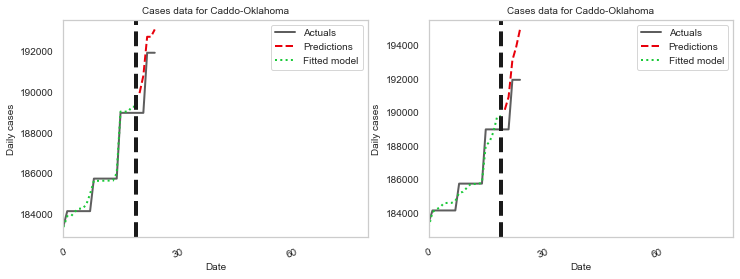

(40, 100)
(5, 100)
tau_hat: 0.6442289221712804
tau_pre: 6.356498437348859e-06
2D for Caddo-Oklahoma True
Caledonia-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648510374
tau_pre: 0.0001588064291070368
1D for Caledonia-Vermont True


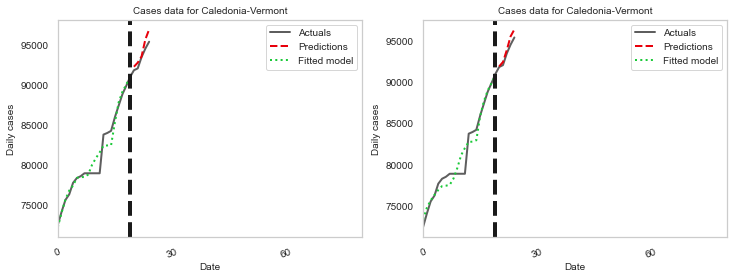

(40, 100)
(5, 100)
tau_hat: 0.5935952209326163
tau_pre: 0.00016741062396632175
2D for Caledonia-Vermont True
Campbell-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5541925549822437
tau_pre: 0.00020276091423154002
1D for Campbell-South Dakota True


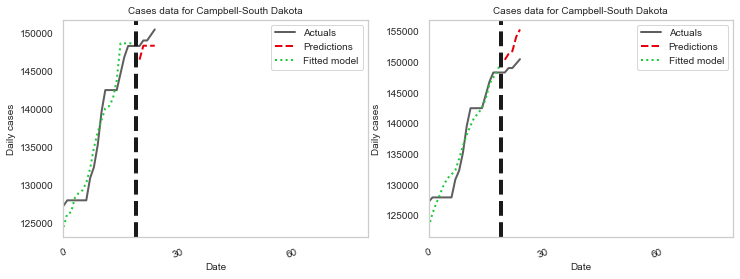

(40, 100)
(5, 100)
tau_hat: 0.6404001130337817
tau_pre: 0.0001796043038648689
2D for Campbell-South Dakota True
Canadian-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5517495354369537
tau_pre: 2.911552904185323e-06
1D for Canadian-Oklahoma True


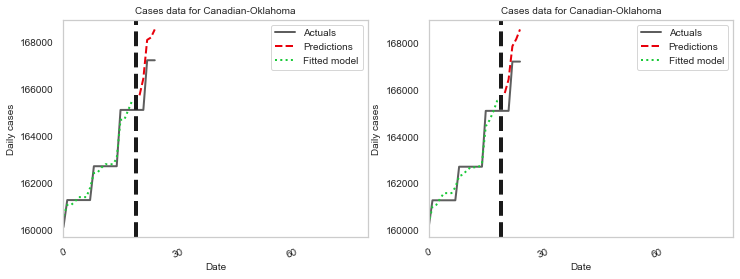

(40, 100)
(5, 100)
tau_hat: 0.61851198972078
tau_pre: 5.016090759645453e-06
2D for Canadian-Oklahoma True
Carbon-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5050250720177387
tau_pre: 3.6557037346626455e-06
1D for Carbon-Montana True


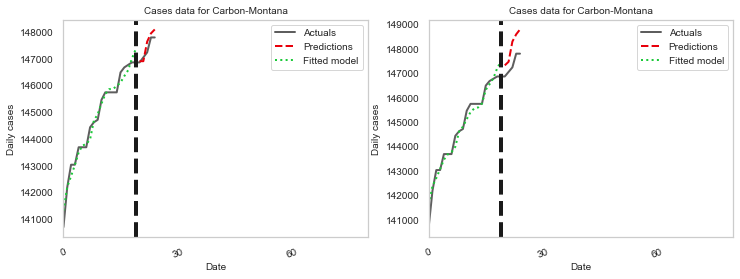

(40, 100)
(5, 100)
tau_hat: 0.6169450854298091
tau_pre: 1.1987944185684789e-05
2D for Carbon-Montana True
Carroll-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648490454
tau_pre: 5.2538177520842e-06
1D for Carroll-Indiana True


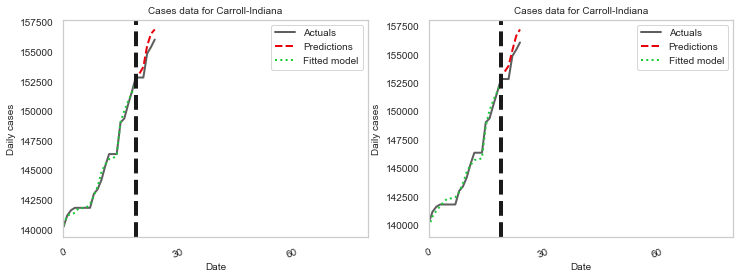

(40, 100)
(5, 100)
tau_hat: 0.5935952209340716
tau_pre: 9.148176563431059e-06
2D for Carroll-Indiana True
Carter-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648547891
tau_pre: 5.071000142027068e-07
1D for Carter-Montana True


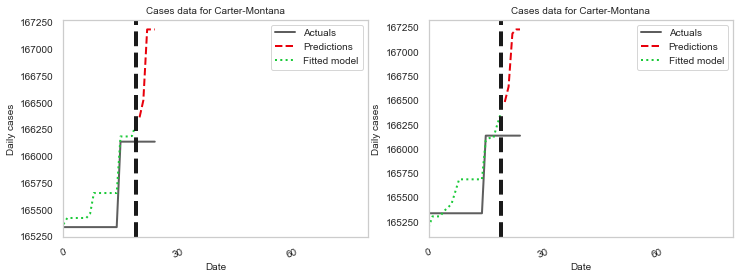

(40, 100)
(5, 100)
tau_hat: 0.5935952209305628
tau_pre: 1.3825052261296657e-06
2D for Carter-Montana True
Carter-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5535025421872408
tau_pre: 1.275720635846974e-06
1D for Carter-Oklahoma True


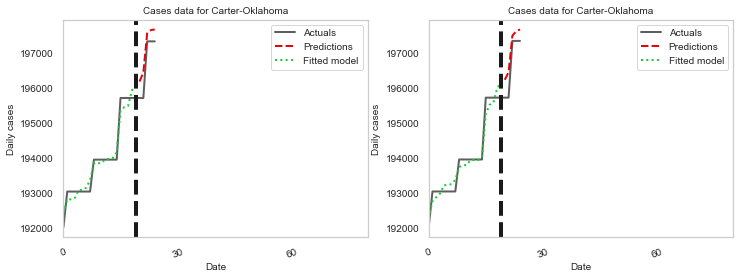

(40, 100)
(5, 100)
tau_hat: 0.6067432897127111
tau_pre: 2.2508467009666566e-06
2D for Carter-Oklahoma True
Cascade-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.47848489639761016
tau_pre: 4.032211145753697e-06
1D for Cascade-Montana True


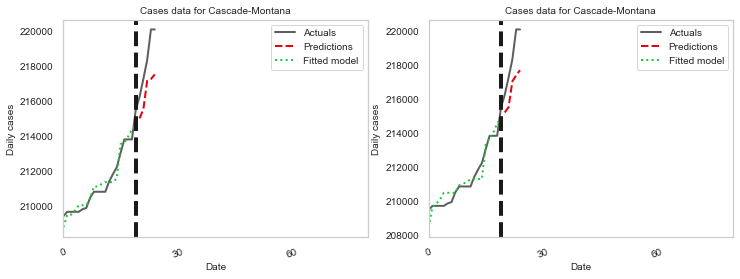

(40, 100)
(5, 100)
tau_hat: 0.5573539266562545
tau_pre: 8.485007494447646e-06
2D for Cascade-Montana True
Cass-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5225247176033285
tau_pre: 4.053099715621517e-06
1D for Cass-Indiana True


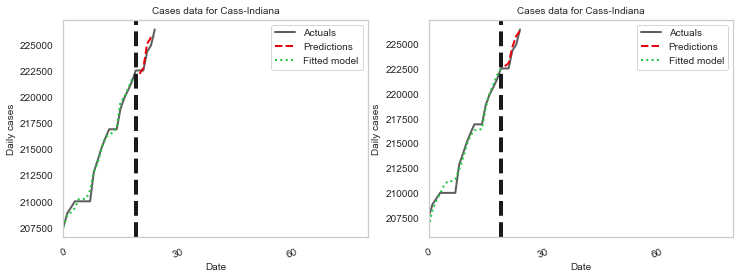

(40, 100)
(5, 100)
tau_hat: 0.6175553516745728
tau_pre: 1.1391526153830808e-05
2D for Cass-Indiana True
Cass-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5671099357280284
tau_pre: 8.45632649021085e-06
1D for Cass-North Dakota True


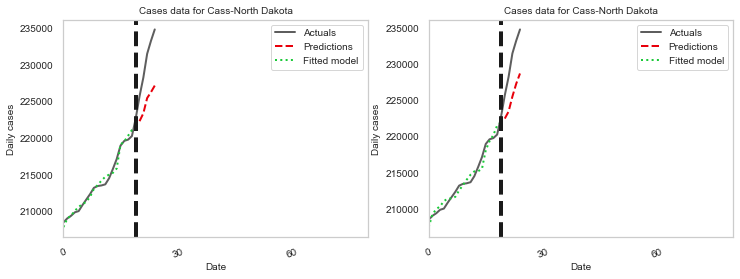

(40, 100)
(5, 100)
tau_hat: 0.6457814401733226
tau_pre: 1.4775401266506171e-05
2D for Cass-North Dakota True
Cavalier-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5642231702206832
tau_pre: 6.357239083221969e-06
1D for Cavalier-North Dakota True


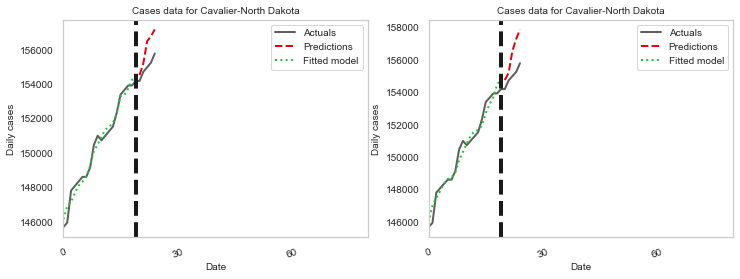

(40, 100)
(5, 100)
tau_hat: 0.6547884057972364
tau_pre: 1.3727666729573805e-05
2D for Cavalier-North Dakota True
Charles Mix-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4693765936645922
tau_pre: 1.2080239585728311e-05
1D for Charles Mix-South Dakota True


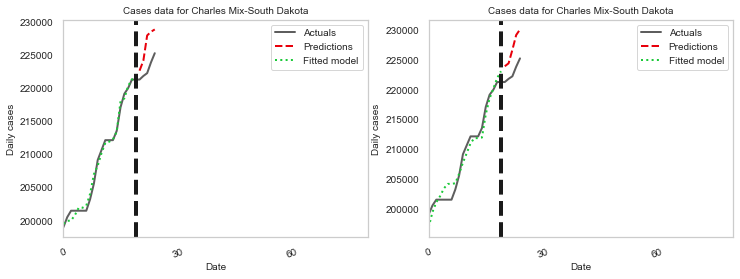

(40, 100)
(5, 100)
tau_hat: 0.5660254203964306
tau_pre: 4.680493827743657e-05
2D for Charles Mix-South Dakota True
Cherokee-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5197248755768934
tau_pre: 7.812048920304605e-07
1D for Cherokee-Oklahoma True


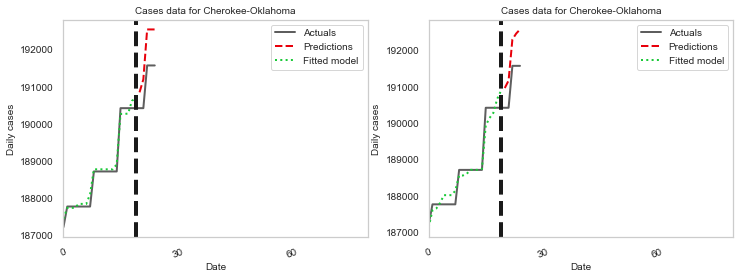

(40, 100)
(5, 100)
tau_hat: 0.6221763666789477
tau_pre: 2.7957768393825344e-06
2D for Cherokee-Oklahoma True
Chittenden-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5485190913949688
tau_pre: 2.864998323621143e-05
1D for Chittenden-Vermont True


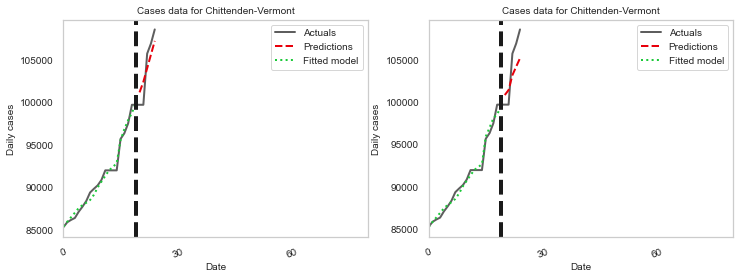

(40, 100)
(5, 100)
tau_hat: 0.6318057727703684
tau_pre: 2.7852996418208885e-05
2D for Chittenden-Vermont True
Choctaw-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648461007
tau_pre: 3.906717453449911e-07
1D for Choctaw-Oklahoma True


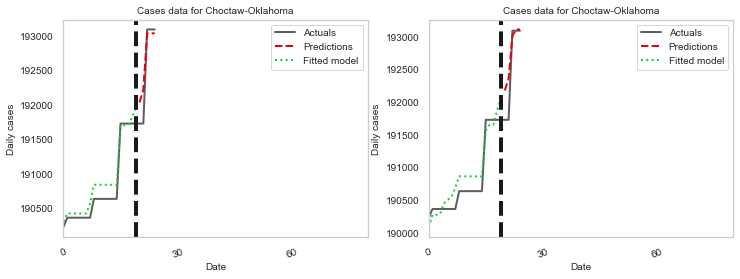

(40, 100)
(5, 100)
tau_hat: 0.5935952209547931
tau_pre: 1.154305976382911e-06
2D for Choctaw-Oklahoma True
Chouteau-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648473037
tau_pre: 5.895788097776344e-06
1D for Chouteau-Montana True


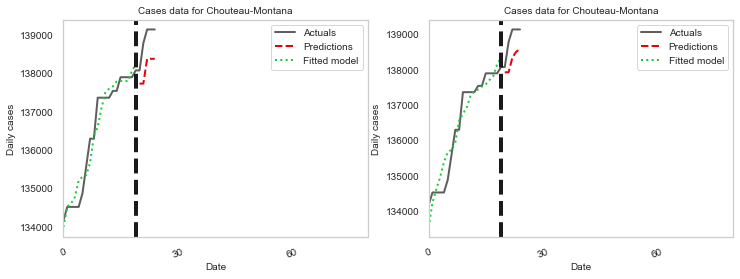

(40, 100)
(5, 100)
tau_hat: 0.593595220936537
tau_pre: 8.819264156729137e-06
2D for Chouteau-Montana True
Cimarron-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648457626
tau_pre: 6.510601802884996e-05
1D for Cimarron-Oklahoma True


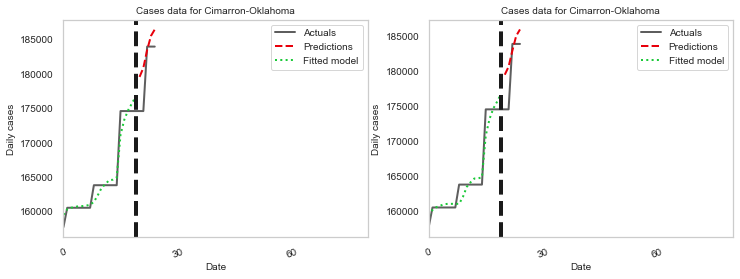

(40, 100)
(5, 100)
tau_hat: 0.5935952209299734
tau_pre: 7.605731981101826e-05
2D for Cimarron-Oklahoma True
Clark-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.560643011706321
tau_pre: 4.695381976965252e-06
1D for Clark-Indiana True


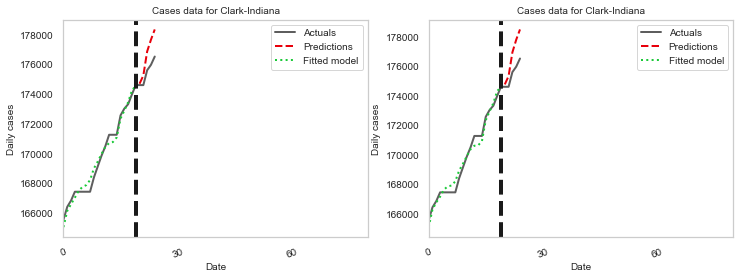

(40, 100)
(5, 100)
tau_hat: 0.6411998862652141
tau_pre: 8.404247055519114e-06
2D for Clark-Indiana True
Clark-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4857281230210235
tau_pre: 2.8795635856857213e-05
1D for Clark-South Dakota True


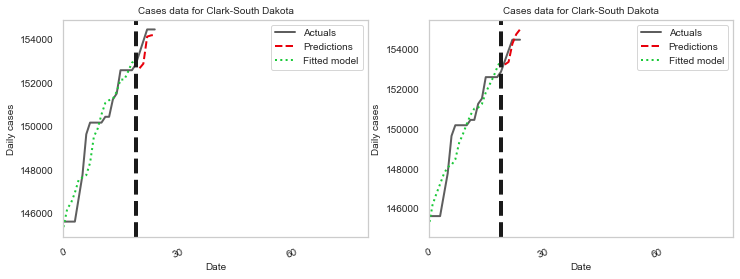

(40, 100)
(5, 100)
tau_hat: 0.5814598003608454
tau_pre: 3.525332943835685e-05
2D for Clark-South Dakota True
Clay-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5040024519947758
tau_pre: 5.208611379481363e-06
1D for Clay-Indiana True


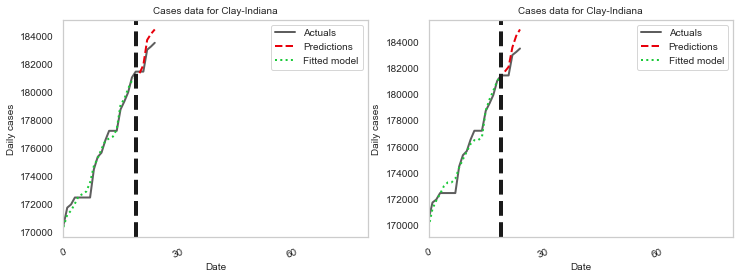

(40, 100)
(5, 100)
tau_hat: 0.5770948320887196
tau_pre: 1.3787486954661609e-05
2D for Clay-Indiana True
Clay-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5321070493298764
tau_pre: 4.935722251317249e-06
1D for Clay-South Dakota True


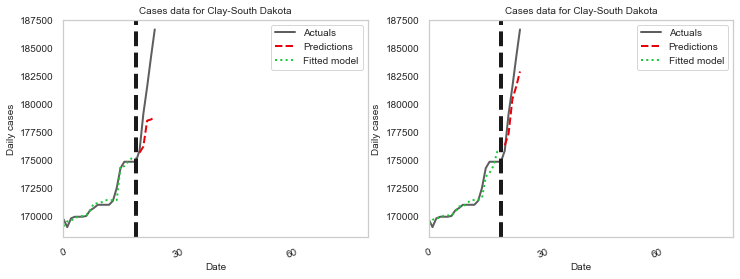

(40, 100)
(5, 100)
tau_hat: 0.6175941091027579
tau_pre: 8.548270350678934e-06
2D for Clay-South Dakota True
Cleveland-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.4321502960609129
tau_pre: 1.964053655415659e-06
1D for Cleveland-Oklahoma True


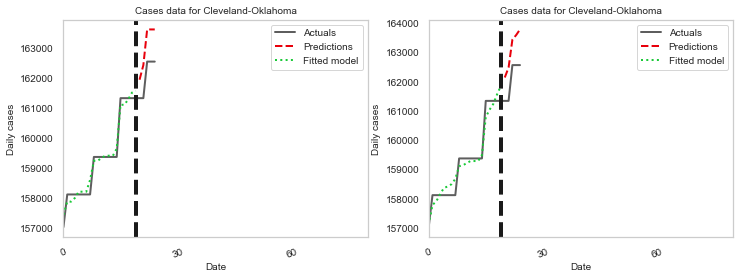

(40, 100)
(5, 100)
tau_hat: 0.5211471812614703
tau_pre: 5.600534113326701e-06
2D for Cleveland-Oklahoma True
Clinton-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5147078530680063
tau_pre: 4.020235168017745e-06
1D for Clinton-Indiana True


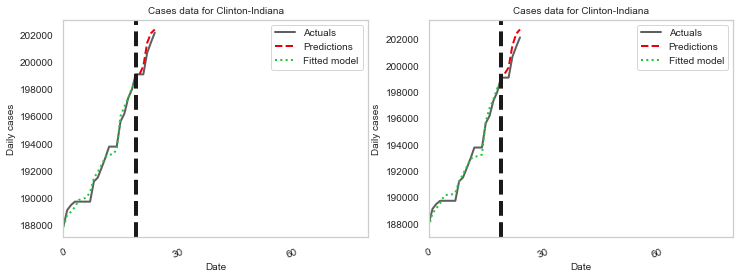

(40, 100)
(5, 100)
tau_hat: 0.6183218662202726
tau_pre: 5.469218290514129e-06
2D for Clinton-Indiana True
Coal-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218602391
tau_pre: 1.3264615702940526e-06
1D for Coal-Oklahoma True


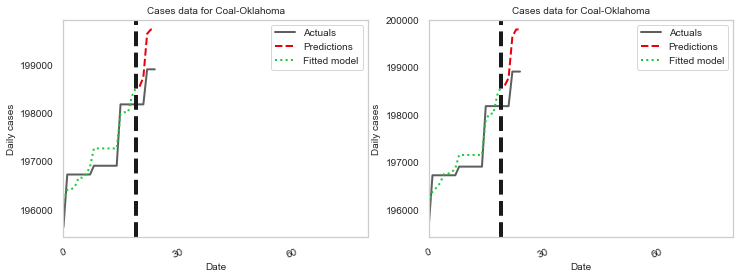

(40, 100)
(5, 100)
tau_hat: 0.6082688361270134
tau_pre: 1.8417261177831415e-06
2D for Coal-Oklahoma True
Codington-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4213474446032913
tau_pre: 6.254189507614435e-06
1D for Codington-South Dakota True


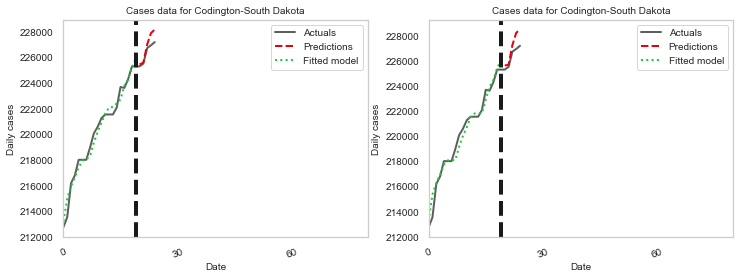

(40, 100)
(5, 100)
tau_hat: 0.4974599729412567
tau_pre: 1.5027887429321079e-05
2D for Codington-South Dakota True
Comanche-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5643530640007288
tau_pre: 1.1508442322533287e-06
1D for Comanche-Oklahoma True


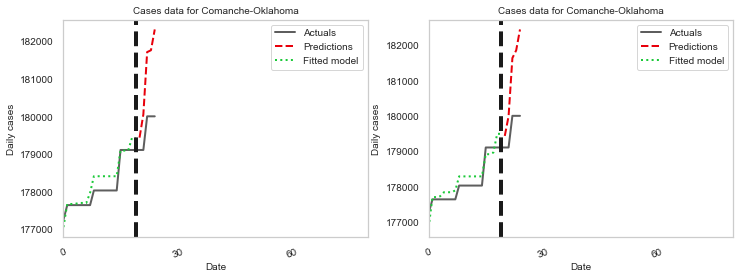

(40, 100)
(5, 100)
tau_hat: 0.6466207427258579
tau_pre: 2.9467473049846146e-06
2D for Comanche-Oklahoma True
Corson-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648227345
tau_pre: 2.6520666943406547e-06
1D for Corson-South Dakota True


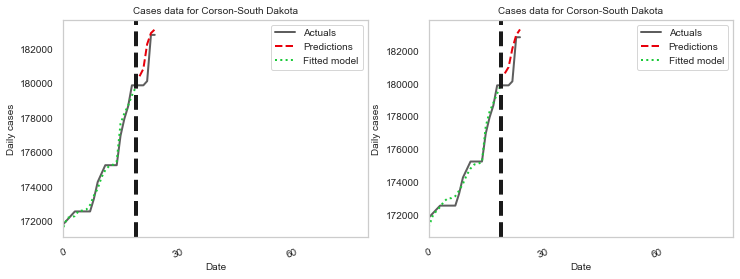

(40, 100)
(5, 100)
tau_hat: 0.5935952209246579
tau_pre: 4.230262214084728e-06
2D for Corson-South Dakota True
Cotton-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.48700041127068316
tau_pre: 7.938031631080028e-07
1D for Cotton-Oklahoma True


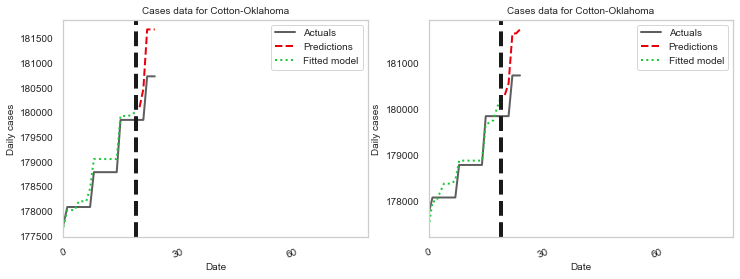

(40, 100)
(5, 100)
tau_hat: 0.5799456469739315
tau_pre: 2.7361807772261106e-06
2D for Cotton-Oklahoma True
Craig-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.42307894831676357
tau_pre: 3.448665492214463e-06
1D for Craig-Oklahoma True


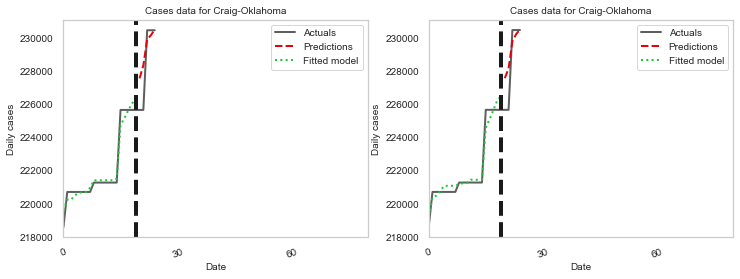

(40, 100)
(5, 100)
tau_hat: 0.5171614363178066
tau_pre: 7.351415785356641e-06
2D for Craig-Oklahoma True
Crawford-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.537311564844208
tau_pre: 1.6625279009865498e-06
1D for Crawford-Indiana True


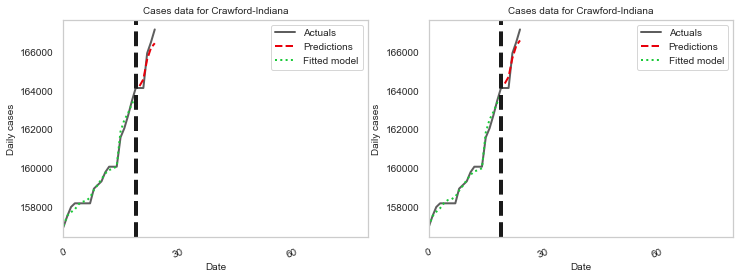

(40, 100)
(5, 100)
tau_hat: 0.5935952209263314
tau_pre: 2.993337795240175e-06
2D for Crawford-Indiana True
Creek-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5535025421566493
tau_pre: 3.839107459696891e-06
1D for Creek-Oklahoma True


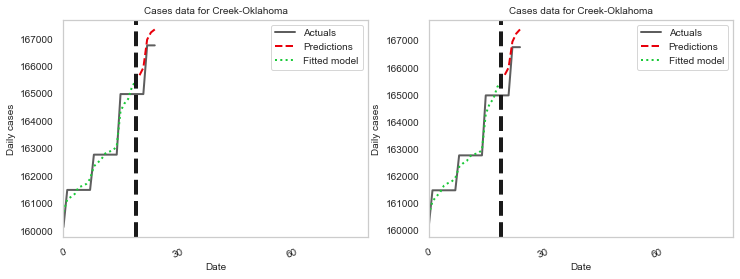

(40, 100)
(5, 100)
tau_hat: 0.6067432896997184
tau_pre: 4.705410850779974e-06
2D for Creek-Oklahoma True
Custer-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5614759402647052
tau_pre: 1.1396295372429938e-06
1D for Custer-Montana True


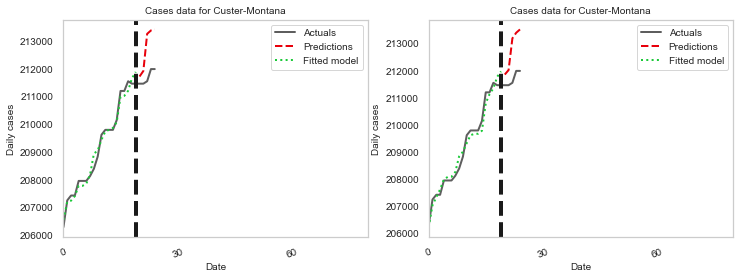

(40, 100)
(5, 100)
tau_hat: 0.6144953310110021
tau_pre: 3.073577235567781e-06
2D for Custer-Montana True
Custer-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5050250720253215
tau_pre: 1.7830624813071175e-05
1D for Custer-Oklahoma True


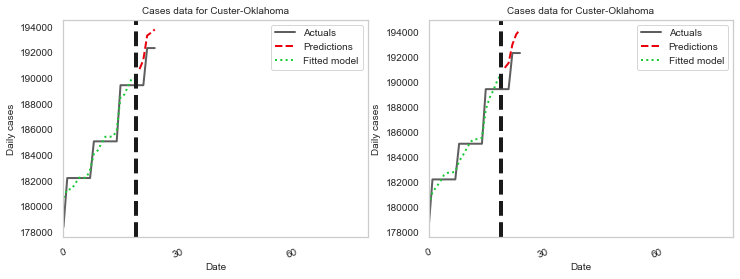

(40, 100)
(5, 100)
tau_hat: 0.6169450854273
tau_pre: 2.069345656233449e-05
2D for Custer-Oklahoma True
Custer-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4817793762086955
tau_pre: 2.5282599530207475e-06
1D for Custer-South Dakota True


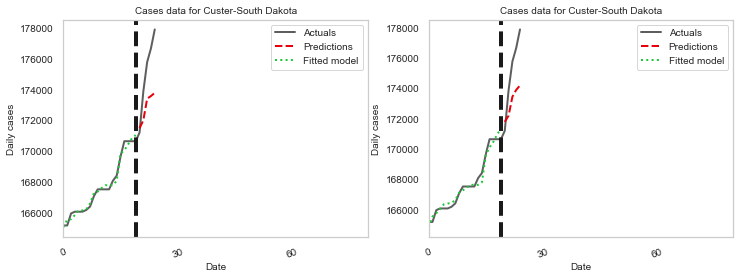

(40, 100)
(5, 100)
tau_hat: 0.5832263331091649
tau_pre: 6.580651750964542e-06
2D for Custer-South Dakota True
Daniels-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536998957
tau_pre: 4.466846839197026e-06
1D for Daniels-Montana True


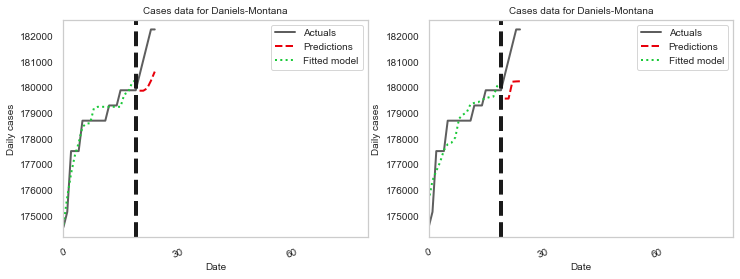

(40, 100)
(5, 100)
tau_hat: 0.6061585095872054
tau_pre: 1.1790535829196355e-05
2D for Daniels-Montana True
Daviess-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648424912
tau_pre: 1.988841666949183e-06
1D for Daviess-Indiana True


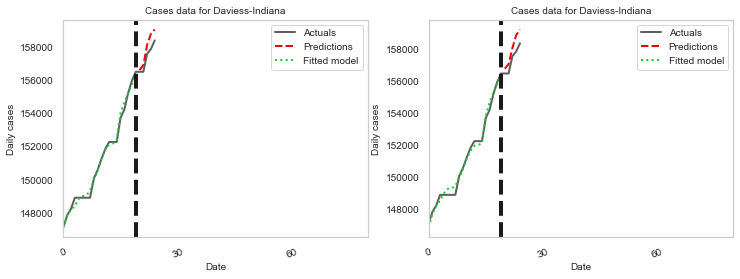

(40, 100)
(5, 100)
tau_hat: 0.5935952209314317
tau_pre: 4.126784042528022e-06
2D for Daviess-Indiana True
Davison-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5519765256727852
tau_pre: 4.322648867570449e-06
1D for Davison-South Dakota True


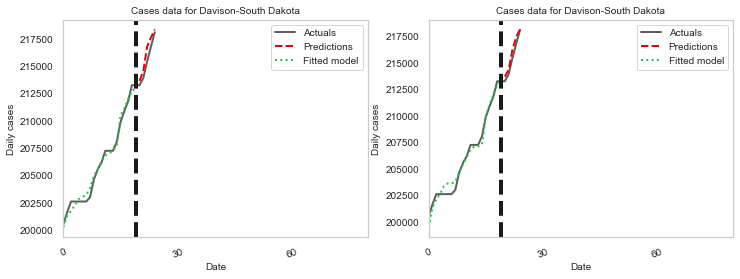

(40, 100)
(5, 100)
tau_hat: 0.6232881219922598
tau_pre: 9.099610106219559e-06
2D for Davison-South Dakota True
Dawson-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648528834
tau_pre: 2.9412570460151673e-06
1D for Dawson-Montana True


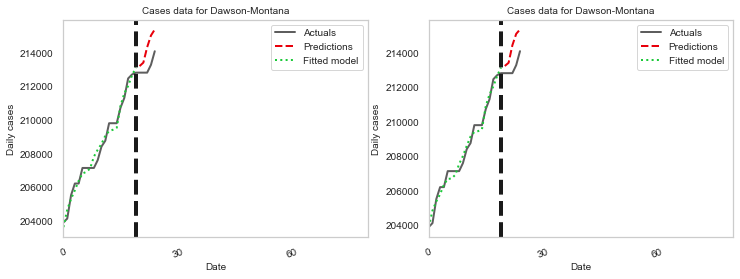

(40, 100)
(5, 100)
tau_hat: 0.593595220930348
tau_pre: 4.4235492982602365e-06
2D for Dawson-Montana True
Day-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5691174943523961
tau_pre: 4.028790276204196e-06
1D for Day-South Dakota True


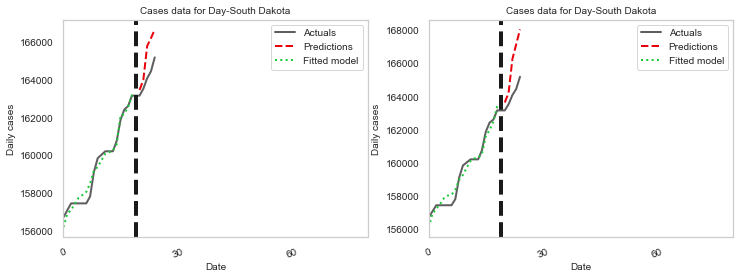

(40, 100)
(5, 100)
tau_hat: 0.6557612449625457
tau_pre: 6.9182708879240565e-06
2D for Day-South Dakota True
DeKalb-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536996109
tau_pre: 1.0995559351762356e-05
1D for DeKalb-Indiana True


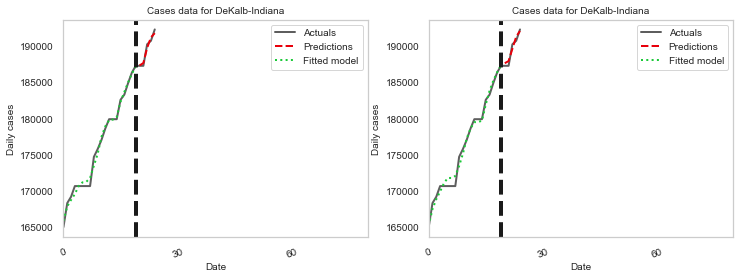

(40, 100)
(5, 100)
tau_hat: 0.6061585095896816
tau_pre: 1.860022718962595e-05
2D for DeKalb-Indiana True
Dearborn-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5705919319970699
tau_pre: 3.923119627505887e-06
1D for Dearborn-Indiana True


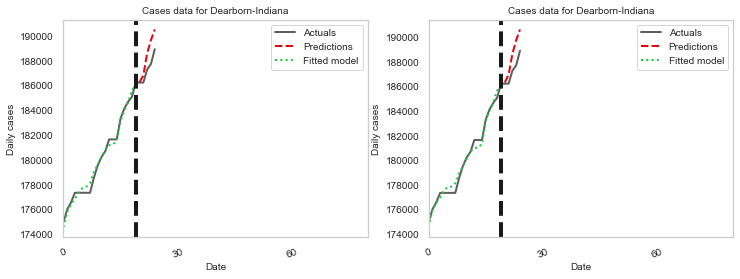

(40, 100)
(5, 100)
tau_hat: 0.6601677436628004
tau_pre: 8.570349764613874e-06
2D for Dearborn-Indiana True
Decatur-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5050250720383668
tau_pre: 4.599109767478442e-06
1D for Decatur-Indiana True


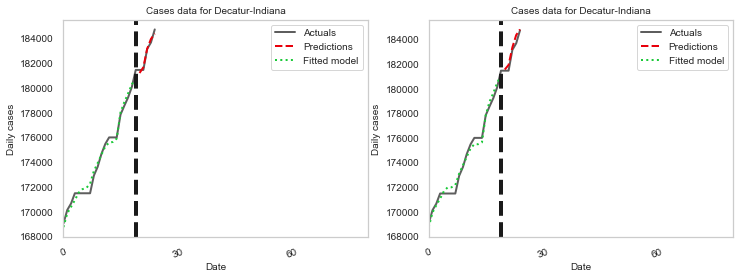

(40, 100)
(5, 100)
tau_hat: 0.6169450854328931
tau_pre: 5.802437790592686e-06
2D for Decatur-Indiana True
Deer Lodge-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5649808457038483
tau_pre: 1.325750044422671e-06
1D for Deer Lodge-Montana True


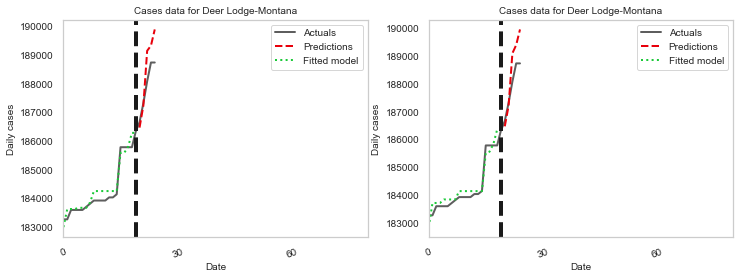

(40, 100)
(5, 100)
tau_hat: 0.6387544775751356
tau_pre: 3.265240119829924e-06
2D for Deer Lodge-Montana True
Delaware-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5108036436727583
tau_pre: 5.463369116146613e-06
1D for Delaware-Indiana True


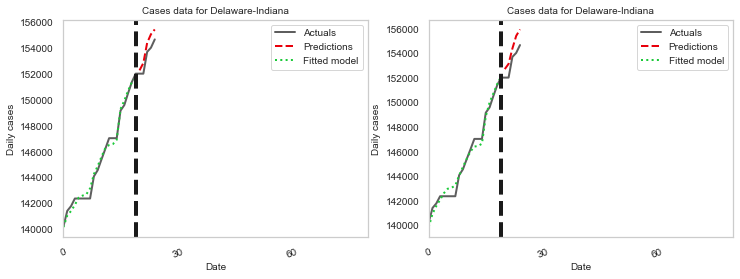

(40, 100)
(5, 100)
tau_hat: 0.6204346875124265
tau_pre: 8.679462007796394e-06
2D for Delaware-Indiana True
Delaware-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648166733
tau_pre: 4.231159679281027e-06
1D for Delaware-Oklahoma True


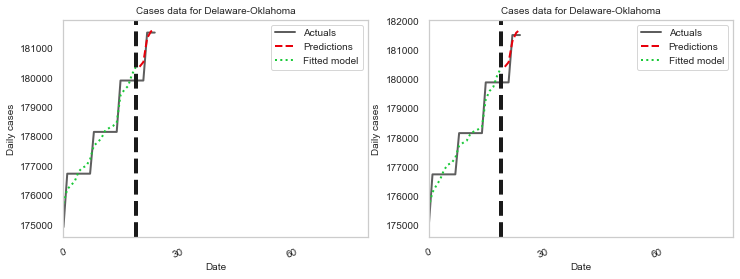

(40, 100)
(5, 100)
tau_hat: 0.5935952209144884
tau_pre: 4.927479216820307e-06
2D for Delaware-Oklahoma True
Deuel-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5267568248502138
tau_pre: 7.668022632102576e-06
1D for Deuel-South Dakota True


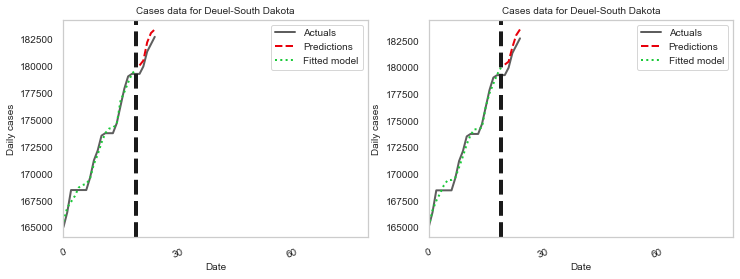

(40, 100)
(5, 100)
tau_hat: 0.6231553196705817
tau_pre: 1.1320001581887157e-05
2D for Deuel-South Dakota True
Dewey-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967146496
tau_pre: 2.901868336047786e-05
1D for Dewey-Oklahoma True


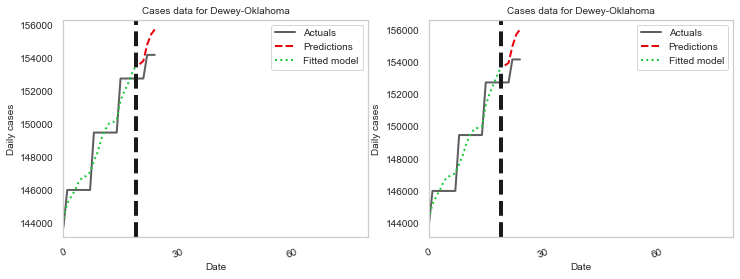

(40, 100)
(5, 100)
tau_hat: 0.6108728043978332
tau_pre: 3.0640620311072756e-05
2D for Dewey-Oklahoma True
Dewey-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5541925549805423
tau_pre: 2.279135528185672e-05
1D for Dewey-South Dakota True


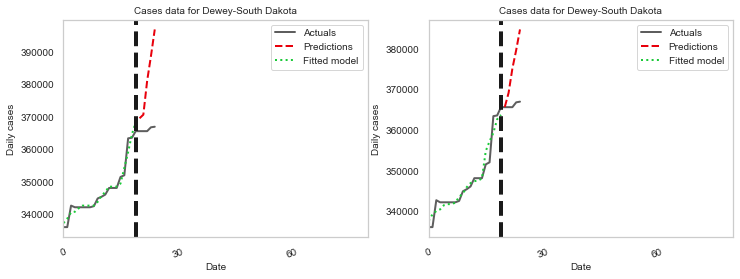

(40, 100)
(5, 100)
tau_hat: 0.6404001130341211
tau_pre: 3.830771319994018e-05
2D for Dewey-South Dakota True
Dickey-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4230751521041352
tau_pre: 1.3609653653104257e-05
1D for Dickey-North Dakota True


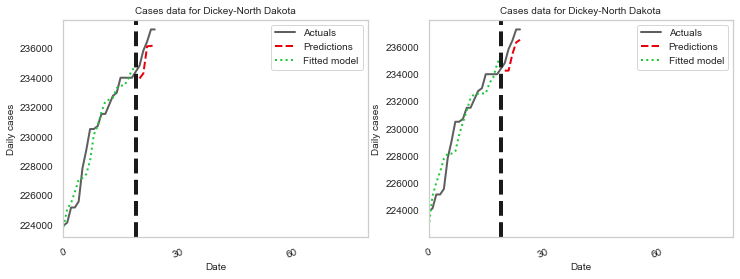

(40, 100)
(5, 100)
tau_hat: 0.5126879706187293
tau_pre: 3.360317472451747e-05
2D for Dickey-North Dakota True
Divide-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536960452
tau_pre: 3.7248591055069288e-06
1D for Divide-North Dakota True


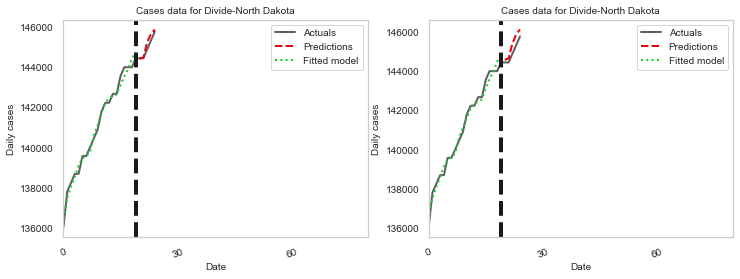

(40, 100)
(5, 100)
tau_hat: 0.606158509576798
tau_pre: 9.499990403219013e-06
2D for Divide-North Dakota True
Douglas-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.48331045829064817
tau_pre: 1.1847102245870664e-05
1D for Douglas-South Dakota True


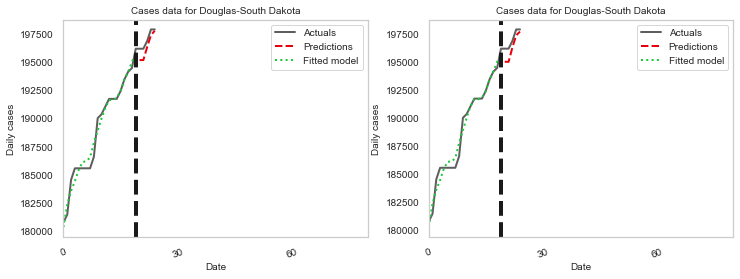

(40, 100)
(5, 100)
tau_hat: 0.5874898696914037
tau_pre: 1.4251138423243513e-05
2D for Douglas-South Dakota True
Dubois-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5553123104531016
tau_pre: 1.014285434424817e-06
1D for Dubois-Indiana True


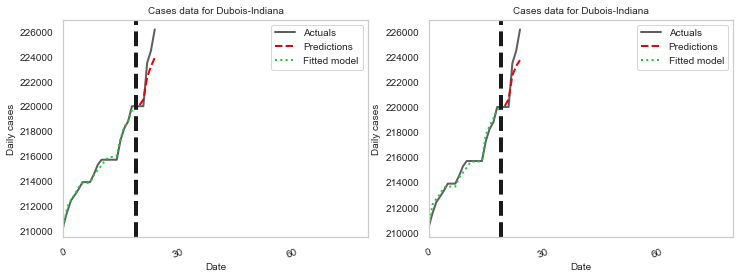

(40, 100)
(5, 100)
tau_hat: 0.626519385557513
tau_pre: 5.813393076118265e-06
2D for Dubois-Indiana True
Dunn-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967393691
tau_pre: 9.761546751964933e-06
1D for Dunn-North Dakota True


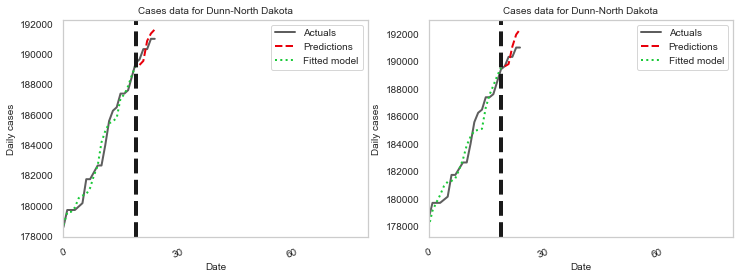

(40, 100)
(5, 100)
tau_hat: 0.6108728044054936
tau_pre: 1.5395531785726566e-05
2D for Dunn-North Dakota True
Eddy-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.48331045827877567
tau_pre: 2.9660418388511538e-06
1D for Eddy-North Dakota True


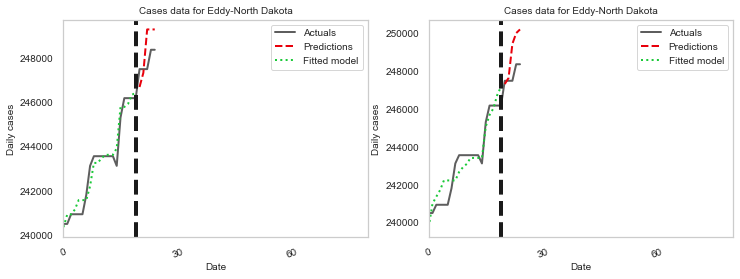

(40, 100)
(5, 100)
tau_hat: 0.5874898696858036
tau_pre: 1.4756858880719923e-05
2D for Eddy-North Dakota True
Edmunds-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5200790342891215
tau_pre: 2.330330448598612e-06
1D for Edmunds-South Dakota True


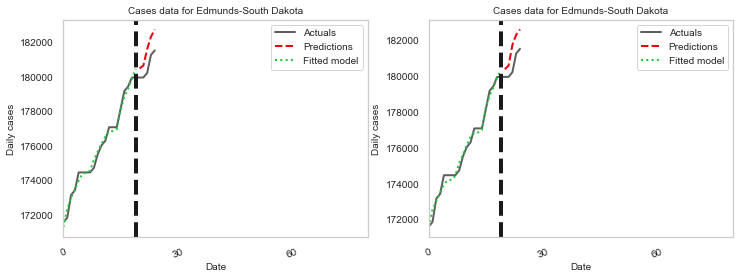

(40, 100)
(5, 100)
tau_hat: 0.6234264168773934
tau_pre: 3.4646241517735324e-06
2D for Edmunds-South Dakota True
Elkhart-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536951669
tau_pre: 2.4272314023036236e-06
1D for Elkhart-Indiana True


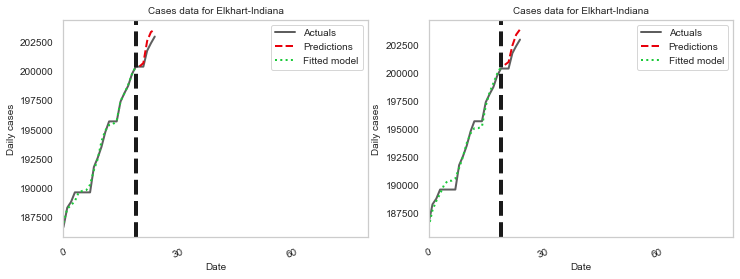

(40, 100)
(5, 100)
tau_hat: 0.6061585095831442
tau_pre: 8.192422066406336e-06
2D for Elkhart-Indiana True
Ellis-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648418904
tau_pre: 2.0120972351601733e-05
1D for Ellis-Oklahoma True


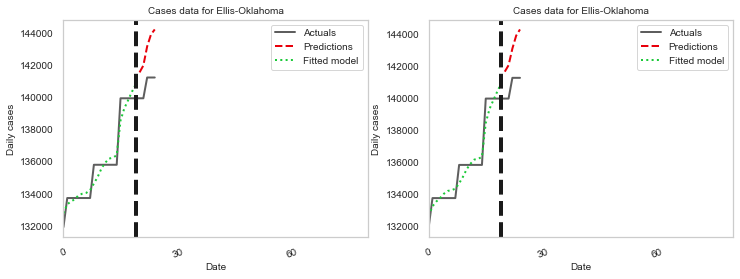

(40, 100)
(5, 100)
tau_hat: 0.5935952209256804
tau_pre: 2.0788553436230246e-05
2D for Ellis-Oklahoma True
Emmons-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.537311564847065
tau_pre: 2.0394692384473716e-06
1D for Emmons-North Dakota True


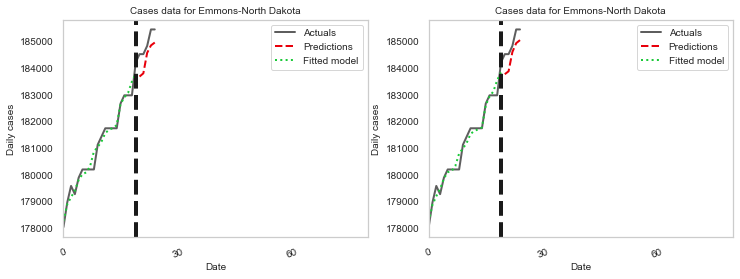

(40, 100)
(5, 100)
tau_hat: 0.5935952209325785
tau_pre: 2.636979341576754e-06
2D for Emmons-North Dakota True
Essex-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5463033941829295
tau_pre: 8.669541715908956e-05
1D for Essex-Vermont True


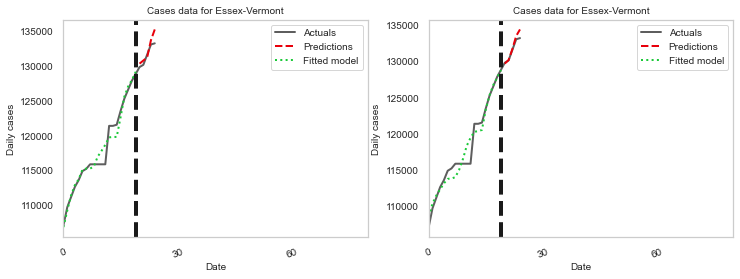

(40, 100)
(5, 100)
tau_hat: 0.6079376227274355
tau_pre: 0.0001104804960511989
2D for Essex-Vermont True
Fall River-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5676966908891161
tau_pre: 8.495957522452972e-06
1D for Fall River-South Dakota True


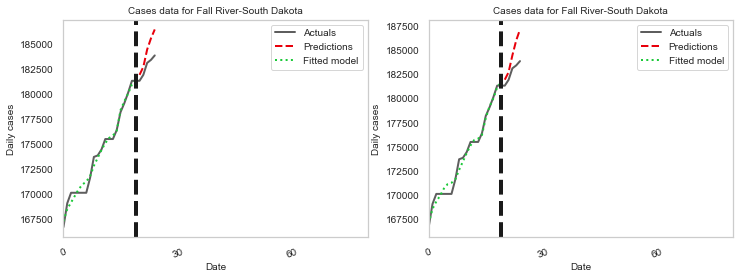

(40, 100)
(5, 100)
tau_hat: 0.6473952298778339
tau_pre: 1.2568552234430978e-05
2D for Fall River-South Dakota True
Fallon-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648473898
tau_pre: 3.172184346417477e-05
1D for Fallon-Montana True


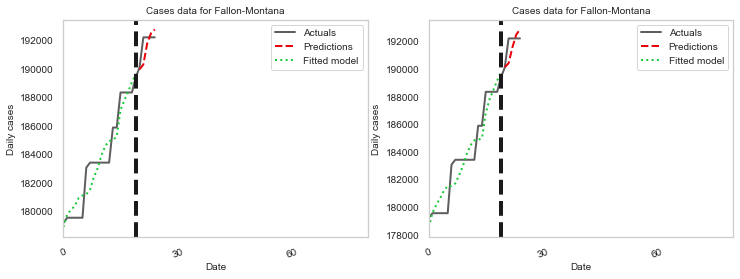

(40, 100)
(5, 100)
tau_hat: 0.5935952209444663
tau_pre: 3.553317274905404e-05
2D for Fallon-Montana True
Faulk-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.47848489639207475
tau_pre: 3.494768021557352e-06
1D for Faulk-South Dakota True


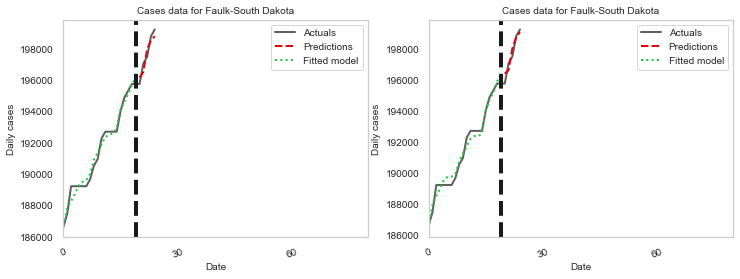

(40, 100)
(5, 100)
tau_hat: 0.5573539266375873
tau_pre: 8.392249957928618e-06
2D for Faulk-South Dakota True
Fayette-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5463033942038977
tau_pre: 5.1507793073804545e-06
1D for Fayette-Indiana True


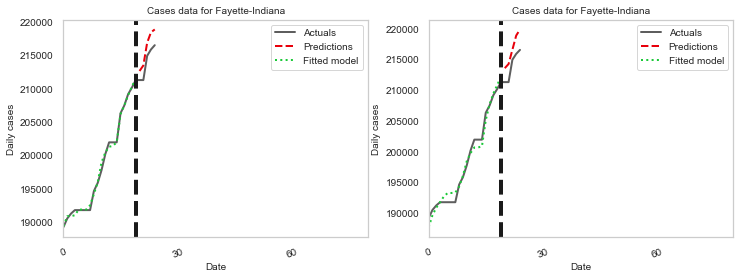

(40, 100)
(5, 100)
tau_hat: 0.6079376227341946
tau_pre: 2.4471809288696228e-05
2D for Fayette-Indiana True
Fergus-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5090010093929369
tau_pre: 1.7456462039457462e-06
1D for Fergus-Montana True


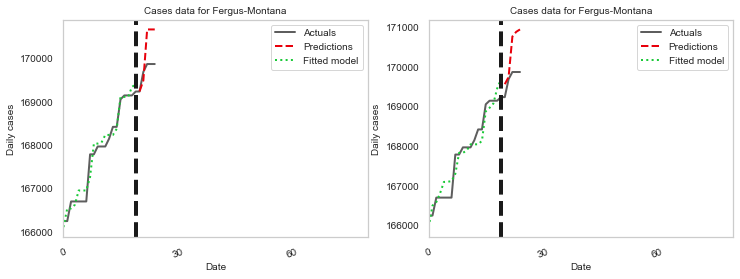

(40, 100)
(5, 100)
tau_hat: 0.6200786015981473
tau_pre: 5.26271446655023e-06
2D for Fergus-Montana True
Flathead-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5535025421555918
tau_pre: 1.1773390519902476e-06
1D for Flathead-Montana True


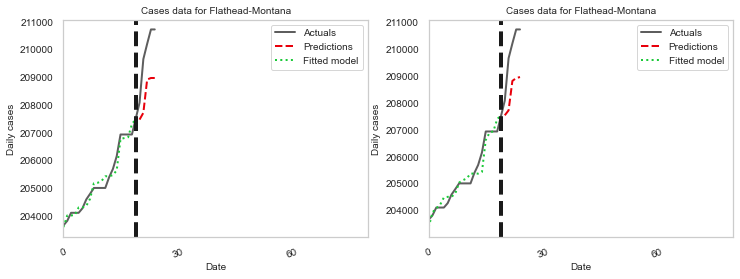

(40, 100)
(5, 100)
tau_hat: 0.6067432897016236
tau_pre: 3.266864914615866e-06
2D for Flathead-Montana True
Floyd-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5558012717423596
tau_pre: 5.3906788194992804e-06
1D for Floyd-Indiana True


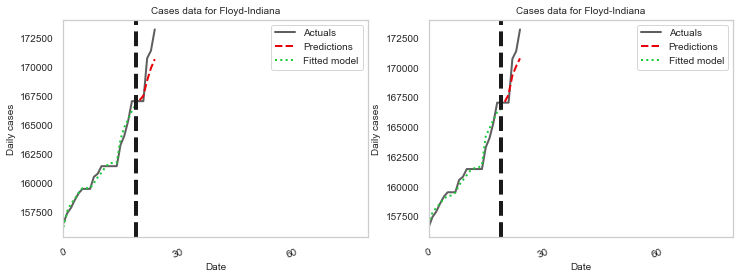

(40, 100)
(5, 100)
tau_hat: 0.6221917259756515
tau_pre: 8.628037545888156e-06
2D for Floyd-Indiana True
Foster-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5466899646970388
tau_pre: 1.5726784270085343e-06
1D for Foster-North Dakota True


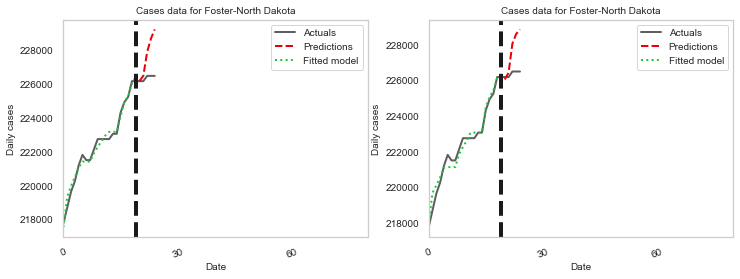

(40, 100)
(5, 100)
tau_hat: 0.6175602454348528
tau_pre: 6.036878082705231e-06
2D for Foster-North Dakota True
Fountain-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5200790342861891
tau_pre: 1.629924397716905e-05
1D for Fountain-Indiana True


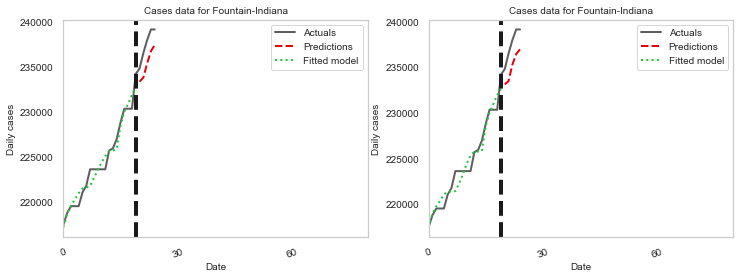

(40, 100)
(5, 100)
tau_hat: 0.6234264168626883
tau_pre: 2.2626770364212556e-05
2D for Fountain-Indiana True
Franklin-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648467639
tau_pre: 6.927806321174896e-06
1D for Franklin-Indiana True


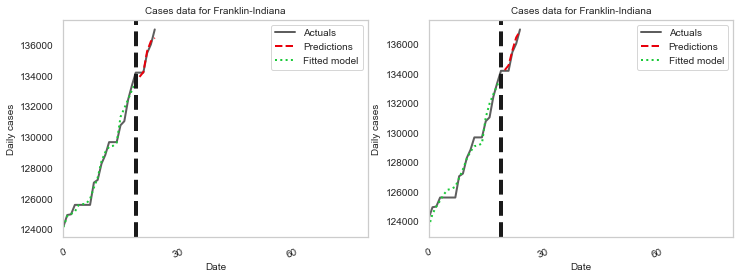

(40, 100)
(5, 100)
tau_hat: 0.5935952209326631
tau_pre: 1.2650446220168035e-05
2D for Franklin-Indiana True
Franklin-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.537311564855905
tau_pre: 7.024283278901884e-05
1D for Franklin-Vermont True


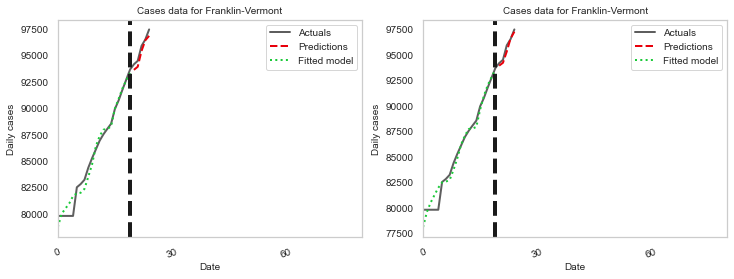

(40, 100)
(5, 100)
tau_hat: 0.5935952209332694
tau_pre: 7.580132008468582e-05
2D for Franklin-Vermont True
Fulton-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218768377
tau_pre: 3.341007908990536e-06
1D for Fulton-Indiana True


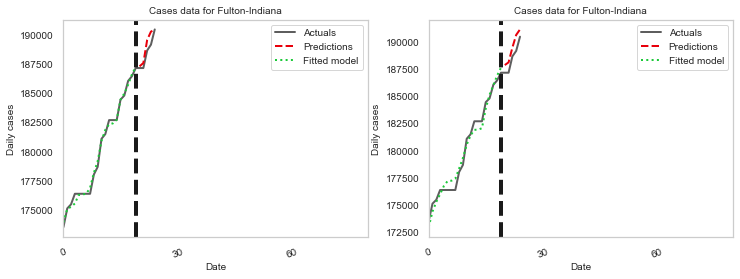

(40, 100)
(5, 100)
tau_hat: 0.608268836119901
tau_pre: 1.3224035251980441e-05
2D for Fulton-Indiana True
Gallatin-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5606430117094595
tau_pre: 1.6929057987394564e-06
1D for Gallatin-Montana True


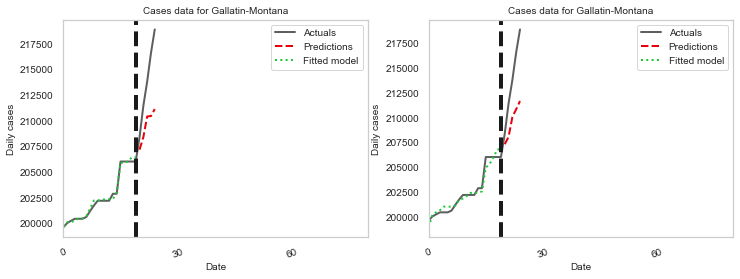

(40, 100)
(5, 100)
tau_hat: 0.6411998862669555
tau_pre: 6.31354601767887e-06
2D for Gallatin-Montana True
Garfield-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.568140596717689
tau_pre: 1.4341036866072404e-05
1D for Garfield-Montana True


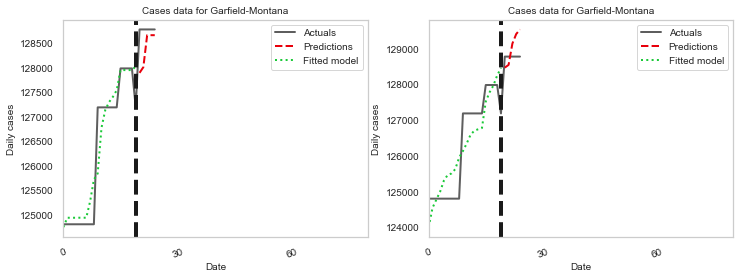

(40, 100)
(5, 100)
tau_hat: 0.6108728044136394
tau_pre: 2.83574883014949e-05
2D for Garfield-Montana True
Garfield-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.4900805852981291
tau_pre: 1.5990636540487554e-06
1D for Garfield-Oklahoma True


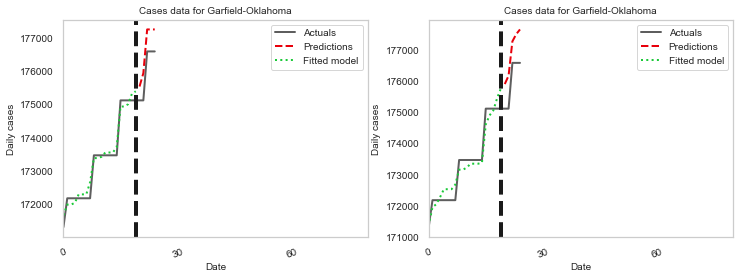

(40, 100)
(5, 100)
tau_hat: 0.5896494831283422
tau_pre: 5.193241404781769e-06
2D for Garfield-Oklahoma True
Garvin-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.526756824845609
tau_pre: 1.8665870696383573e-06
1D for Garvin-Oklahoma True


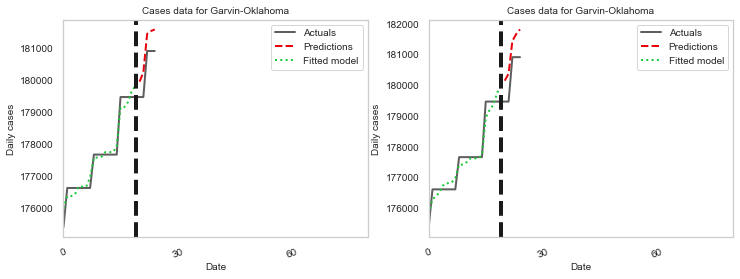

(40, 100)
(5, 100)
tau_hat: 0.6231553196792661
tau_pre: 4.276337149396565e-06
2D for Garvin-Oklahoma True
Gibson-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5220028870838451
tau_pre: 3.6159309267206363e-06
1D for Gibson-Indiana True


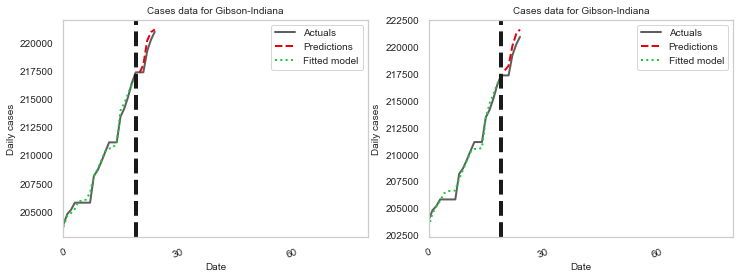

(40, 100)
(5, 100)
tau_hat: 0.6282157351268733
tau_pre: 6.786877356211274e-06
2D for Gibson-Indiana True
Glacier-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.568509962378231
tau_pre: 1.7502248873586604e-06
1D for Glacier-Montana True


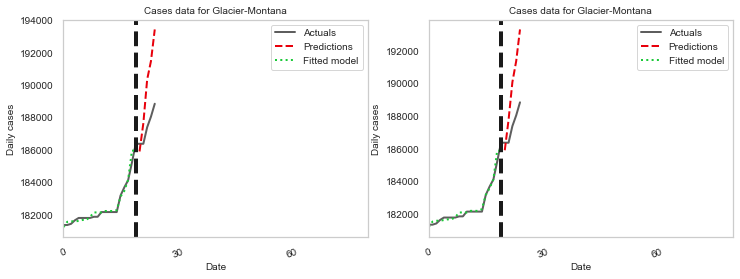

(40, 100)
(5, 100)
tau_hat: 0.6569921617604814
tau_pre: 2.0938404599374733e-06
2D for Glacier-Montana True
Golden Valley-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5225247176075118
tau_pre: 1.846412429052855e-05
1D for Golden Valley-Montana True


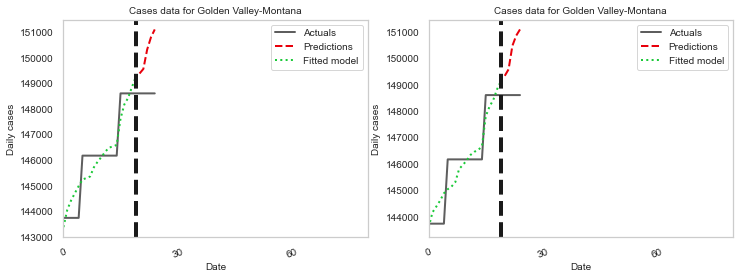

(40, 100)
(5, 100)
tau_hat: 0.6175553516783917
tau_pre: 1.7966761601104435e-05
2D for Golden Valley-Montana True
Golden Valley-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648508081
tau_pre: 1.1633500775962568e-06
1D for Golden Valley-North Dakota True


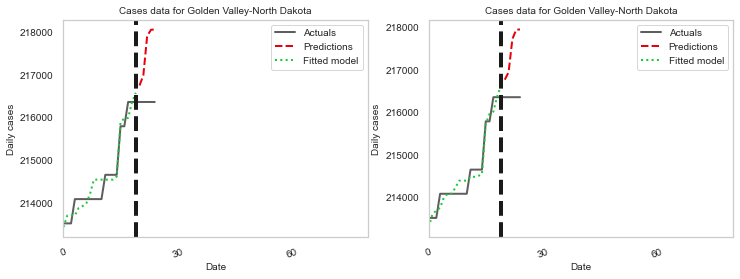

(40, 100)
(5, 100)
tau_hat: 0.5935952209299387
tau_pre: 9.091410296512883e-07
2D for Golden Valley-North Dakota True
Grady-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.537311564841101
tau_pre: 1.1755142738574456e-05
1D for Grady-Oklahoma True


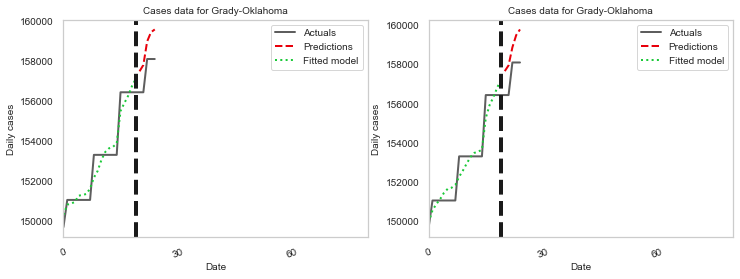

(40, 100)
(5, 100)
tau_hat: 0.5935952209346181
tau_pre: 1.342404225620495e-05
2D for Grady-Oklahoma True
Grand Forks-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.563684601805286
tau_pre: 1.0238046676553708e-05
1D for Grand Forks-North Dakota True


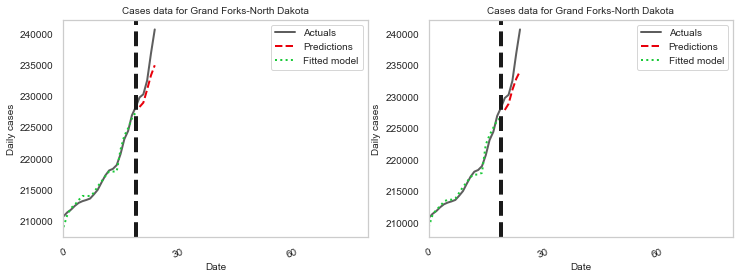

(40, 100)
(5, 100)
tau_hat: 0.6361257963880561
tau_pre: 1.5452301873164145e-05
2D for Grand Forks-North Dakota True
Grand Isle-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5685099623777069
tau_pre: 6.320166552282022e-05
1D for Grand Isle-Vermont True


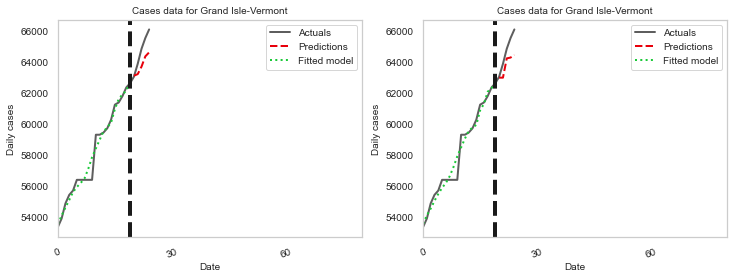

(40, 100)
(5, 100)
tau_hat: 0.6569921617615301
tau_pre: 5.0904542001079135e-05
2D for Grand Isle-Vermont True
Granite-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648354791
tau_pre: 1.8626456827379697e-05
1D for Granite-Montana True


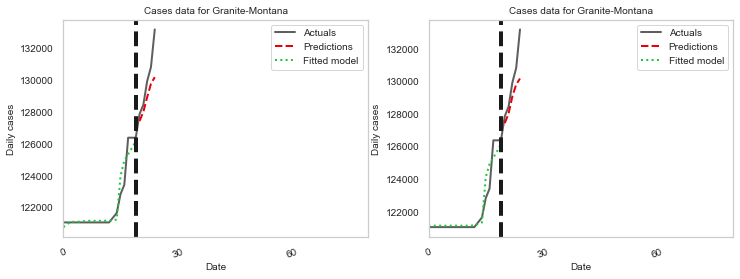

(40, 100)
(5, 100)
tau_hat: 0.5935952209282833
tau_pre: 1.9599627600535533e-05
2D for Granite-Montana True
Grant-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.552424753706407
tau_pre: 5.964781384802976e-06
1D for Grant-Indiana True


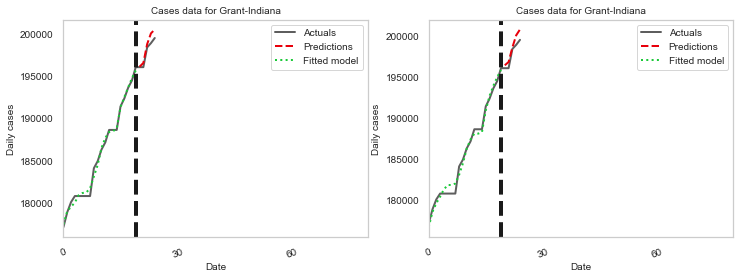

(40, 100)
(5, 100)
tau_hat: 0.6061585095604988
tau_pre: 1.2746953558530556e-05
2D for Grant-Indiana True
Grant-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967135424
tau_pre: 3.085283004511078e-06
1D for Grant-North Dakota True


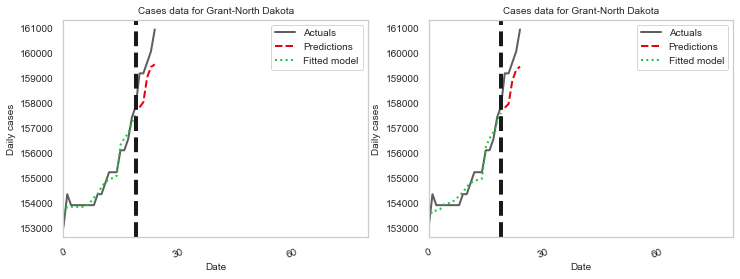

(40, 100)
(5, 100)
tau_hat: 0.6108728044068927
tau_pre: 3.7796895259126822e-06
2D for Grant-North Dakota True
Grant-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536949081
tau_pre: 1.162360223402164e-06
1D for Grant-Oklahoma True


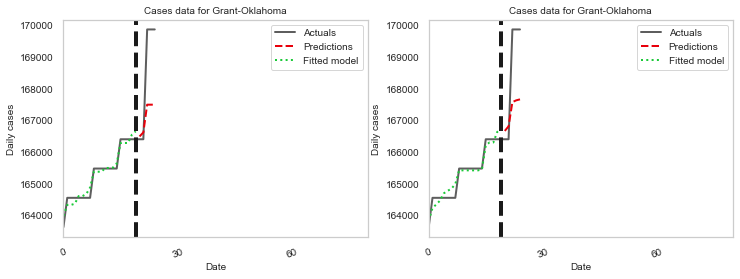

(40, 100)
(5, 100)
tau_hat: 0.6061585095833993
tau_pre: 4.107193472682039e-06
2D for Grant-Oklahoma True
Grant-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5066418823619467
tau_pre: 1.4932447609707003e-06
1D for Grant-South Dakota True


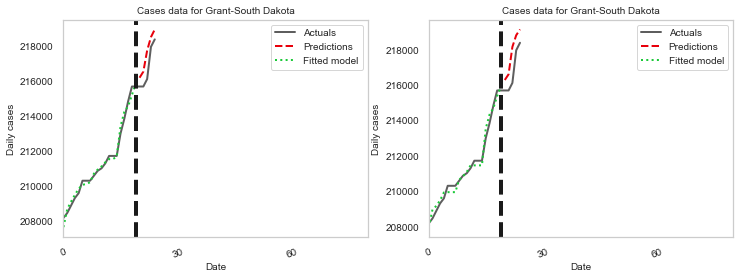

(40, 100)
(5, 100)
tau_hat: 0.6161701452584307
tau_pre: 3.825320308933918e-06
2D for Grant-South Dakota True
Greene-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247537031128
tau_pre: 2.996401562125789e-06
1D for Greene-Indiana True


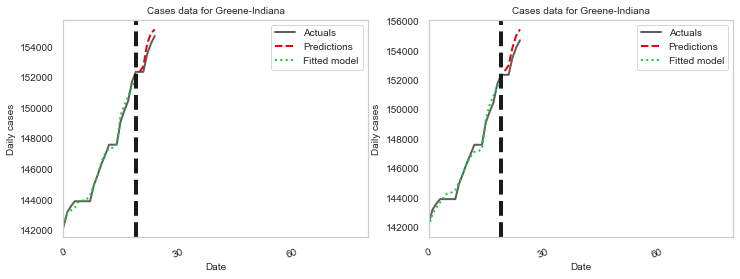

(40, 100)
(5, 100)
tau_hat: 0.6061585095855275
tau_pre: 7.566619386752306e-06
2D for Greene-Indiana True
Greer-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648436851
tau_pre: 1.0120837719279448e-05
1D for Greer-Oklahoma True


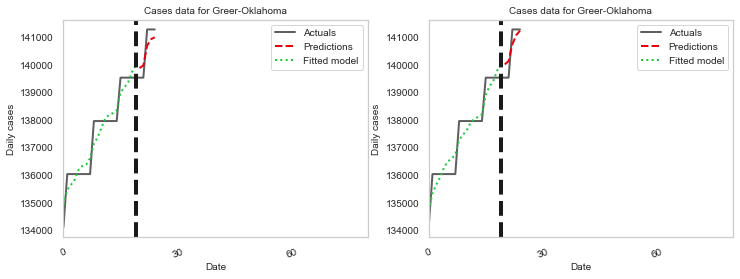

(40, 100)
(5, 100)
tau_hat: 0.5935952209280739
tau_pre: 1.1512717422098007e-05
2D for Greer-Oklahoma True
Gregory-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.48700041127021576
tau_pre: 1.2659190593579468e-05
1D for Gregory-South Dakota True


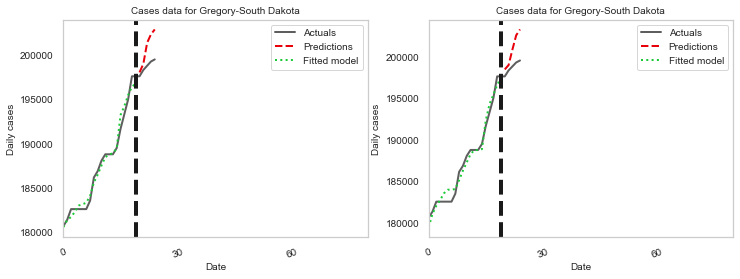

(40, 100)
(5, 100)
tau_hat: 0.5799456469313877
tau_pre: 1.873127009438468e-05
2D for Gregory-South Dakota True
Griggs-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5050250720247492
tau_pre: 1.171563747421465e-05
1D for Griggs-North Dakota True


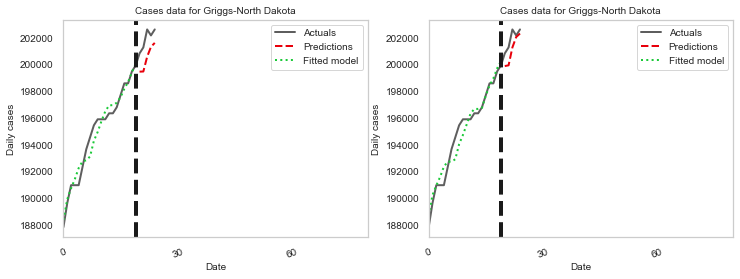

(40, 100)
(5, 100)
tau_hat: 0.6169450854869509
tau_pre: 2.127255491223481e-05
2D for Griggs-North Dakota True
Haakon-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536964108
tau_pre: 1.423916615891777e-06
1D for Haakon-South Dakota True


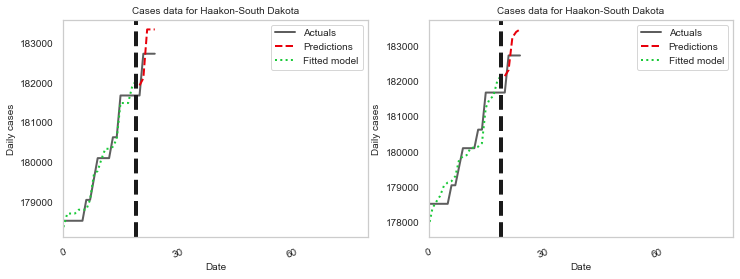

(40, 100)
(5, 100)
tau_hat: 0.6061585095803702
tau_pre: 5.6981961040411135e-06
2D for Haakon-South Dakota True
Hamilton-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5502891826738375
tau_pre: 7.714623440360412e-06
1D for Hamilton-Indiana True


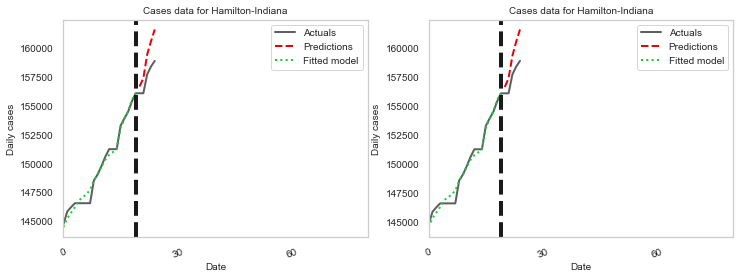

(40, 100)
(5, 100)
tau_hat: 0.6198114397899981
tau_pre: 8.100315319915122e-06
2D for Hamilton-Indiana True
Hamlin-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5225247176145326
tau_pre: 9.271543012285478e-06
1D for Hamlin-South Dakota True


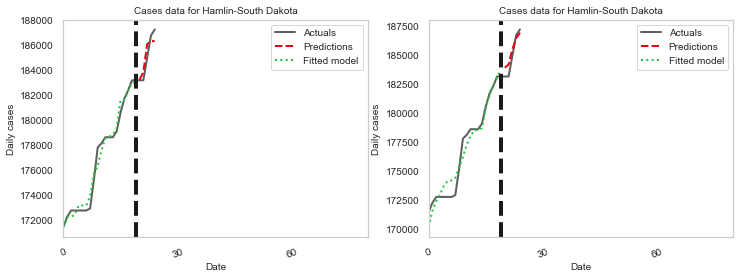

(40, 100)
(5, 100)
tau_hat: 0.6175553516779061
tau_pre: 2.1721133196681807e-05
2D for Hamlin-South Dakota True
Hancock-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5316343877816656
tau_pre: 9.653228492650316e-06
1D for Hancock-Indiana True


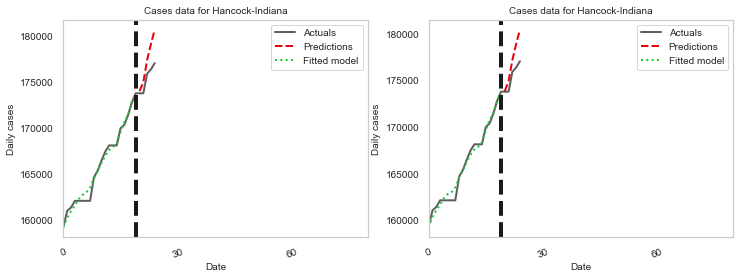

(40, 100)
(5, 100)
tau_hat: 0.6220365192589983
tau_pre: 1.1237724749647999e-05
2D for Hancock-Indiana True
Hand-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5092048496518492
tau_pre: 8.03502422615552e-06
1D for Hand-South Dakota True


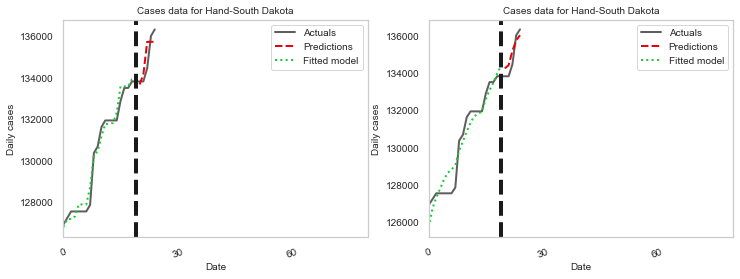

(40, 100)
(5, 100)
tau_hat: 0.617683146619673
tau_pre: 2.733789110692481e-05
2D for Hand-South Dakota True
Hanson-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536994887
tau_pre: 1.0145422516082214e-05
1D for Hanson-South Dakota True


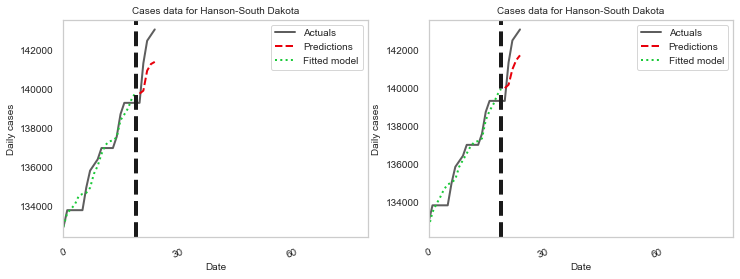

(40, 100)
(5, 100)
tau_hat: 0.6061585095891406
tau_pre: 1.2567475166222413e-05
2D for Hanson-South Dakota True
Harding-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967137716
tau_pre: 1.7981748753482923e-06
1D for Harding-South Dakota True


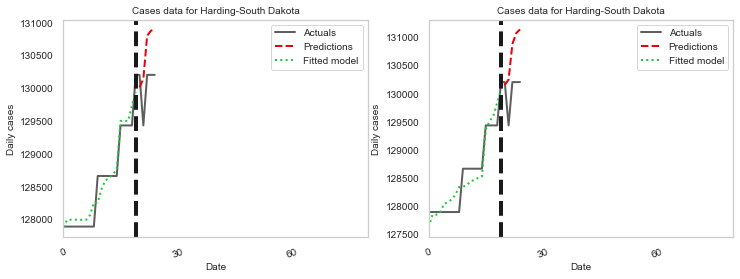

(40, 100)
(5, 100)
tau_hat: 0.6108728044054992
tau_pre: 3.2111958278986648e-06
2D for Harding-South Dakota True
Harmon-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.506582357368551
tau_pre: 6.431902971271203e-06
1D for Harmon-Oklahoma True


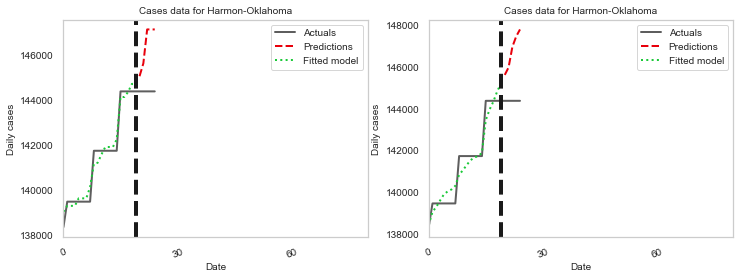

(40, 100)
(5, 100)
tau_hat: 0.6141097793297747
tau_pre: 1.4002952285897325e-05
2D for Harmon-Oklahoma True
Harper-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5141050538396034
tau_pre: 4.6354177737796105e-06
1D for Harper-Oklahoma True


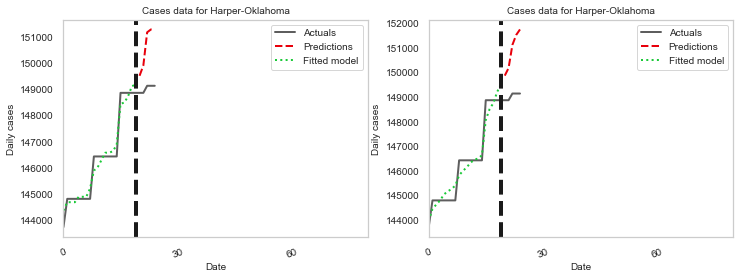

(40, 100)
(5, 100)
tau_hat: 0.6095083606721429
tau_pre: 8.806586669190248e-06
2D for Harper-Oklahoma True
Harrison-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.48849402497884553
tau_pre: 4.9461851656921534e-06
1D for Harrison-Indiana True


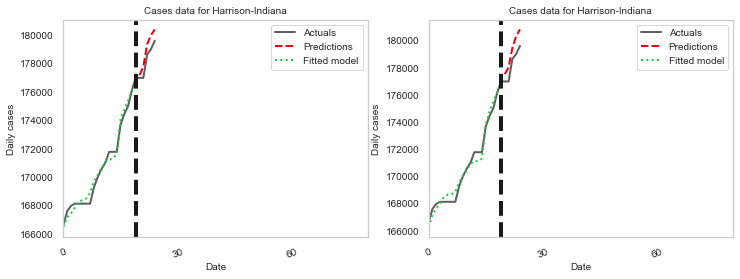

(40, 100)
(5, 100)
tau_hat: 0.5860272891267049
tau_pre: 6.94579586096808e-06
2D for Harrison-Indiana True
Haskell-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247537041113
tau_pre: 9.491553512174394e-07
1D for Haskell-Oklahoma True


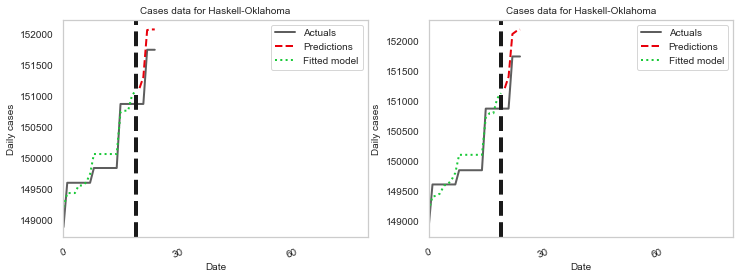

(40, 100)
(5, 100)
tau_hat: 0.6061585095821352
tau_pre: 2.1794848928207126e-06
2D for Haskell-Oklahoma True
Hendricks-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5392847362579493
tau_pre: 5.801302272389022e-06
1D for Hendricks-Indiana True


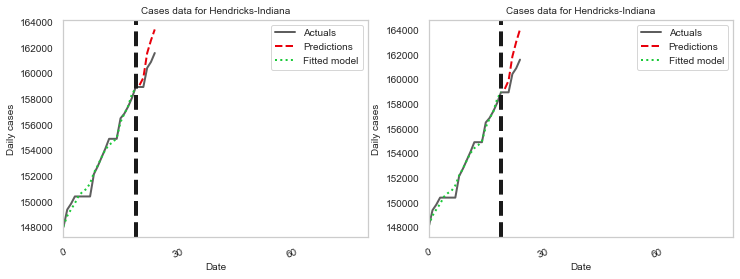

(40, 100)
(5, 100)
tau_hat: 0.614316871889567
tau_pre: 6.468035983000261e-06
2D for Hendricks-Indiana True
Henry-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4768844535331058
tau_pre: 6.083244613455905e-06
1D for Henry-Indiana True


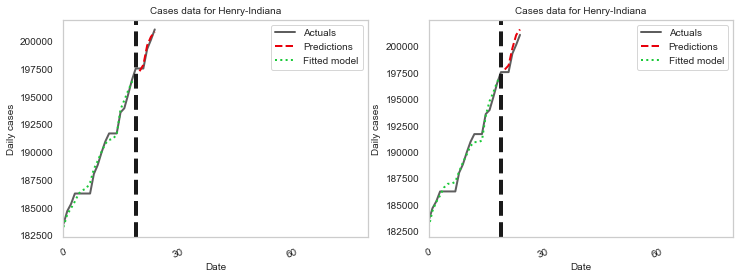

(40, 100)
(5, 100)
tau_hat: 0.5764200678429235
tau_pre: 1.1798234342458747e-05
2D for Henry-Indiana True
Hettinger-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536997124
tau_pre: 1.4732089706830469e-05
1D for Hettinger-North Dakota True


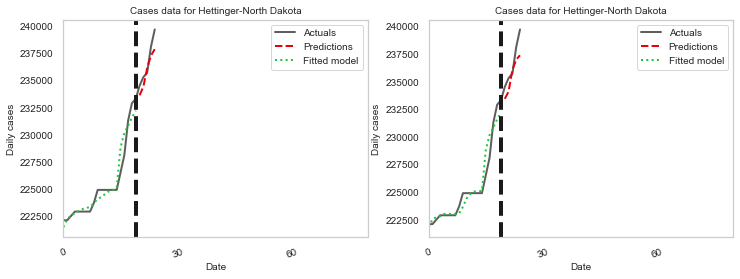

(40, 100)
(5, 100)
tau_hat: 0.6061585095810694
tau_pre: 1.5940628861007332e-05
2D for Hettinger-North Dakota True
Hill-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5237720548727972
tau_pre: 1.5399584407235947e-06
1D for Hill-Montana True


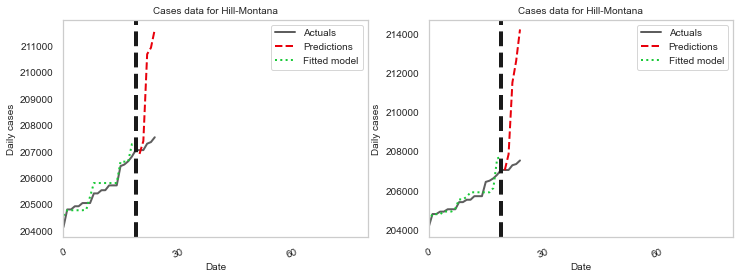

(40, 100)
(5, 100)
tau_hat: 0.6319091926372353
tau_pre: 3.7779500535261884e-05
2D for Hill-Montana True
Howard-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5090010093903815
tau_pre: 5.736007963803623e-06
1D for Howard-Indiana True


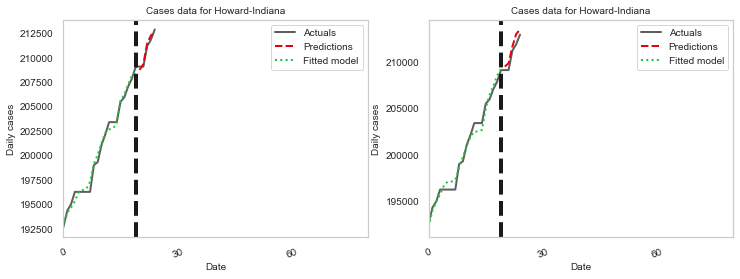

(40, 100)
(5, 100)
tau_hat: 0.6200786015919636
tau_pre: 1.2320432042661137e-05
2D for Howard-Indiana True
Hughes-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5202864653920014
tau_pre: 8.471425746528176e-07
1D for Hughes-Oklahoma True


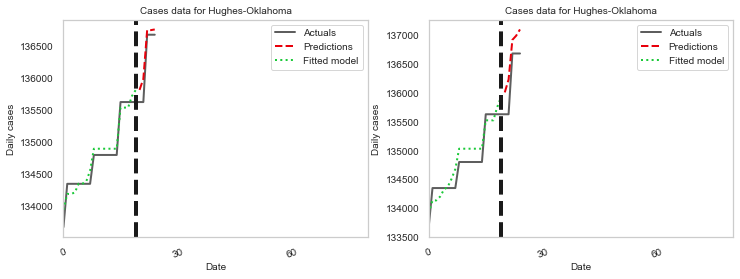

(40, 100)
(5, 100)
tau_hat: 0.6169242649330758
tau_pre: 2.5126203145790805e-06
2D for Hughes-Oklahoma True
Hughes-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5230022594417654
tau_pre: 6.870577977677561e-06
1D for Hughes-South Dakota True


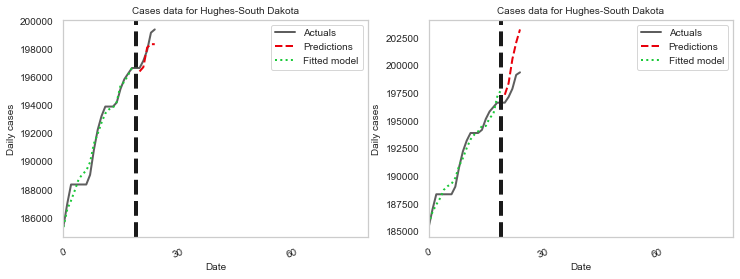

(40, 100)
(5, 100)
tau_hat: 0.6116763314689614
tau_pre: 1.0249998055009938e-05
2D for Hughes-South Dakota True
Huntington-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4884940249755061
tau_pre: 1.0565171010346893e-05
1D for Huntington-Indiana True


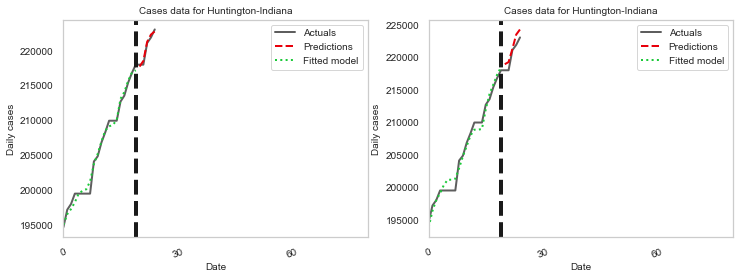

(40, 100)
(5, 100)
tau_hat: 0.5860272892046822
tau_pre: 2.7816560067479708e-05
2D for Huntington-Indiana True
Hutchinson-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.42134744460368095
tau_pre: 1.502914559199021e-05
1D for Hutchinson-South Dakota True


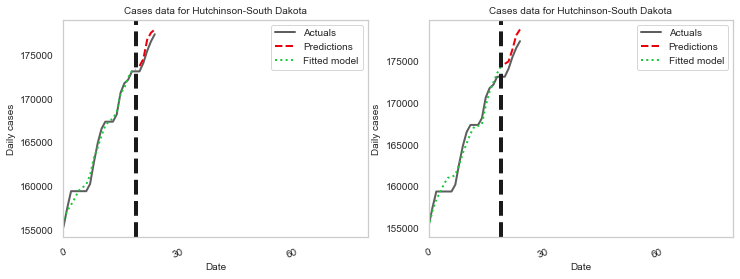

(40, 100)
(5, 100)
tau_hat: 0.49745997294304267
tau_pre: 3.8775059752348184e-05
2D for Hutchinson-South Dakota True
Hyde-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4802534320441648
tau_pre: 3.0288954881334992e-06
1D for Hyde-South Dakota True


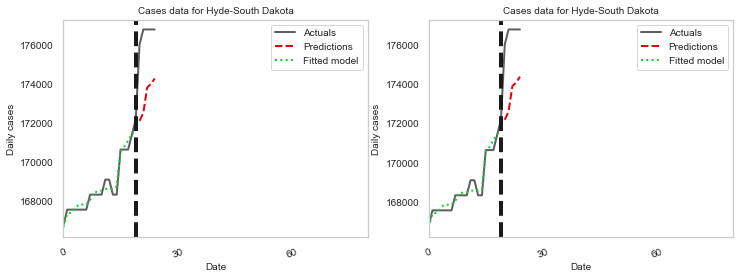

(40, 100)
(5, 100)
tau_hat: 0.5534807662490676
tau_pre: 3.86422374101952e-06
2D for Hyde-South Dakota True
Jackson-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4230751520976898
tau_pre: 2.0624403219875045e-05
1D for Jackson-Indiana True


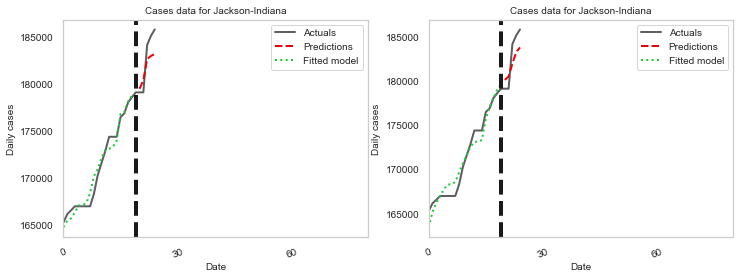

(40, 100)
(5, 100)
tau_hat: 0.5126879706073425
tau_pre: 3.725071200352157e-05
2D for Jackson-Indiana True
Jackson-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.4213311423855813
tau_pre: 1.08102830515814e-05
1D for Jackson-Oklahoma True


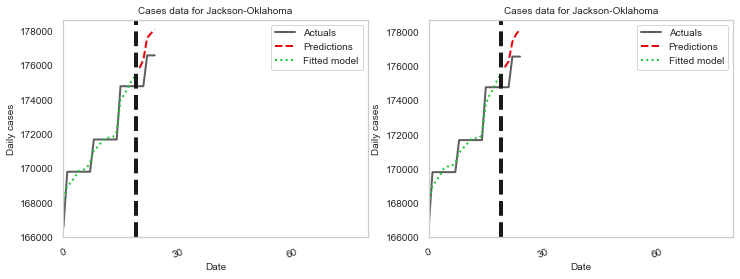

(40, 100)
(5, 100)
tau_hat: 0.5045323781513763
tau_pre: 1.2774696794140224e-05
2D for Jackson-Oklahoma True
Jackson-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5197248755723328
tau_pre: 1.998759409301261e-06
1D for Jackson-South Dakota True


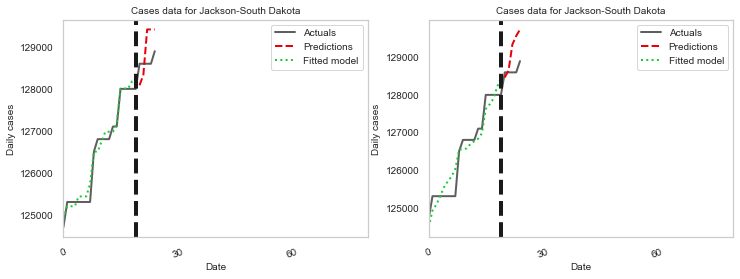

(40, 100)
(5, 100)
tau_hat: 0.6221763666849749
tau_pre: 9.781628750693349e-06
2D for Jackson-South Dakota True
Jasper-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.522002887091712
tau_pre: 6.219959077518137e-06
1D for Jasper-Indiana True


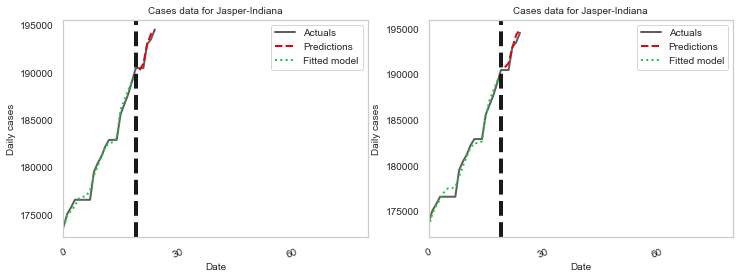

(40, 100)
(5, 100)
tau_hat: 0.6282157351345111
tau_pre: 8.985324391090212e-06
2D for Jasper-Indiana True
Jay-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648421842
tau_pre: 6.106518750630583e-06
1D for Jay-Indiana True


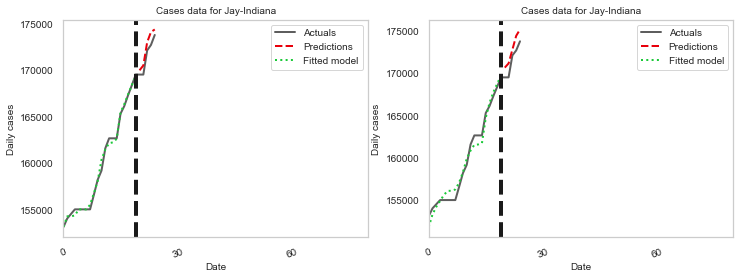

(40, 100)
(5, 100)
tau_hat: 0.5935952209146161
tau_pre: 2.3755939336914457e-05
2D for Jay-Indiana True
Jefferson-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5040024520212538
tau_pre: 1.5782264334828107e-05
1D for Jefferson-Indiana True


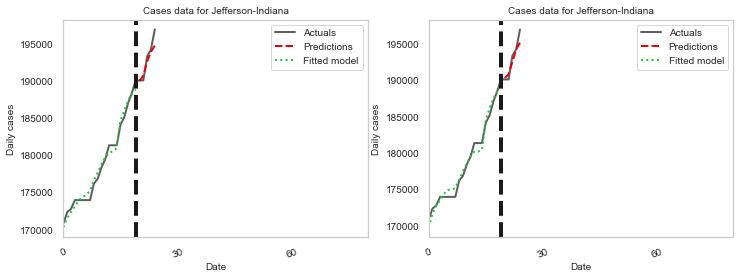

(40, 100)
(5, 100)
tau_hat: 0.5770948320902186
tau_pre: 2.2580106140898947e-05
2D for Jefferson-Indiana True
Jefferson-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.4884940249715076
tau_pre: 2.978628594031101e-06
1D for Jefferson-Montana True


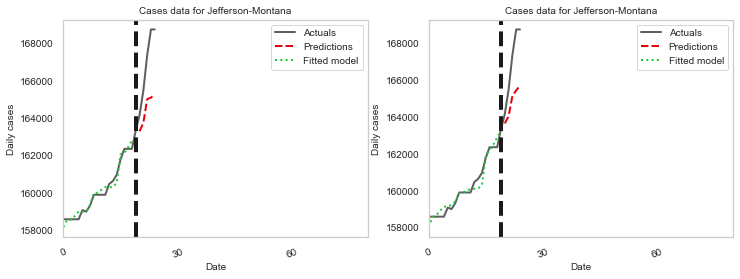

(40, 100)
(5, 100)
tau_hat: 0.5860272891022533
tau_pre: 6.1138058473049526e-06
2D for Jefferson-Montana True
Jefferson-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536938097
tau_pre: 1.5276362733078333e-06
1D for Jefferson-Oklahoma True


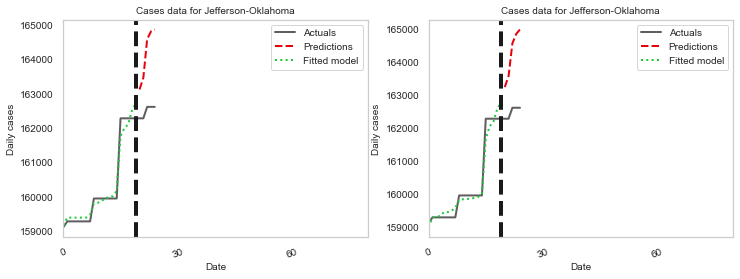

(40, 100)
(5, 100)
tau_hat: 0.6061585095797056
tau_pre: 3.0631525648825317e-06
2D for Jefferson-Oklahoma True
Jennings-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218785207
tau_pre: 5.269385111454479e-06
1D for Jennings-Indiana True


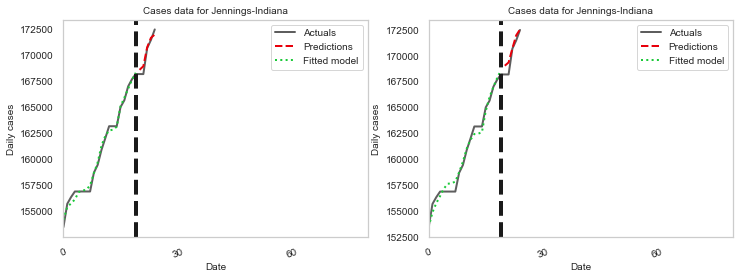

(40, 100)
(5, 100)
tau_hat: 0.6082688361181879
tau_pre: 1.267297929879637e-05
2D for Jennings-Indiana True
Jerauld-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4884940249631172
tau_pre: 7.098513760947697e-06
1D for Jerauld-South Dakota True


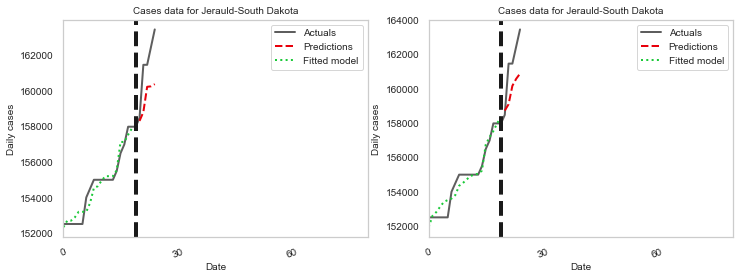

(40, 100)
(5, 100)
tau_hat: 0.5860272890477186
tau_pre: 1.0722775719159754e-05
2D for Jerauld-South Dakota True
Johnson-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.555312310460013
tau_pre: 5.464705139900172e-06
1D for Johnson-Indiana True


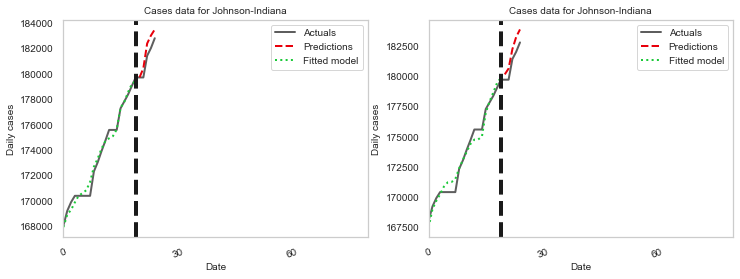

(40, 100)
(5, 100)
tau_hat: 0.626519385555888
tau_pre: 1.340576154011398e-05
2D for Johnson-Indiana True
Johnston-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536984671
tau_pre: 3.18473268589874e-06
1D for Johnston-Oklahoma True


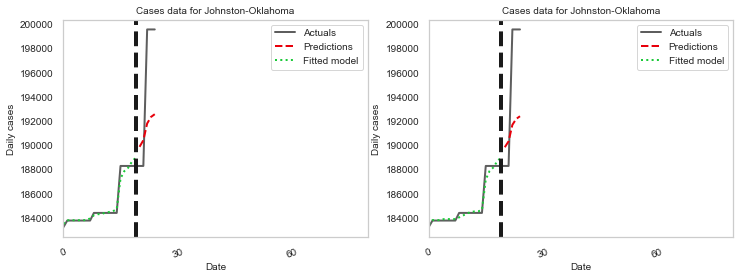

(40, 100)
(5, 100)
tau_hat: 0.6061585095843622
tau_pre: 3.7574468379342195e-06
2D for Johnston-Oklahoma True
Jones-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5166994648117492
tau_pre: 4.500008420768943e-06
1D for Jones-South Dakota True


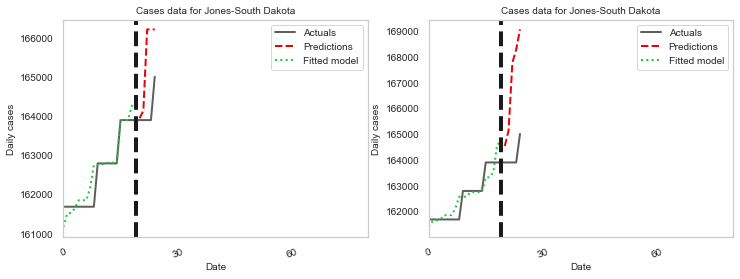

(40, 100)
(5, 100)
tau_hat: 0.6095044323873277
tau_pre: 6.722915037278854e-06
2D for Jones-South Dakota True
Judith Basin-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218768291
tau_pre: 6.611584382327452e-07
1D for Judith Basin-Montana True


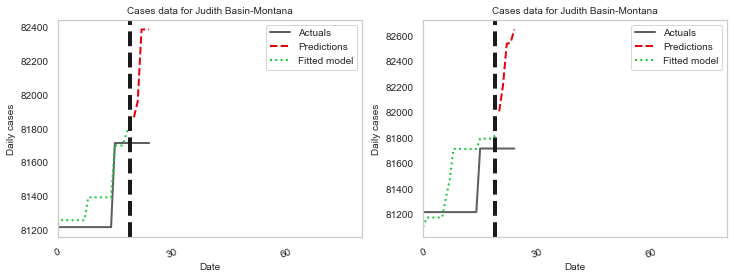

(40, 100)
(5, 100)
tau_hat: 0.6082688361111034
tau_pre: 6.10207353851521e-06
2D for Judith Basin-Montana True
Kay-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536960972
tau_pre: 9.98925050355232e-06
1D for Kay-Oklahoma True


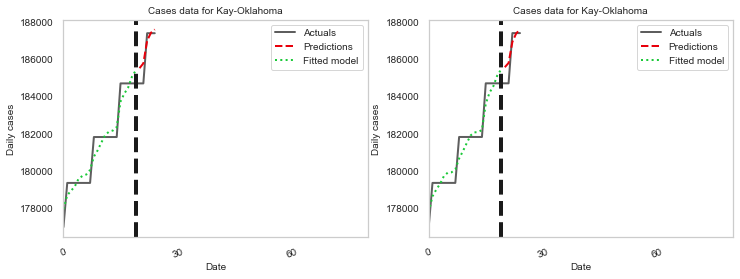

(40, 100)
(5, 100)
tau_hat: 0.6061585095895515
tau_pre: 1.1510374524266294e-05
2D for Kay-Oklahoma True
Kidder-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648339132
tau_pre: 7.970453123348095e-06
1D for Kidder-North Dakota True


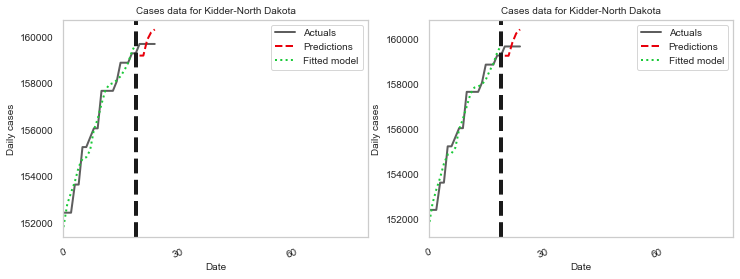

(40, 100)
(5, 100)
tau_hat: 0.5935952209237194
tau_pre: 9.23904784561012e-06
2D for Kidder-North Dakota True
Kingfisher-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5090010093930388
tau_pre: 2.1655923364210857e-06
1D for Kingfisher-Oklahoma True


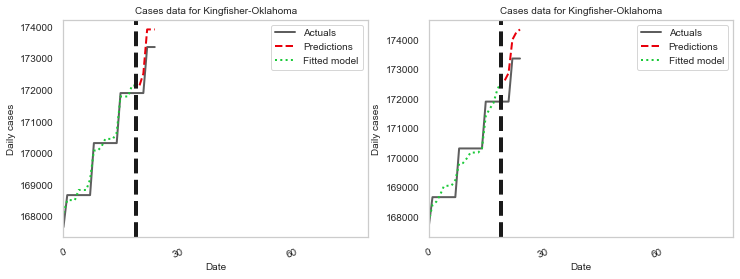

(40, 100)
(5, 100)
tau_hat: 0.6200786016003103
tau_pre: 6.652327303781529e-06
2D for Kingfisher-Oklahoma True
Kingsbury-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5501242745441917
tau_pre: 5.994772913807149e-06
1D for Kingsbury-South Dakota True


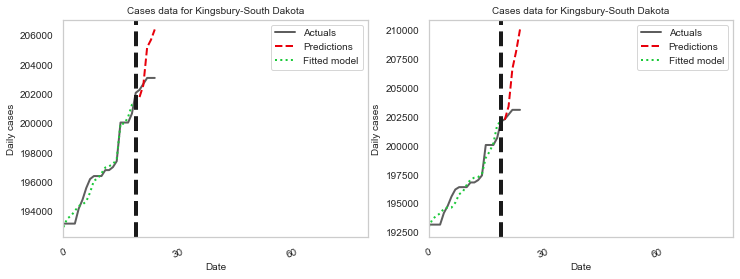

(40, 100)
(5, 100)
tau_hat: 0.6387563276900976
tau_pre: 1.0012485348863108e-05
2D for Kingsbury-South Dakota True
Kiowa-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.48177937615869315
tau_pre: 4.923807185510778e-06
1D for Kiowa-Oklahoma True


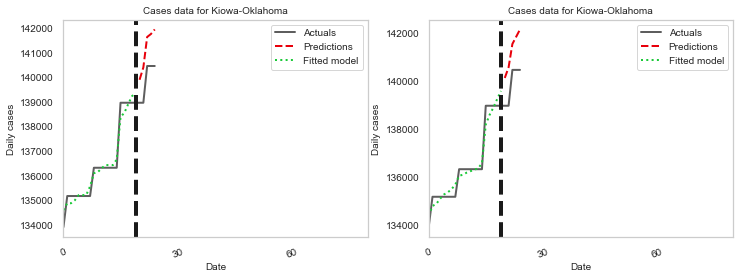

(40, 100)
(5, 100)
tau_hat: 0.5832263331240897
tau_pre: 6.300057645943025e-06
2D for Kiowa-Oklahoma True
Knox-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4887848656320882
tau_pre: 9.637756569786162e-06
1D for Knox-Indiana True


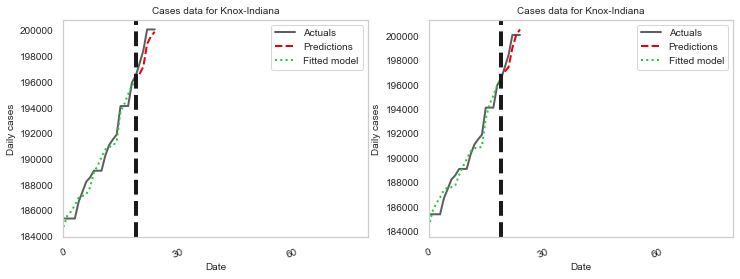

(40, 100)
(5, 100)
tau_hat: 0.5845490546737824
tau_pre: 1.6482192464098125e-05
2D for Knox-Indiana True
Kosciusko-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536973111
tau_pre: 4.197230022561119e-06
1D for Kosciusko-Indiana True


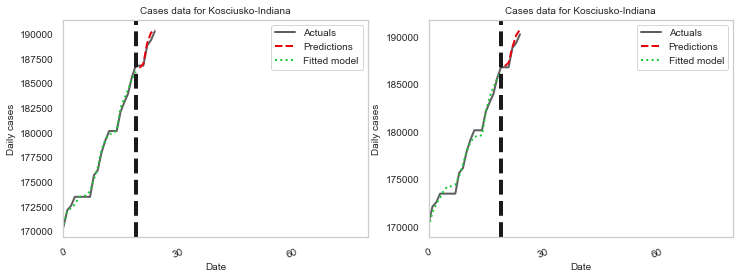

(40, 100)
(5, 100)
tau_hat: 0.6061585095847722
tau_pre: 1.04331797073063e-05
2D for Kosciusko-Indiana True
LaGrange-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967301156
tau_pre: 3.849943314712732e-06
1D for LaGrange-Indiana True


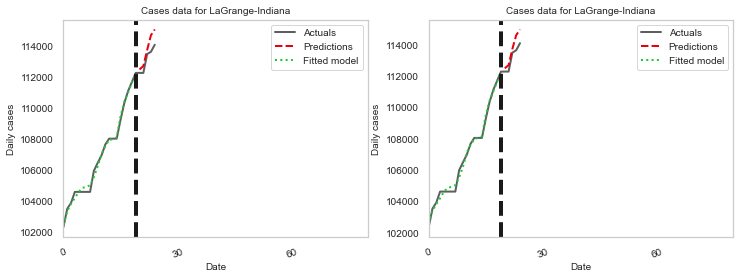

(40, 100)
(5, 100)
tau_hat: 0.610872804406587
tau_pre: 4.585816915603151e-06
2D for LaGrange-Indiana True
LaMoure-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4900805853178666
tau_pre: 1.5365754164865266e-06
1D for LaMoure-North Dakota True


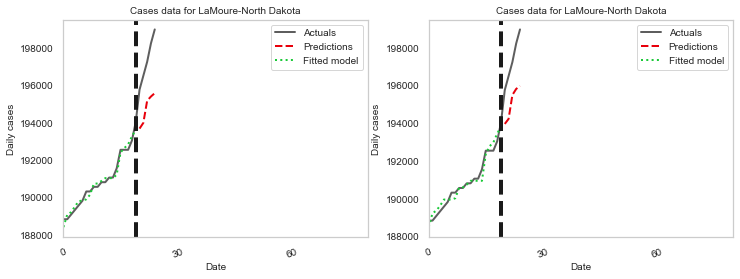

(40, 100)
(5, 100)
tau_hat: 0.5896494831489383
tau_pre: 5.891246403942956e-06
2D for LaMoure-North Dakota True
LaPorte-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5040024520127352
tau_pre: 6.778066984545709e-06
1D for LaPorte-Indiana True


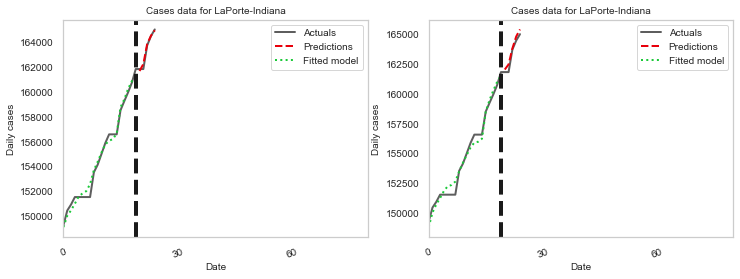

(40, 100)
(5, 100)
tau_hat: 0.5770948320984668
tau_pre: 1.2939921056232995e-05
2D for LaPorte-Indiana True
Lake-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5041139927401455
tau_pre: 5.549833331299879e-06
1D for Lake-Indiana True


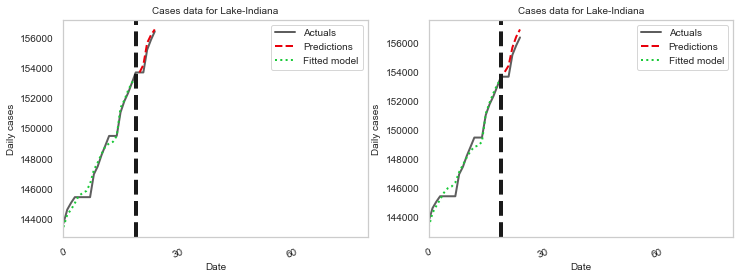

(40, 100)
(5, 100)
tau_hat: 0.5722928501439247
tau_pre: 9.596799020407365e-06
2D for Lake-Indiana True
Lake-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5448818773287171
tau_pre: 2.164929417504486e-06
1D for Lake-Montana True


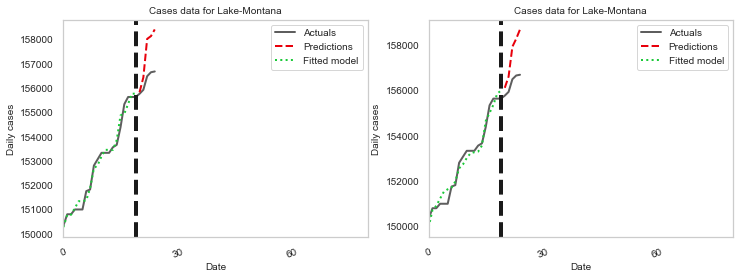

(40, 100)
(5, 100)
tau_hat: 0.6177612612414652
tau_pre: 5.0648559695508215e-06
2D for Lake-Montana True
Lake-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.49008058533155097
tau_pre: 5.0906412118547635e-06
1D for Lake-South Dakota True


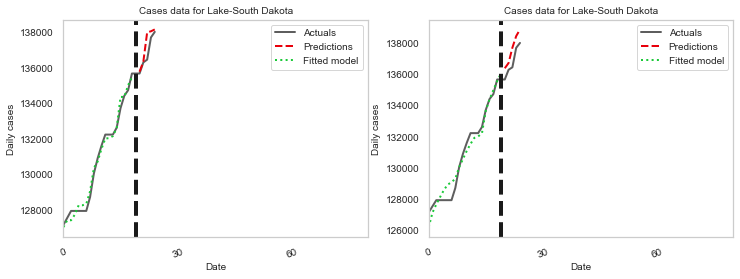

(40, 100)
(5, 100)
tau_hat: 0.5896494831417453
tau_pre: 1.675045011650769e-05
2D for Lake-South Dakota True
Lamoille-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.564223170225899
tau_pre: 0.00010324420641823749
1D for Lamoille-Vermont True


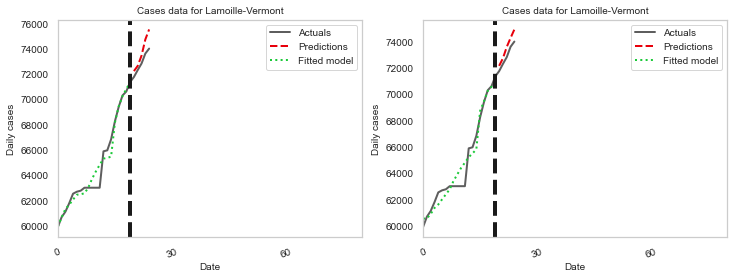

(40, 100)
(5, 100)
tau_hat: 0.6547884057977283
tau_pre: 8.406150077831078e-05
2D for Lamoille-Vermont True
Latimer-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648442879
tau_pre: 2.3883686629162576e-05
1D for Latimer-Oklahoma True


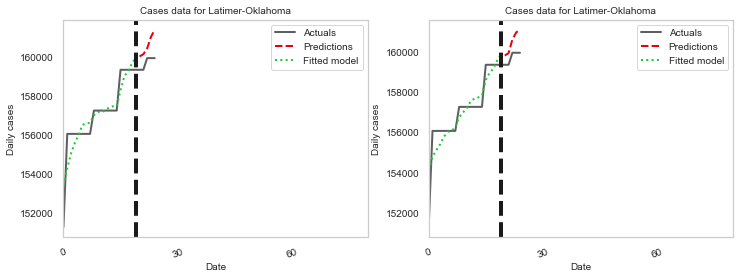

(40, 100)
(5, 100)
tau_hat: 0.5935952209362373
tau_pre: 2.7070514309017676e-05
2D for Latimer-Oklahoma True
Lawrence-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.49051479330801373
tau_pre: 5.414998820631297e-06
1D for Lawrence-Indiana True


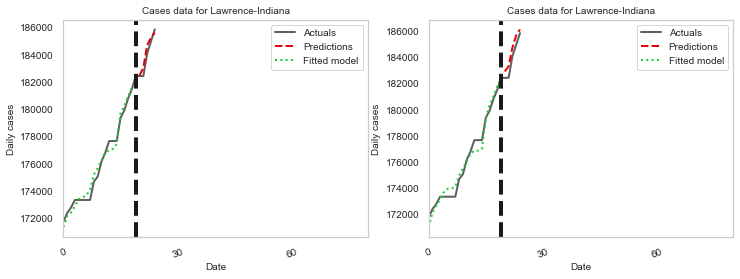

(40, 100)
(5, 100)
tau_hat: 0.5895636337147345
tau_pre: 9.231746944630304e-06
2D for Lawrence-Indiana True
Lawrence-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4938869479316838
tau_pre: 2.0978208889295543e-06
1D for Lawrence-South Dakota True


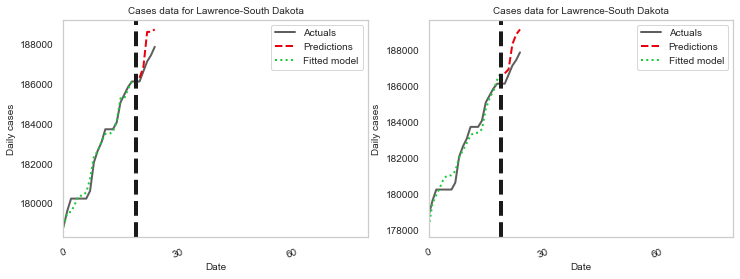

(40, 100)
(5, 100)
tau_hat: 0.5687500565958927
tau_pre: 7.899300715641887e-06
2D for Lawrence-South Dakota True
Le Flore-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218639625
tau_pre: 8.088874878756183e-06
1D for Le Flore-Oklahoma True


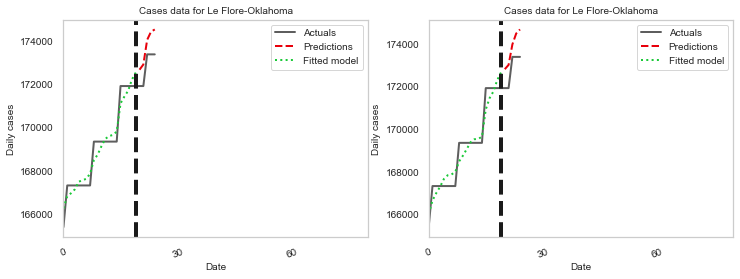

(40, 100)
(5, 100)
tau_hat: 0.6082688361271519
tau_pre: 9.81794892106903e-06
2D for Le Flore-Oklahoma True
Lewis and Clark-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5631646699078332
tau_pre: 5.203257308600118e-06
1D for Lewis and Clark-Montana True


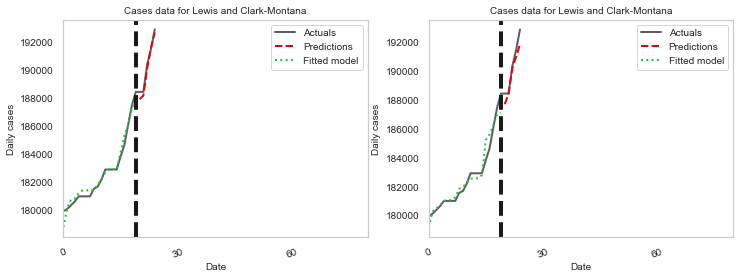

(40, 100)
(5, 100)
tau_hat: 0.6451410549138583
tau_pre: 1.161077236206541e-05
2D for Lewis and Clark-Montana True
Liberty-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648417126
tau_pre: 2.157772621948454e-06
1D for Liberty-Montana True


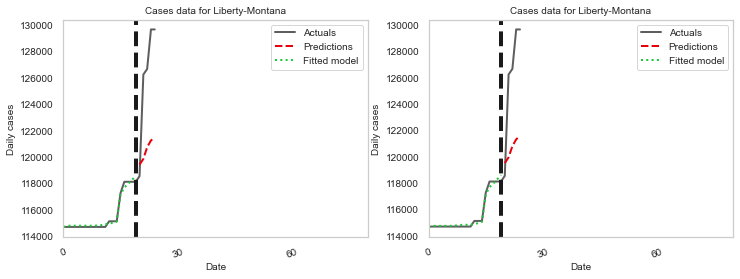

(40, 100)
(5, 100)
tau_hat: 0.593595220938588
tau_pre: 2.976369372840098e-06
2D for Liberty-Montana True
Lincoln-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648448199
tau_pre: 1.0172485837238019e-06
1D for Lincoln-Montana True


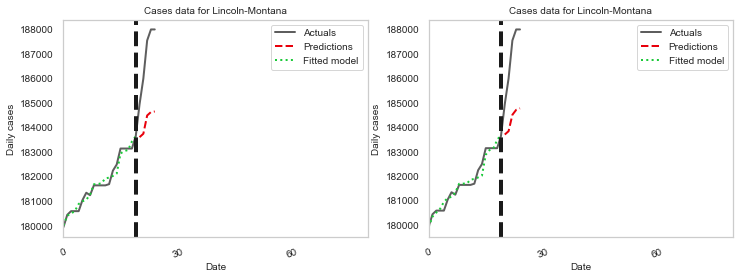

(40, 100)
(5, 100)
tau_hat: 0.5935952209359516
tau_pre: 1.7431570235357788e-06
2D for Lincoln-Montana True
Lincoln-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.548419821865759
tau_pre: 2.6010971719394857e-06
1D for Lincoln-Oklahoma True


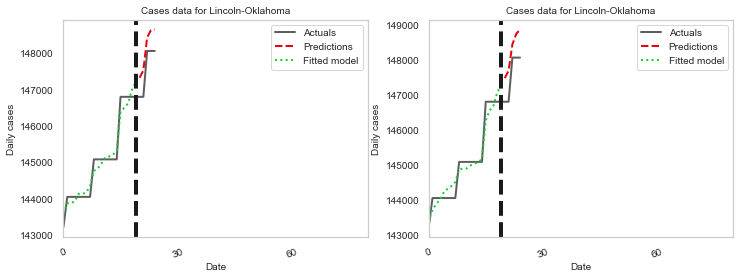

(40, 100)
(5, 100)
tau_hat: 0.6082688361191438
tau_pre: 4.025070763119823e-06
2D for Lincoln-Oklahoma True
Lincoln-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5618431711655362
tau_pre: 3.2088599901028597e-06
1D for Lincoln-South Dakota True


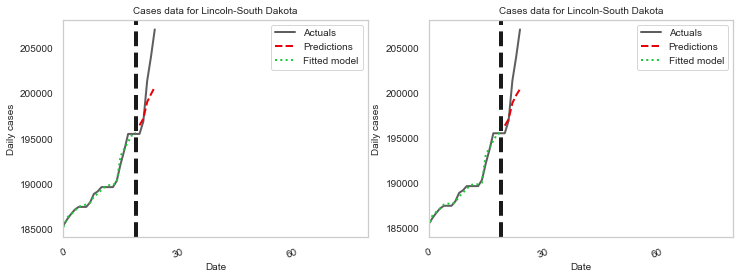

(40, 100)
(5, 100)
tau_hat: 0.6321997932285282
tau_pre: 3.6017968968249086e-06
2D for Lincoln-South Dakota True
Logan-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.537311564835667
tau_pre: 6.625954260240717e-06
1D for Logan-North Dakota True


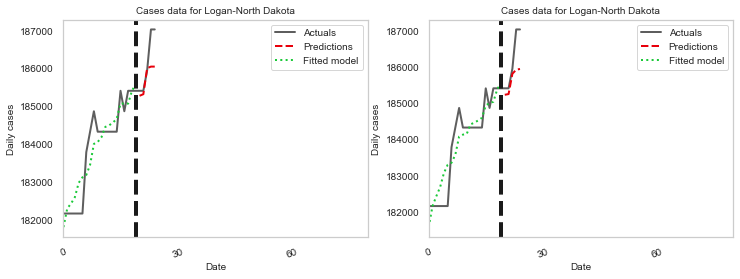

(40, 100)
(5, 100)
tau_hat: 0.5935952209309421
tau_pre: 3.772771762992503e-05
2D for Logan-North Dakota True
Logan-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648534396
tau_pre: 5.4028922962187365e-06
1D for Logan-Oklahoma True


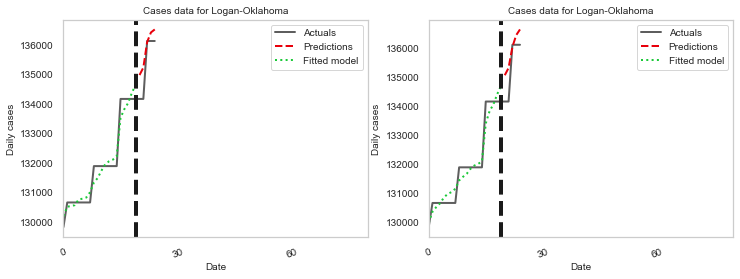

(40, 100)
(5, 100)
tau_hat: 0.5935952209317549
tau_pre: 6.389958236752636e-06
2D for Logan-Oklahoma True
Love-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536944097
tau_pre: 6.651097016673332e-07
1D for Love-Oklahoma True


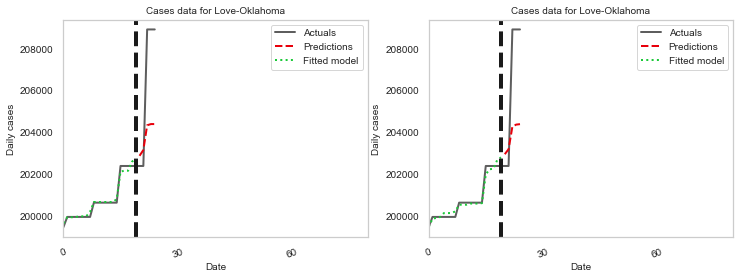

(40, 100)
(5, 100)
tau_hat: 0.6061585095819692
tau_pre: 2.205515625327345e-06
2D for Love-Oklahoma True
Lyman-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5605744500419976
tau_pre: 1.3159219567045154e-05
1D for Lyman-South Dakota True


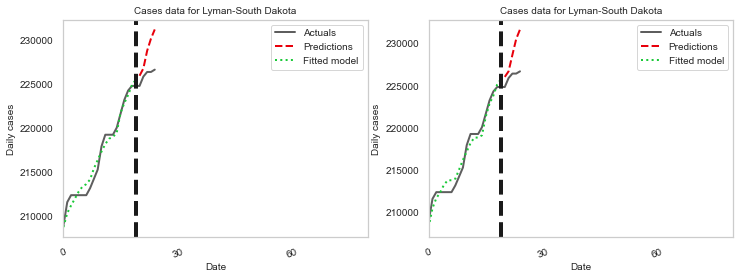

(40, 100)
(5, 100)
tau_hat: 0.6445340073112533
tau_pre: 2.2804380963071145e-05
2D for Lyman-South Dakota True
Madison-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4825803640257895
tau_pre: 7.871695924577632e-06
1D for Madison-Indiana True


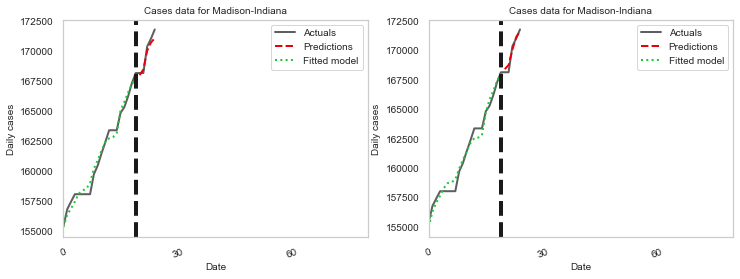

(40, 100)
(5, 100)
tau_hat: 0.5835912654803196
tau_pre: 1.3165924667139769e-05
2D for Madison-Indiana True
Madison-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5197248755792052
tau_pre: 1.6217332093549027e-06
1D for Madison-Montana True


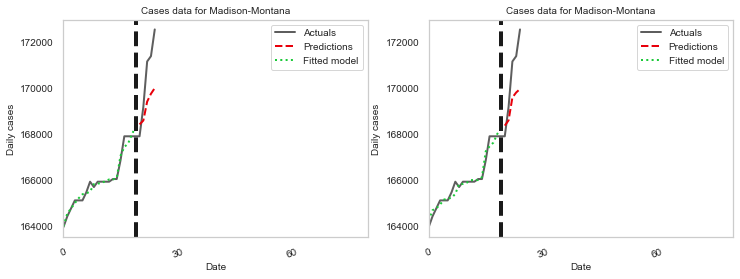

(40, 100)
(5, 100)
tau_hat: 0.6221763666725367
tau_pre: 4.5228262970407085e-06
2D for Madison-Montana True
Major-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.4900805853178447
tau_pre: 2.236467590132607e-05
1D for Major-Oklahoma True


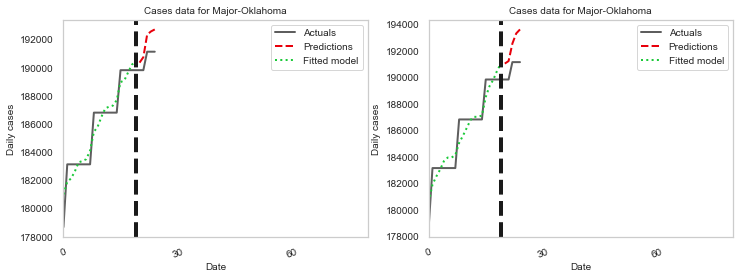

(40, 100)
(5, 100)
tau_hat: 0.5896494831716583
tau_pre: 2.912465603827769e-05
2D for Major-Oklahoma True
Marion-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.48387169822138076
tau_pre: 3.3743851949898047e-06
1D for Marion-Indiana True


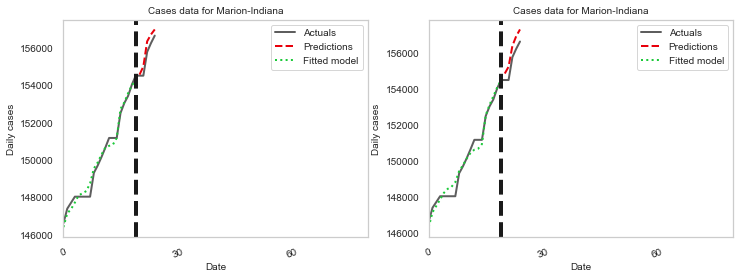

(40, 100)
(5, 100)
tau_hat: 0.5598791721226832
tau_pre: 6.751060025365476e-06
2D for Marion-Indiana True
Marshall-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5225247176172139
tau_pre: 6.988536130591346e-06
1D for Marshall-Indiana True


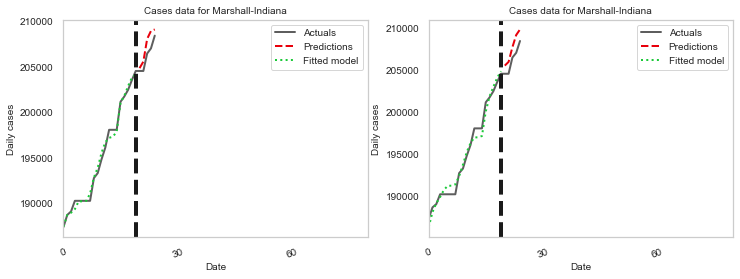

(40, 100)
(5, 100)
tau_hat: 0.6175553516682672
tau_pre: 1.6099908792297e-05
2D for Marshall-Indiana True
Marshall-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5225247176242878
tau_pre: 2.8708896349207653e-06
1D for Marshall-Oklahoma True


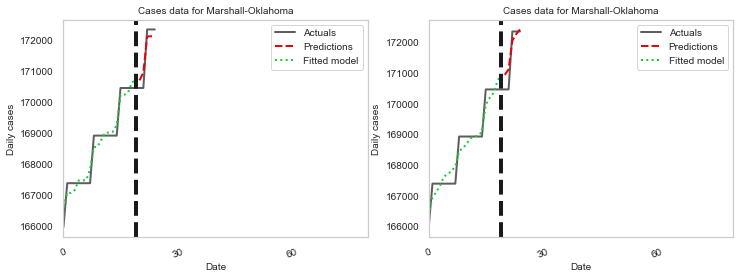

(40, 100)
(5, 100)
tau_hat: 0.6175553516674186
tau_pre: 5.159416331056555e-06
2D for Marshall-Oklahoma True
Marshall-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.48331045827218744
tau_pre: 7.3775306285783065e-06
1D for Marshall-South Dakota True


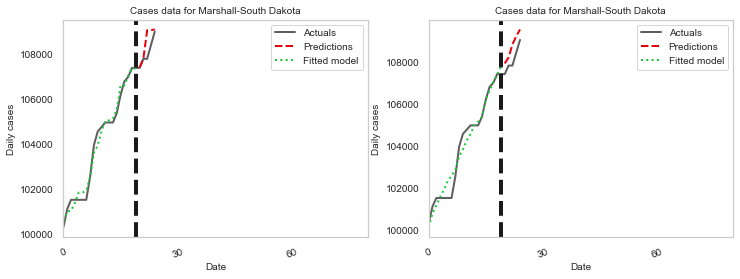

(40, 100)
(5, 100)
tau_hat: 0.5874898696843057
tau_pre: 1.6606188712157154e-05
2D for Marshall-South Dakota True
Martin-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4870004112871532
tau_pre: 4.071337284202621e-06
1D for Martin-Indiana True


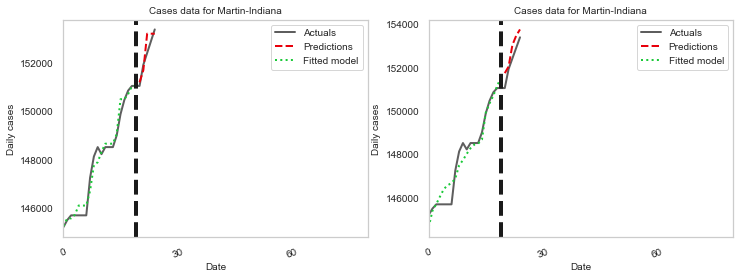

(40, 100)
(5, 100)
tau_hat: 0.5799456469201623
tau_pre: 1.213895606535213e-05
2D for Martin-Indiana True
Mayes-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5535025421474704
tau_pre: 2.962153482941952e-06
1D for Mayes-Oklahoma True


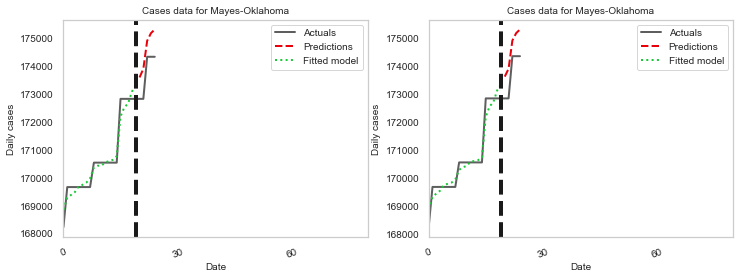

(40, 100)
(5, 100)
tau_hat: 0.6067432896950704
tau_pre: 3.6577068423043946e-06
2D for Mayes-Oklahoma True
McClain-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5050250720144646
tau_pre: 1.8311219730490613e-06
1D for McClain-Oklahoma True


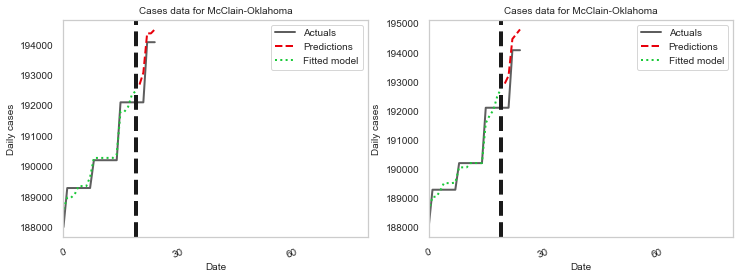

(40, 100)
(5, 100)
tau_hat: 0.6169450854508961
tau_pre: 3.5054262796452876e-06
2D for McClain-Oklahoma True
McCone-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967006956
tau_pre: 2.186035098848727e-05
1D for McCone-Montana True


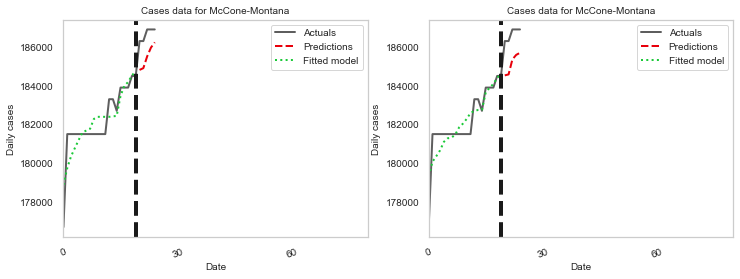

(40, 100)
(5, 100)
tau_hat: 0.6108728044185027
tau_pre: 2.213932948309134e-05
2D for McCone-Montana True
McCook-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5049888404461083
tau_pre: 5.458005258115225e-06
1D for McCook-South Dakota True


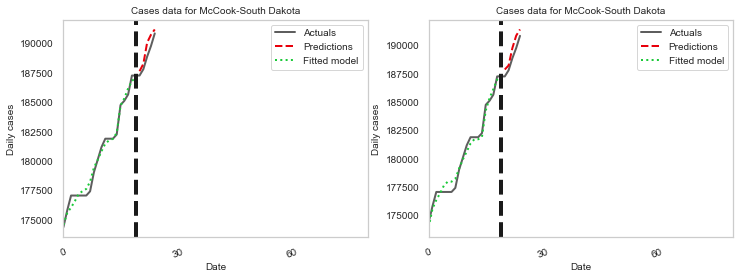

(40, 100)
(5, 100)
tau_hat: 0.5769844906717353
tau_pre: 9.45404785794208e-06
2D for McCook-South Dakota True
McCurtain-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648452084
tau_pre: 2.137154303833444e-06
1D for McCurtain-Oklahoma True


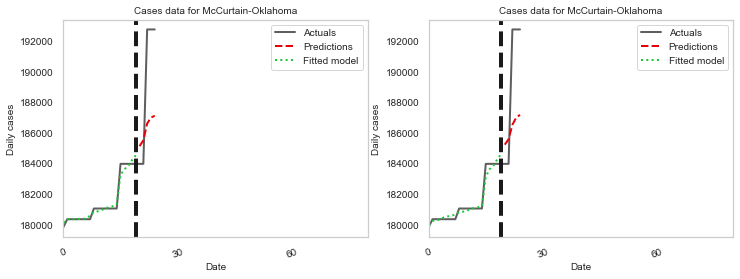

(40, 100)
(5, 100)
tau_hat: 0.5935952209334777
tau_pre: 2.8929462320485717e-06
2D for McCurtain-Oklahoma True
McHenry-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5463033942021301
tau_pre: 2.962411602265132e-06
1D for McHenry-North Dakota True


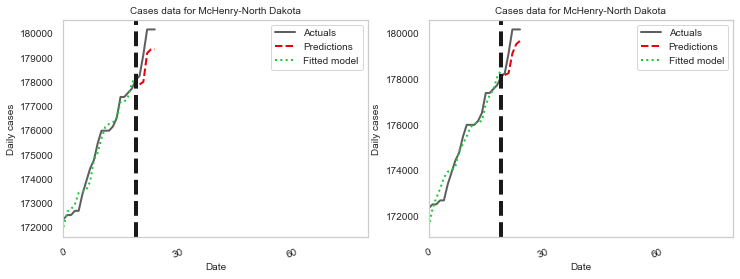

(40, 100)
(5, 100)
tau_hat: 0.6079376227252735
tau_pre: 7.164606438085206e-06
2D for McHenry-North Dakota True
McIntosh-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5267223735403729
tau_pre: 2.23825239806951e-06
1D for McIntosh-North Dakota True


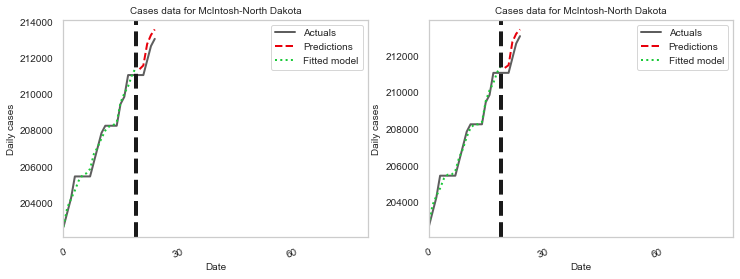

(40, 100)
(5, 100)
tau_hat: 0.6190225451699604
tau_pre: 3.7435054145420983e-06
2D for McIntosh-North Dakota True
McIntosh-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.48025343203290294
tau_pre: 1.3545937274119442e-06
1D for McIntosh-Oklahoma True


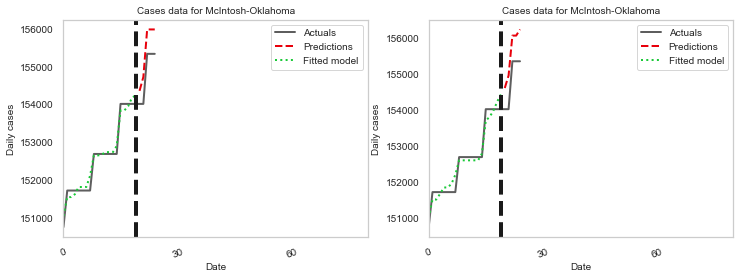

(40, 100)
(5, 100)
tau_hat: 0.5534807662399316
tau_pre: 2.862114744450556e-06
2D for McIntosh-Oklahoma True
McKenzie-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967205931
tau_pre: 1.2543792969571886e-06
1D for McKenzie-North Dakota True


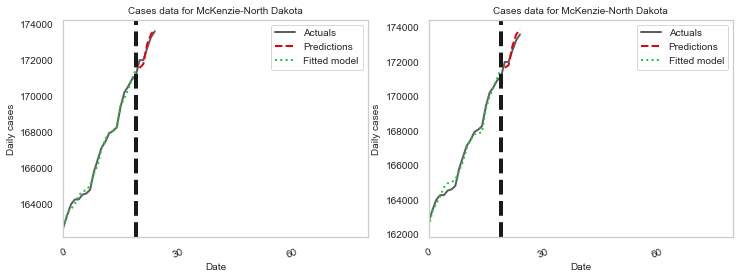

(40, 100)
(5, 100)
tau_hat: 0.6108728044059581
tau_pre: 2.737656237238992e-06
2D for McKenzie-North Dakota True
McLean-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5267129135006807
tau_pre: 7.763917406334968e-06
1D for McLean-North Dakota True


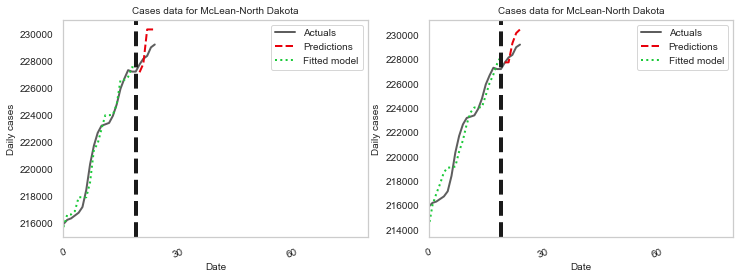

(40, 100)
(5, 100)
tau_hat: 0.6259695256100738
tau_pre: 3.2584652380739665e-05
2D for McLean-North Dakota True
McPherson-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967153903
tau_pre: 1.0346778397723186e-05
1D for McPherson-South Dakota True


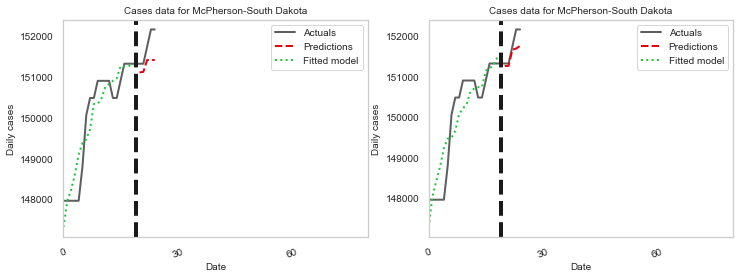

(40, 100)
(5, 100)
tau_hat: 0.6108728044064456
tau_pre: 1.553071202604741e-05
2D for McPherson-South Dakota True
Meade-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5007608615766012
tau_pre: 7.061364223866591e-06
1D for Meade-South Dakota True


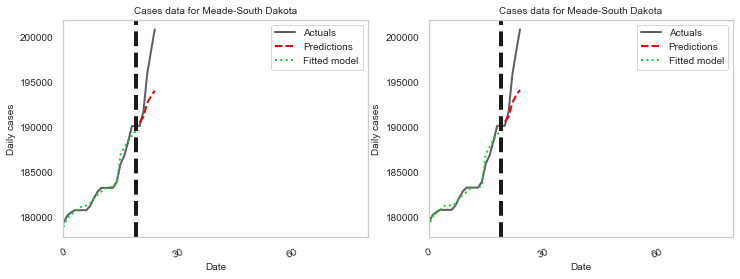

(40, 100)
(5, 100)
tau_hat: 0.5704111865758164
tau_pre: 8.257789745567857e-06
2D for Meade-South Dakota True
Meagher-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.4817793761863932
tau_pre: 1.843012060257983e-06
1D for Meagher-Montana True


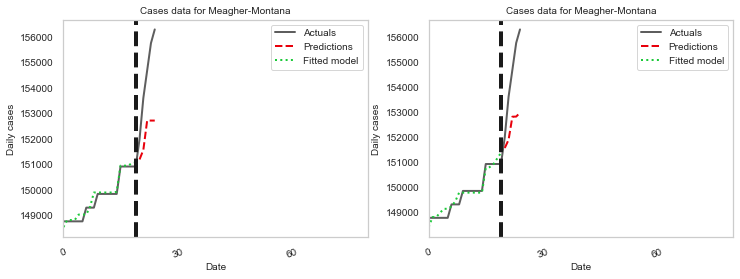

(40, 100)
(5, 100)
tau_hat: 0.5832263331101702
tau_pre: 7.883813182716036e-06
2D for Meagher-Montana True
Mellette-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648397899
tau_pre: 4.919839499746769e-06
1D for Mellette-South Dakota True


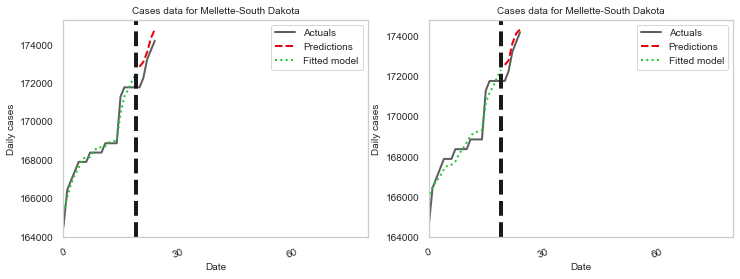

(40, 100)
(5, 100)
tau_hat: 0.593595220950663
tau_pre: 8.341362315008472e-06
2D for Mellette-South Dakota True
Mercer-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218827074
tau_pre: 2.9316476565817063e-06
1D for Mercer-North Dakota True


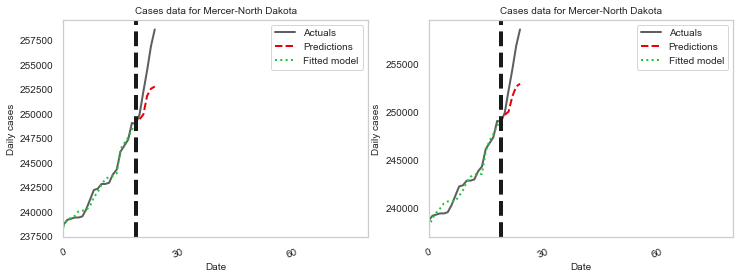

(40, 100)
(5, 100)
tau_hat: 0.608268836122368
tau_pre: 6.657271343011813e-06
2D for Mercer-North Dakota True
Miami-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.552424753693671
tau_pre: 2.9526284722059767e-06
1D for Miami-Indiana True


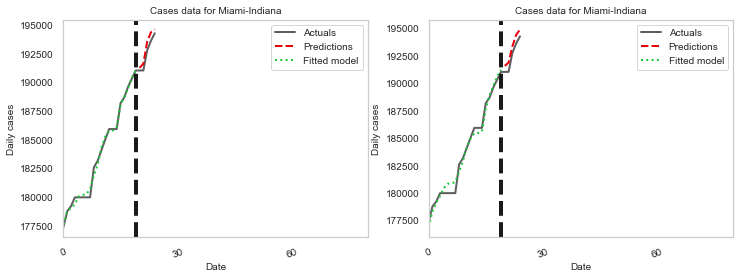

(40, 100)
(5, 100)
tau_hat: 0.6061585095859302
tau_pre: 9.402741264766114e-06
2D for Miami-Indiana True
Miner-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.42134744460680407
tau_pre: 2.4437228322194724e-06
1D for Miner-South Dakota True


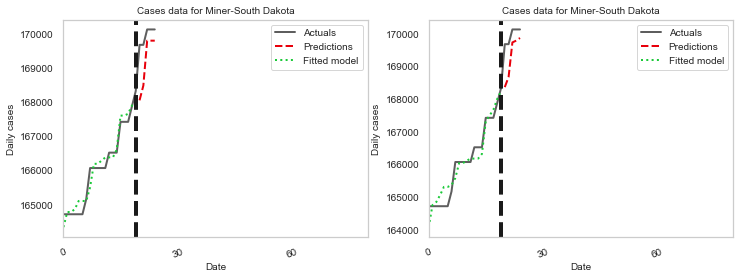

(40, 100)
(5, 100)
tau_hat: 0.49745997293696187
tau_pre: 5.012555145342499e-06
2D for Miner-South Dakota True
Mineral-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5007608615913892
tau_pre: 1.7523968754523837e-06
1D for Mineral-Montana True


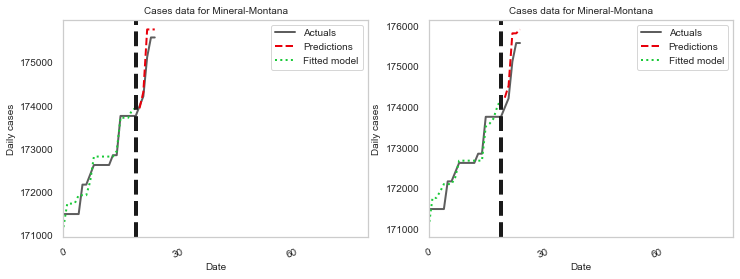

(40, 100)
(5, 100)
tau_hat: 0.5704111865788554
tau_pre: 5.891164394262211e-06
2D for Mineral-Montana True
Minnehaha-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5575317965360953
tau_pre: 6.365517552249995e-06
1D for Minnehaha-South Dakota True


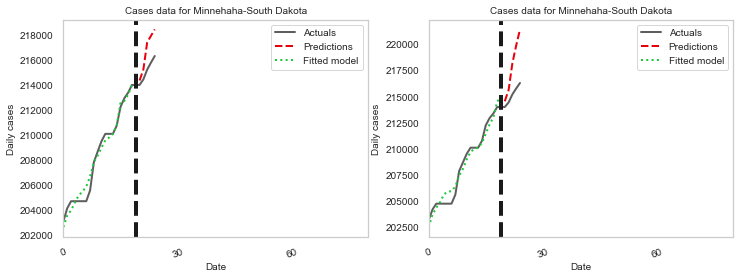

(40, 100)
(5, 100)
tau_hat: 0.6461244129210216
tau_pre: 1.2170292206944017e-05
2D for Minnehaha-South Dakota True
Missoula-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5475427282850811
tau_pre: 7.951711180379251e-06
1D for Missoula-Montana True


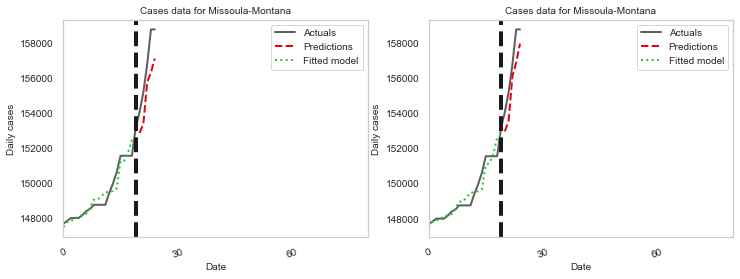

(40, 100)
(5, 100)
tau_hat: 0.6408761888862785
tau_pre: 8.459037285890321e-06
2D for Missoula-Montana True
Monroe-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5640422085902882
tau_pre: 5.110885464303505e-06
1D for Monroe-Indiana True


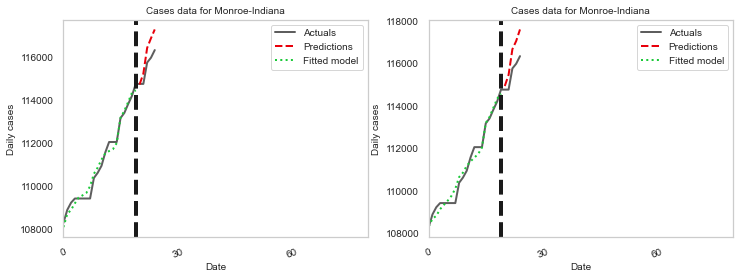

(40, 100)
(5, 100)
tau_hat: 0.6356218463183538
tau_pre: 6.310004863107343e-06
2D for Monroe-Indiana True
Montgomery-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5197248755696776
tau_pre: 8.651311894963975e-06
1D for Montgomery-Indiana True


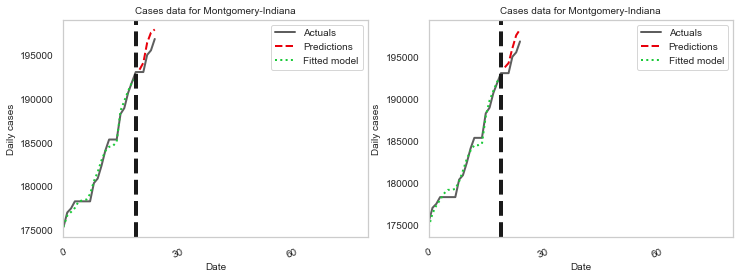

(40, 100)
(5, 100)
tau_hat: 0.6221763666740765
tau_pre: 1.2211291657923289e-05
2D for Montgomery-Indiana True
Moody-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5090010093865166
tau_pre: 3.9478460668573455e-05
1D for Moody-South Dakota True


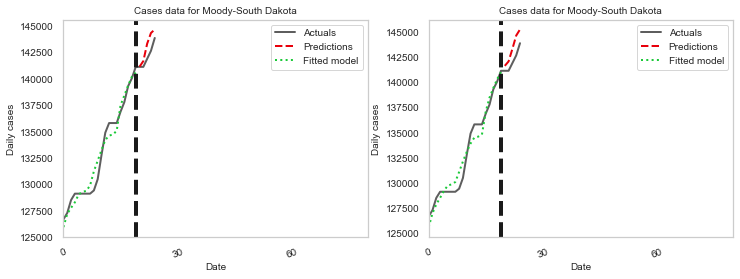

(40, 100)
(5, 100)
tau_hat: 0.6200786015985975
tau_pre: 4.07775423501758e-05
2D for Moody-South Dakota True
Morgan-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.423321110503658
tau_pre: 3.338870444116594e-06
1D for Morgan-Indiana True


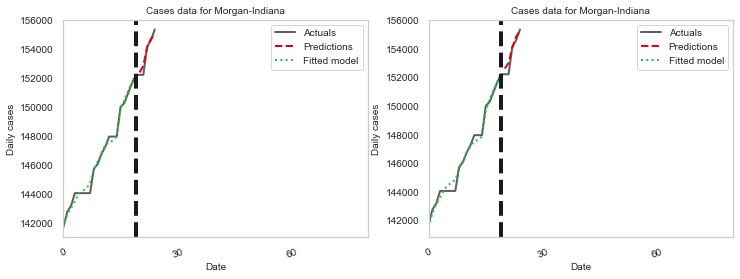

(40, 100)
(5, 100)
tau_hat: 0.5051736127095338
tau_pre: 8.459450621461701e-06
2D for Morgan-Indiana True
Morton-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5200790342982254
tau_pre: 2.1358490574043404e-06
1D for Morton-North Dakota True


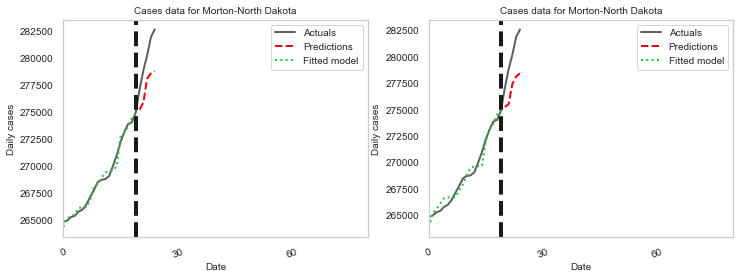

(40, 100)
(5, 100)
tau_hat: 0.6234264168765555
tau_pre: 5.564891706705132e-06
2D for Morton-North Dakota True
Mountrail-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536930174
tau_pre: 2.9961651288740316e-06
1D for Mountrail-North Dakota True


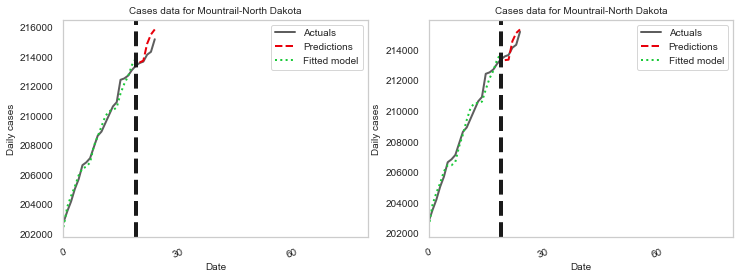

(40, 100)
(5, 100)
tau_hat: 0.6061585095876975
tau_pre: 7.5209169819716585e-06
2D for Mountrail-North Dakota True
Murray-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5225247176099826
tau_pre: 1.0371551783222732e-06
1D for Murray-Oklahoma True


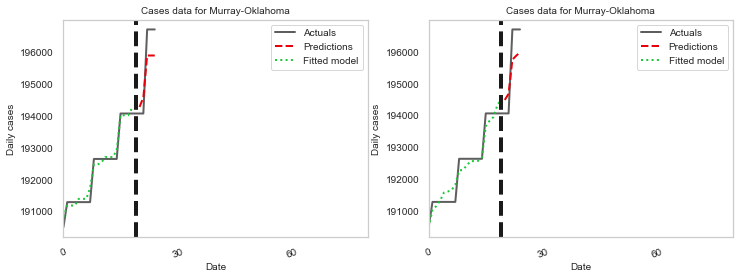

(40, 100)
(5, 100)
tau_hat: 0.6175553516688559
tau_pre: 3.5330980712515955e-06
2D for Murray-Oklahoma True
Muskogee-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.48849402498370625
tau_pre: 1.6853810939474702e-06
1D for Muskogee-Oklahoma True


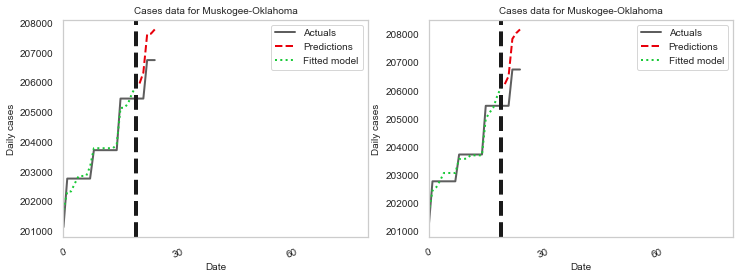

(40, 100)
(5, 100)
tau_hat: 0.5860272890990927
tau_pre: 4.53364075217181e-06
2D for Muskogee-Oklahoma True
Musselshell-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648442992
tau_pre: 3.7169293497632067e-06
1D for Musselshell-Montana True


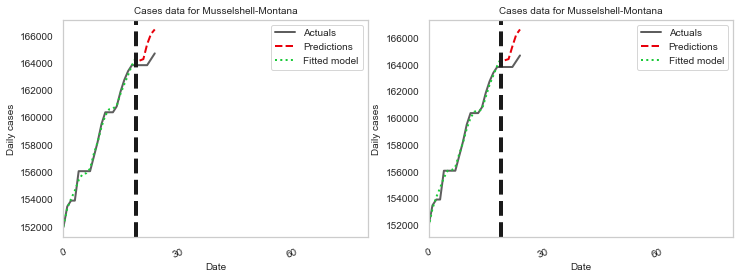

(40, 100)
(5, 100)
tau_hat: 0.5935952209317327
tau_pre: 6.49405850899825e-06
2D for Musselshell-Montana True
Nelson-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5392847362585336
tau_pre: 6.452384796584297e-06
1D for Nelson-North Dakota True


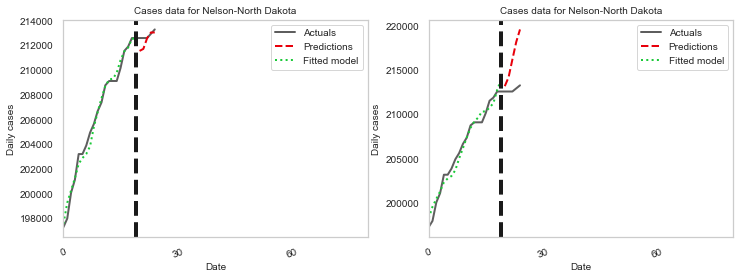

(40, 100)
(5, 100)
tau_hat: 0.6143168718866817
tau_pre: 1.9791314229497864e-05
2D for Nelson-North Dakota True
Newton-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648435316
tau_pre: 5.646042477533883e-06
1D for Newton-Indiana True


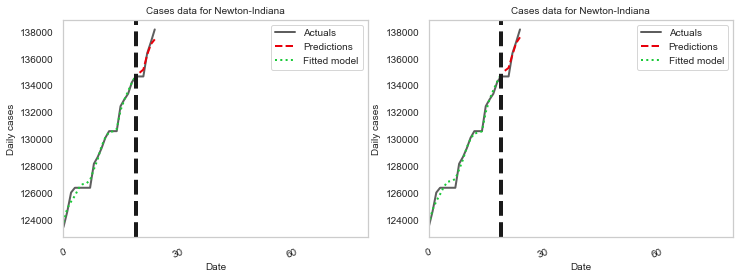

(40, 100)
(5, 100)
tau_hat: 0.593595220929079
tau_pre: 8.357266552645282e-06
2D for Newton-Indiana True
Noble-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218775224
tau_pre: 4.758557269679024e-06
1D for Noble-Indiana True


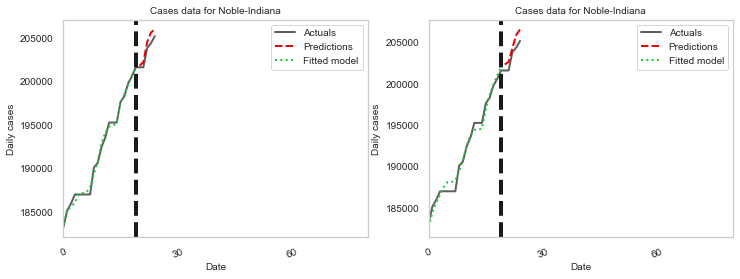

(40, 100)
(5, 100)
tau_hat: 0.6082688361301584
tau_pre: 1.4448668866251083e-05
2D for Noble-Indiana True
Noble-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5652937665588832
tau_pre: 1.4736949309627743e-06
1D for Noble-Oklahoma True


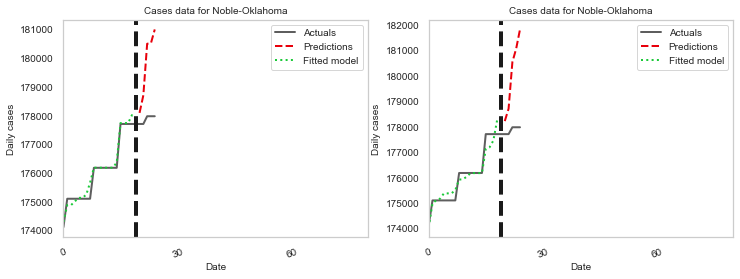

(40, 100)
(5, 100)
tau_hat: 0.6460993007662944
tau_pre: 3.7303007632869794e-06
2D for Noble-Oklahoma True
Nowata-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536962147
tau_pre: 6.697581514803947e-06
1D for Nowata-Oklahoma True


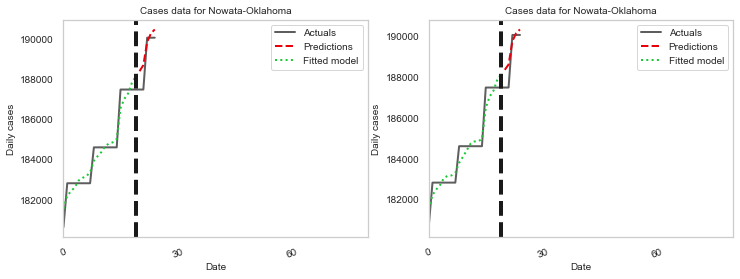

(40, 100)
(5, 100)
tau_hat: 0.6061585095892782
tau_pre: 8.072640993985744e-06
2D for Nowata-Oklahoma True
Oglala Lakota-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.524595702187924
tau_pre: 3.386115279887923e-05
1D for Oglala Lakota-South Dakota True


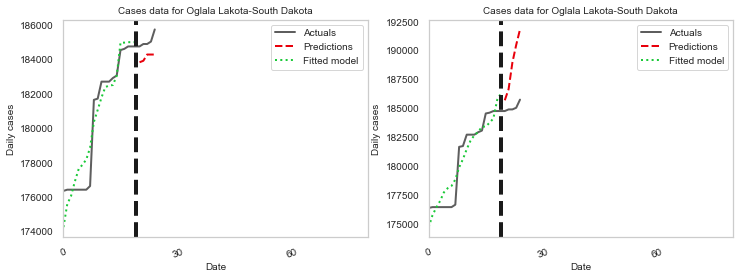

(40, 100)
(5, 100)
tau_hat: 0.6176533610213997
tau_pre: 5.6502490931023266e-05
2D for Oglala Lakota-South Dakota True
Ohio-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.549925728786319
tau_pre: 4.1978728646002185e-06
1D for Ohio-Indiana True


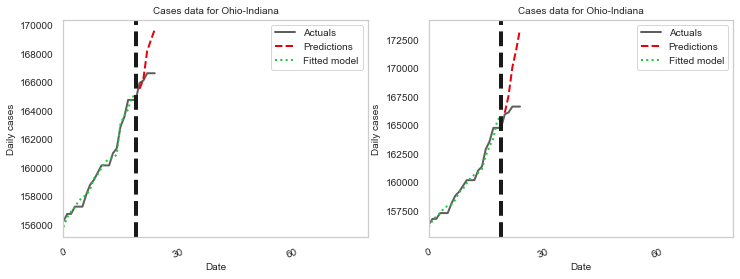

(40, 100)
(5, 100)
tau_hat: 0.6255163868555116
tau_pre: 7.224865363630303e-06
2D for Ohio-Indiana True
Okfuskee-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5267568248434165
tau_pre: 1.8903862460946767e-06
1D for Okfuskee-Oklahoma True


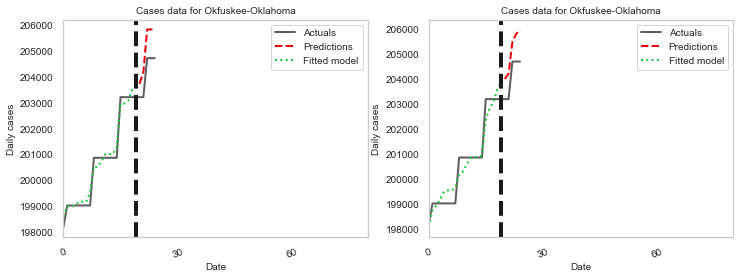

(40, 100)
(5, 100)
tau_hat: 0.6231553196793981
tau_pre: 5.257404146275354e-06
2D for Okfuskee-Oklahoma True
Oklahoma-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5665300783153814
tau_pre: 1.7620633893635566e-06
1D for Oklahoma-Oklahoma True


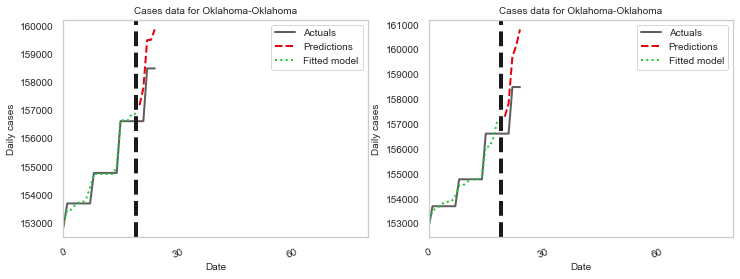

(40, 100)
(5, 100)
tau_hat: 0.6426911230704512
tau_pre: 4.365266995248105e-06
2D for Oklahoma-Oklahoma True
Okmulgee-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536946295
tau_pre: 1.0023792012839612e-05
1D for Okmulgee-Oklahoma True


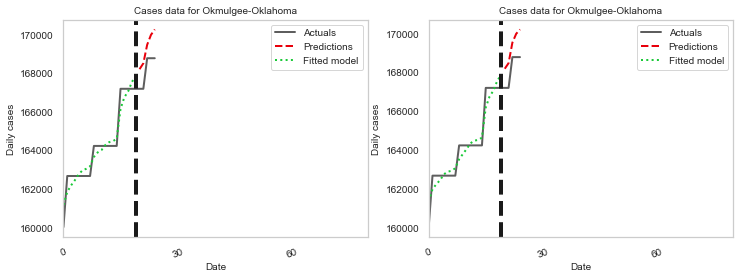

(40, 100)
(5, 100)
tau_hat: 0.6061585095854687
tau_pre: 1.0987432193412345e-05
2D for Okmulgee-Oklahoma True
Oliver-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5681405966810221
tau_pre: 5.307312266182557e-05
1D for Oliver-North Dakota True


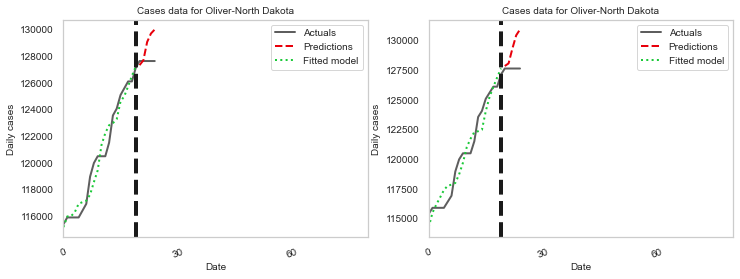

(40, 100)
(5, 100)
tau_hat: 0.6108728044037959
tau_pre: 6.27655547283069e-05
2D for Oliver-North Dakota True
Orange-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5040024520084708
tau_pre: 1.9229124371606436e-05
1D for Orange-Indiana True


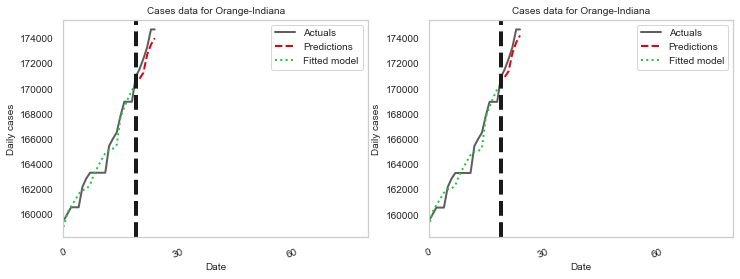

(40, 100)
(5, 100)
tau_hat: 0.5770948320962753
tau_pre: 2.2139915381278534e-05
2D for Orange-Indiana True
Orange-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.4230751521146842
tau_pre: 1.6941015184059806e-05
1D for Orange-Vermont True


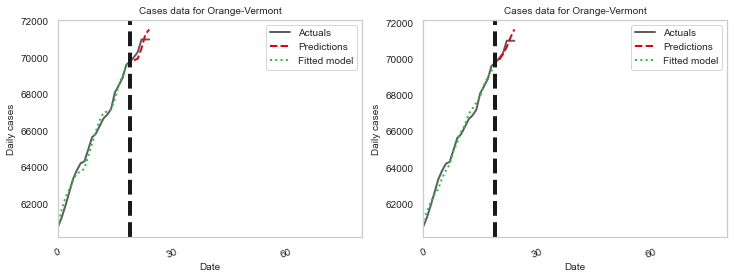

(40, 100)
(5, 100)
tau_hat: 0.5126879706215552
tau_pre: 4.649800577476731e-05
2D for Orange-Vermont True
Orleans-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5495534274136622
tau_pre: 2.2504541616651434e-05
1D for Orleans-Vermont True


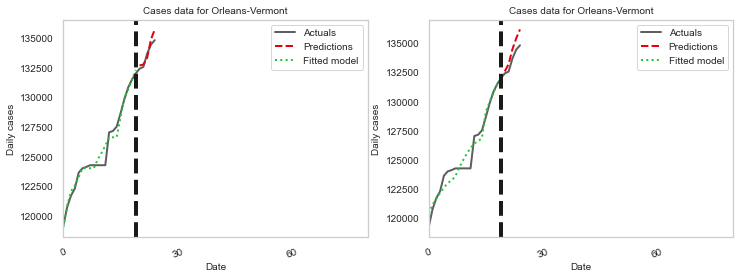

(40, 100)
(5, 100)
tau_hat: 0.6164178041023245
tau_pre: 3.187767719083118e-05
2D for Orleans-Vermont True
Osage-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648447614
tau_pre: 5.044991134603214e-06
1D for Osage-Oklahoma True


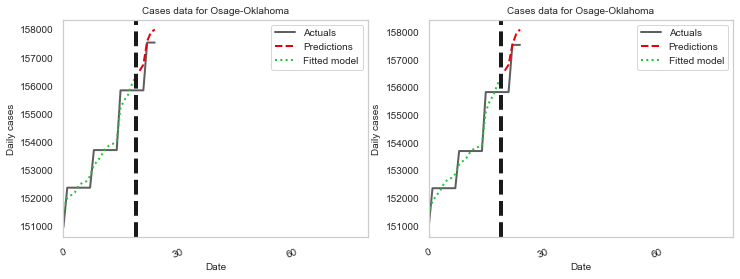

(40, 100)
(5, 100)
tau_hat: 0.5935952209372538
tau_pre: 5.83246777407181e-06
2D for Osage-Oklahoma True
Ottawa-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648432059
tau_pre: 6.765156235392931e-06
1D for Ottawa-Oklahoma True


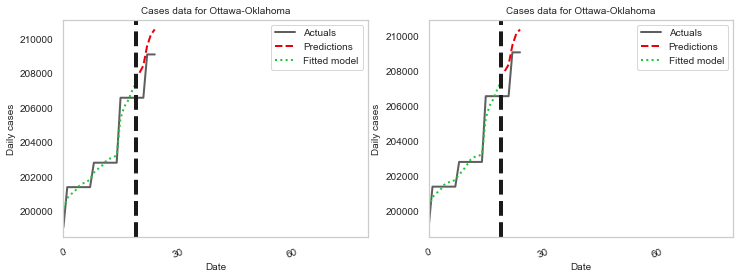

(40, 100)
(5, 100)
tau_hat: 0.5935952209315755
tau_pre: 7.556810623711575e-06
2D for Ottawa-Oklahoma True
Owen-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247537071032
tau_pre: 2.7741125870356028e-06
1D for Owen-Indiana True


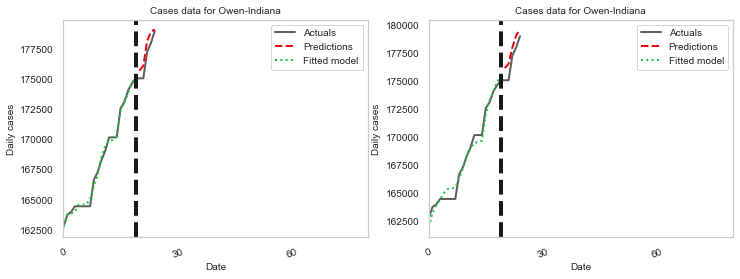

(40, 100)
(5, 100)
tau_hat: 0.6061585095950409
tau_pre: 1.2792605452509733e-05
2D for Owen-Indiana True
Park-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5636846018150939
tau_pre: 2.485153713728707e-06
1D for Park-Montana True


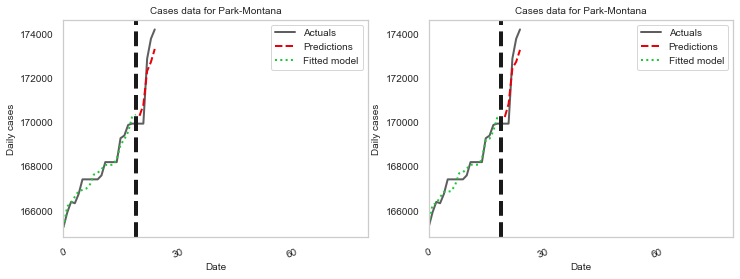

(40, 100)
(5, 100)
tau_hat: 0.6361257963923809
tau_pre: 3.3305060105937567e-06
2D for Park-Montana True
Parke-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218766766
tau_pre: 6.682687987962439e-06
1D for Parke-Indiana True


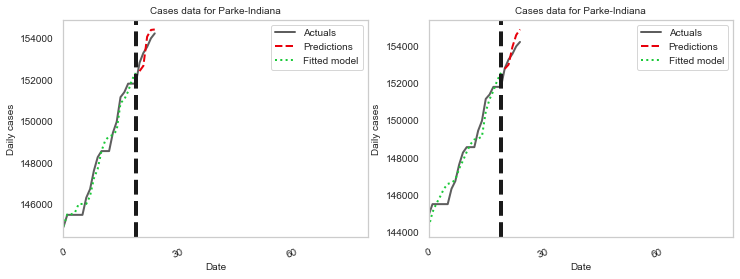

(40, 100)
(5, 100)
tau_hat: 0.6082688361200767
tau_pre: 1.4013738546665267e-05
2D for Parke-Indiana True
Pawnee-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.4958445303032771
tau_pre: 4.150385000460196e-06
1D for Pawnee-Oklahoma True


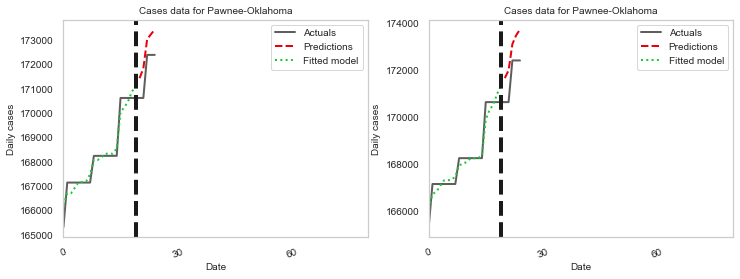

(40, 100)
(5, 100)
tau_hat: 0.6012928236251791
tau_pre: 5.6697930588159734e-06
2D for Pawnee-Oklahoma True
Payne-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5108036436625518
tau_pre: 1.1250022096616315e-06
1D for Payne-Oklahoma True


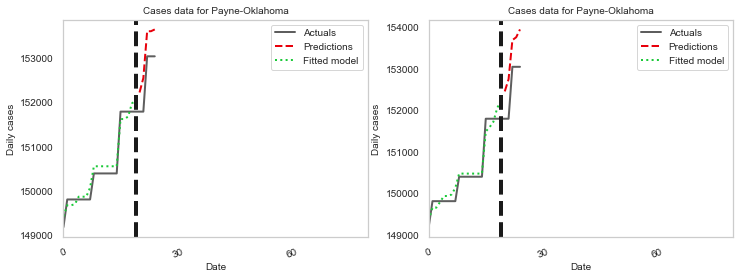

(40, 100)
(5, 100)
tau_hat: 0.6204346875209159
tau_pre: 2.7038736299241972e-06
2D for Payne-Oklahoma True
Pembina-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.504988840440516
tau_pre: 1.650133088930005e-06
1D for Pembina-North Dakota True


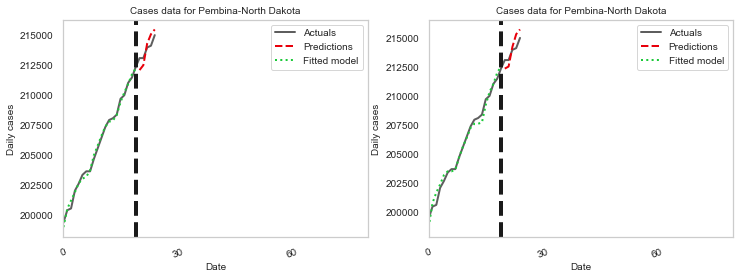

(40, 100)
(5, 100)
tau_hat: 0.5769844906840318
tau_pre: 1.1523175539683388e-05
2D for Pembina-North Dakota True
Pennington-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5486140620999737
tau_pre: 9.324682602224171e-07
1D for Pennington-South Dakota True


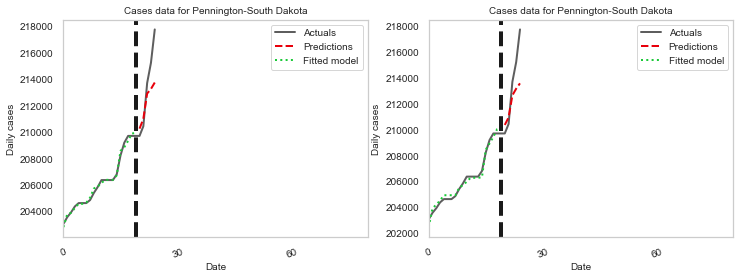

(40, 100)
(5, 100)
tau_hat: 0.6187803018925918
tau_pre: 3.968070504547985e-06
2D for Pennington-South Dakota True
Perkins-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648440584
tau_pre: 2.245387089396e-05
1D for Perkins-South Dakota True


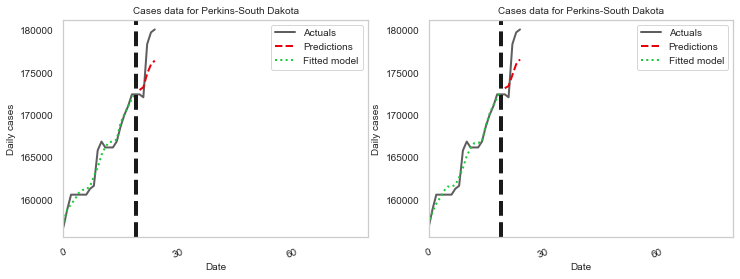

(40, 100)
(5, 100)
tau_hat: 0.5935952209331086
tau_pre: 2.4182698996062363e-05
2D for Perkins-South Dakota True
Perry-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5499361293179417
tau_pre: 1.8957174957078805e-05
1D for Perry-Indiana True


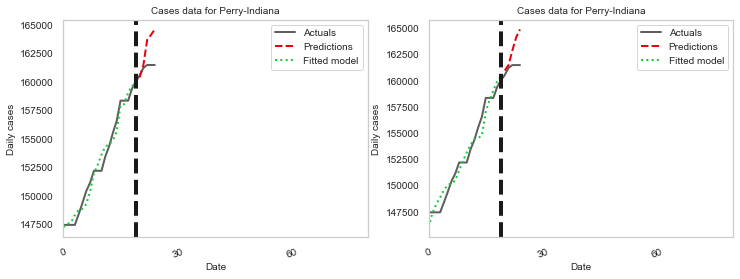

(40, 100)
(5, 100)
tau_hat: 0.616242719166031
tau_pre: 3.4506406761984004e-05
2D for Perry-Indiana True
Petroleum-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648288754
tau_pre: 0.0004988356496246791
1D for Petroleum-Montana True


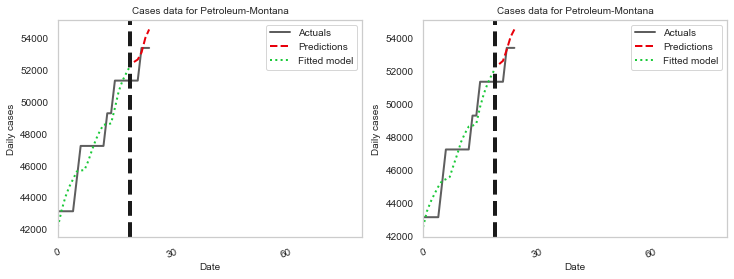

(40, 100)
(5, 100)
tau_hat: 0.5935952209452481
tau_pre: 0.00036093508516297856
2D for Petroleum-Montana True
Phillips-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5267223735403154
tau_pre: 4.568141783541052e-06
1D for Phillips-Montana True


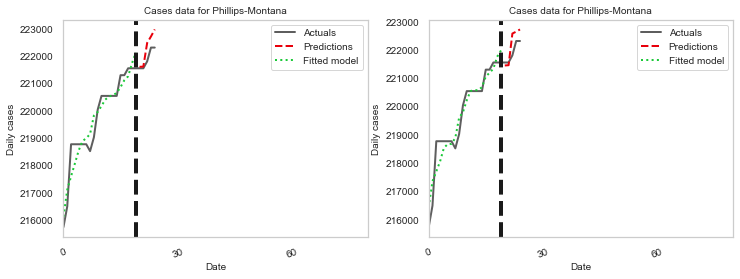

(40, 100)
(5, 100)
tau_hat: 0.619022545177698
tau_pre: 6.132111864667638e-06
2D for Phillips-Montana True
Pierce-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5220028870884388
tau_pre: 9.639497928427472e-07
1D for Pierce-North Dakota True


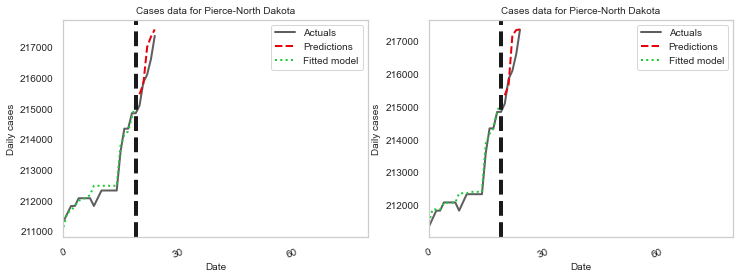

(40, 100)
(5, 100)
tau_hat: 0.6282157351390893
tau_pre: 2.068804509683356e-06
2D for Pierce-North Dakota True
Pike-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5558012717440276
tau_pre: 1.1049259879114707e-05
1D for Pike-Indiana True


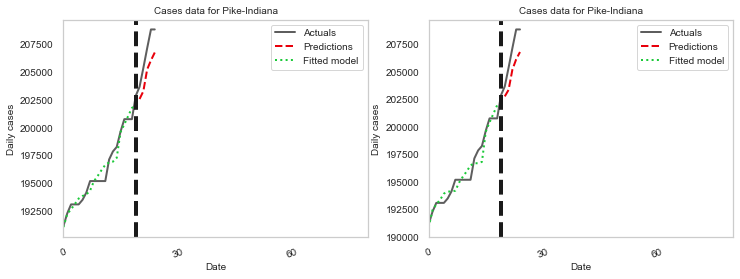

(40, 100)
(5, 100)
tau_hat: 0.6221917259755214
tau_pre: 1.6897760457183733e-05
2D for Pike-Indiana True
Pittsburg-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5141050538349003
tau_pre: 4.188396409638596e-06
1D for Pittsburg-Oklahoma True


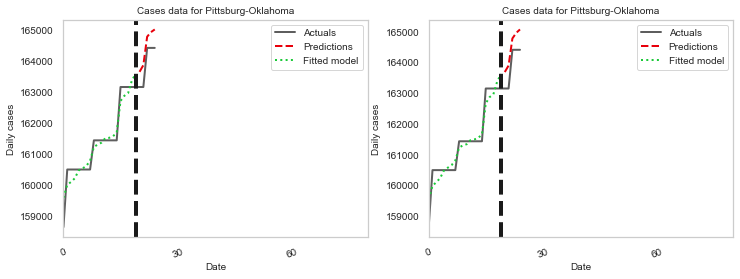

(40, 100)
(5, 100)
tau_hat: 0.6095083606648191
tau_pre: 5.794891909900169e-06
2D for Pittsburg-Oklahoma True
Pondera-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.48387169823175175
tau_pre: 2.3403866584680075e-06
1D for Pondera-Montana True


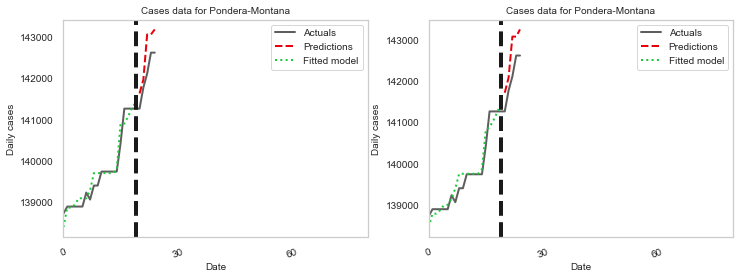

(40, 100)
(5, 100)
tau_hat: 0.5598791721306907
tau_pre: 6.390519640872863e-06
2D for Pondera-Montana True
Pontotoc-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.48849402497004857
tau_pre: 2.4098771944473804e-06
1D for Pontotoc-Oklahoma True


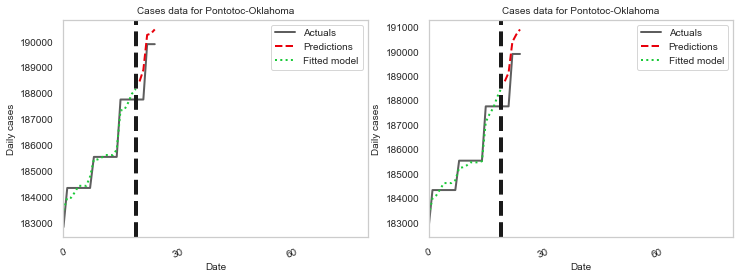

(40, 100)
(5, 100)
tau_hat: 0.586027289118081
tau_pre: 5.268597633026521e-06
2D for Pontotoc-Oklahoma True
Porter-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5466899646972158
tau_pre: 8.804491824498383e-06
1D for Porter-Indiana True


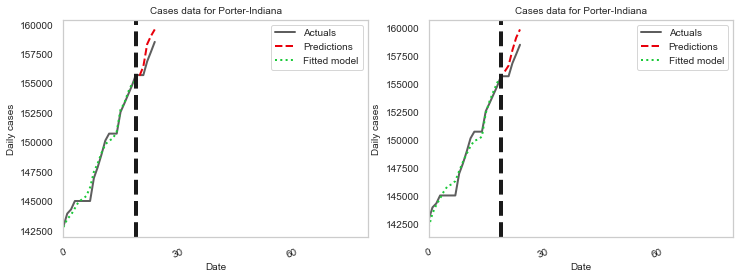

(40, 100)
(5, 100)
tau_hat: 0.6175602454291826
tau_pre: 1.8760157560742004e-05
2D for Porter-Indiana True
Posey-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5108036436174528
tau_pre: 2.0229102225042046e-06
1D for Posey-Indiana True


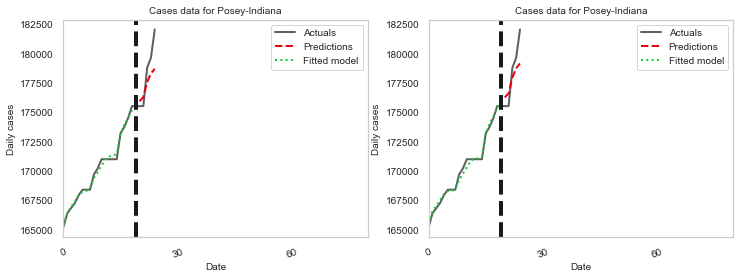

(40, 100)
(5, 100)
tau_hat: 0.62043468753764
tau_pre: 5.538644539572719e-06
2D for Posey-Indiana True
Pottawatomie-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5147078530678794
tau_pre: 3.2919143981359913e-06
1D for Pottawatomie-Oklahoma True


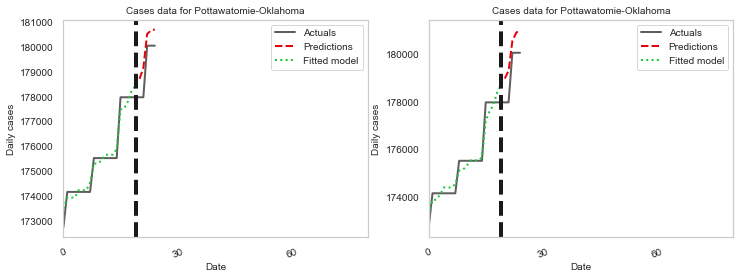

(40, 100)
(5, 100)
tau_hat: 0.6183218662467944
tau_pre: 5.268316419433557e-06
2D for Pottawatomie-Oklahoma True
Potter-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.563457572335914
tau_pre: 1.1896642862722171e-05
1D for Potter-South Dakota True


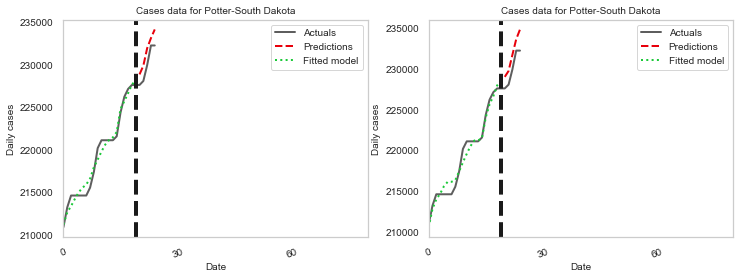

(40, 100)
(5, 100)
tau_hat: 0.6511166066073059
tau_pre: 1.8362910621937527e-05
2D for Potter-South Dakota True
Powder River-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967227144
tau_pre: 5.193831880126038e-07
1D for Powder River-Montana True


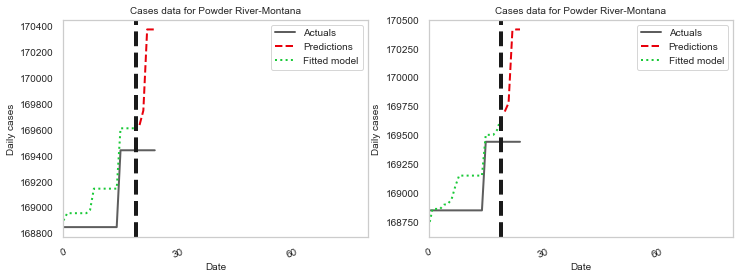

(40, 100)
(5, 100)
tau_hat: 0.6108728044025533
tau_pre: 9.930087210622426e-07
2D for Powder River-Montana True
Powell-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5237802020006711
tau_pre: 2.73786597153397e-06
1D for Powell-Montana True


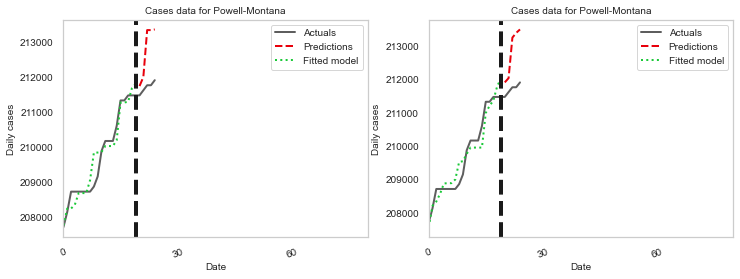

(40, 100)
(5, 100)
tau_hat: 0.6236040897434525
tau_pre: 5.050835931223474e-06
2D for Powell-Montana True
Prairie-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648451867
tau_pre: 4.9103049609488434e-05
1D for Prairie-Montana True


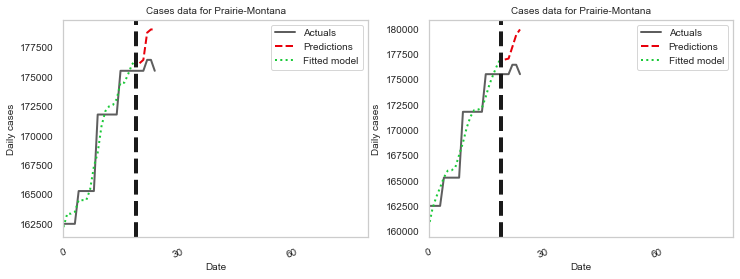

(40, 100)
(5, 100)
tau_hat: 0.5935952209443479
tau_pre: 6.438772570816518e-05
2D for Prairie-Montana True
Pulaski-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5141050538457687
tau_pre: 5.1128070361520925e-06
1D for Pulaski-Indiana True


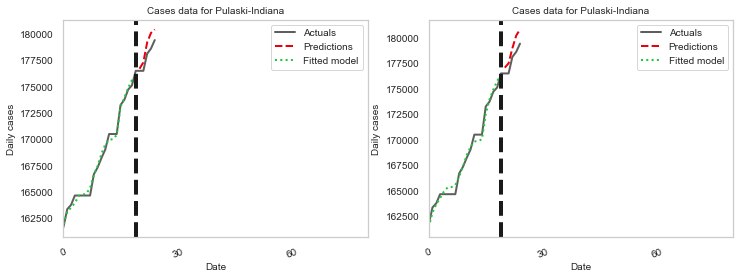

(40, 100)
(5, 100)
tau_hat: 0.6095083606677884
tau_pre: 1.021343990874135e-05
2D for Pulaski-Indiana True
Pushmataha-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648499067
tau_pre: 6.774066307859103e-07
1D for Pushmataha-Oklahoma True


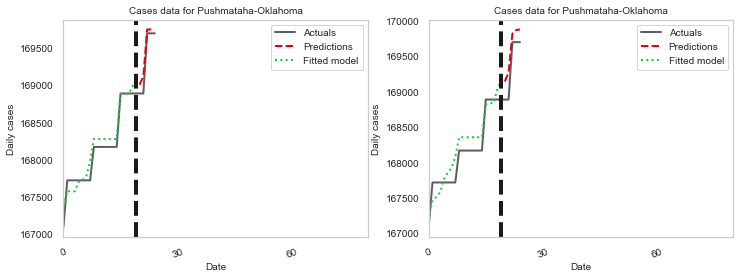

(40, 100)
(5, 100)
tau_hat: 0.5935952209248276
tau_pre: 1.7682953469893702e-06
2D for Pushmataha-Oklahoma True
Putnam-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536972533
tau_pre: 2.0850056832729e-06
1D for Putnam-Indiana True


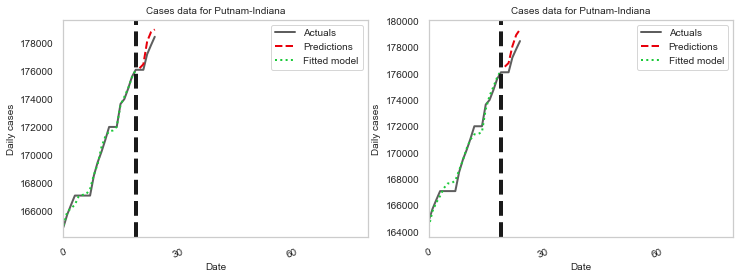

(40, 100)
(5, 100)
tau_hat: 0.606158509578022
tau_pre: 7.851548844909214e-06
2D for Putnam-Indiana True
Ramsey-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5558012717494374
tau_pre: 5.88824110520645e-06
1D for Ramsey-North Dakota True


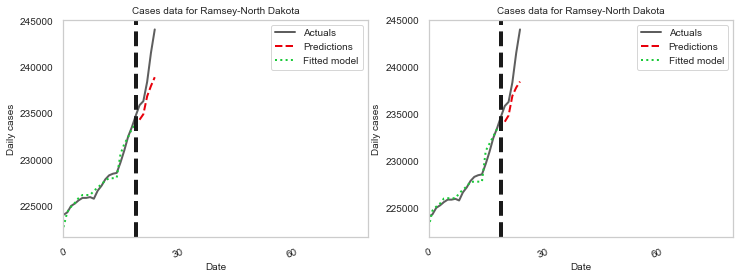

(40, 100)
(5, 100)
tau_hat: 0.6221917259764087
tau_pre: 1.0327021522983726e-05
2D for Ramsey-North Dakota True
Randolph-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5225247176145962
tau_pre: 9.58368033536984e-06
1D for Randolph-Indiana True


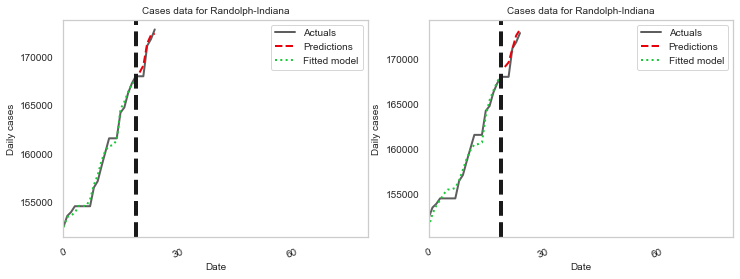

(40, 100)
(5, 100)
tau_hat: 0.6175553516754371
tau_pre: 1.9995103748847798e-05
2D for Randolph-Indiana True
Ransom-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5636846018100289
tau_pre: 1.0317967564452199e-05
1D for Ransom-North Dakota True


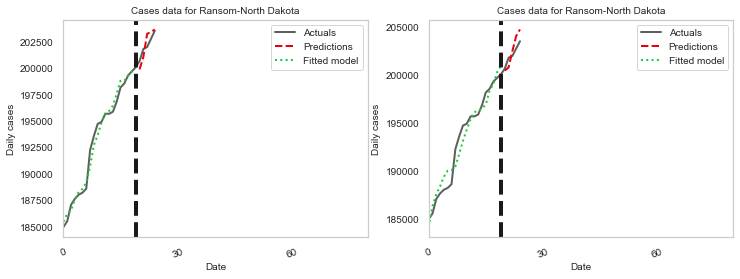

(40, 100)
(5, 100)
tau_hat: 0.6361257963913356
tau_pre: 4.022075257866446e-05
2D for Ransom-North Dakota True
Ravalli-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.49008058532848264
tau_pre: 1.114028052577935e-06
1D for Ravalli-Montana True


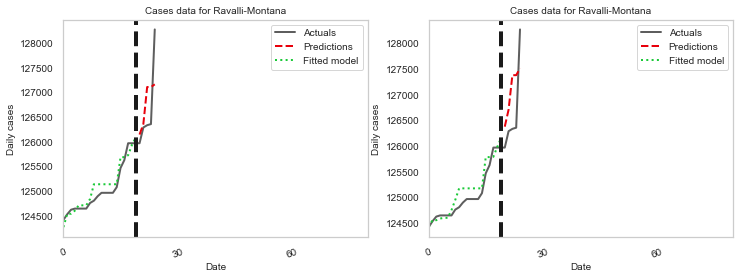

(40, 100)
(5, 100)
tau_hat: 0.589649483136764
tau_pre: 3.215354837666509e-06
2D for Ravalli-Montana True
Renville-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648535715
tau_pre: 8.943455800529734e-06
1D for Renville-North Dakota True


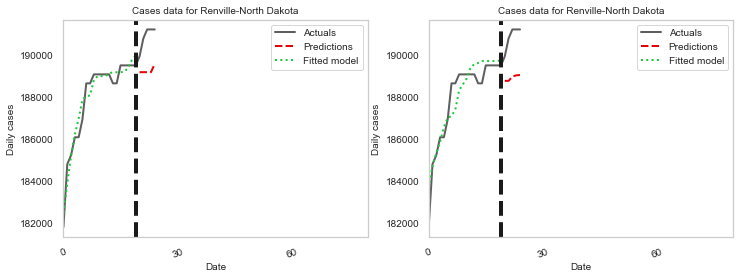

(40, 100)
(5, 100)
tau_hat: 0.5935952209357989
tau_pre: 1.9958671804550487e-05
2D for Renville-North Dakota True
Richland-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218751768
tau_pre: 3.832297184314325e-06
1D for Richland-Montana True


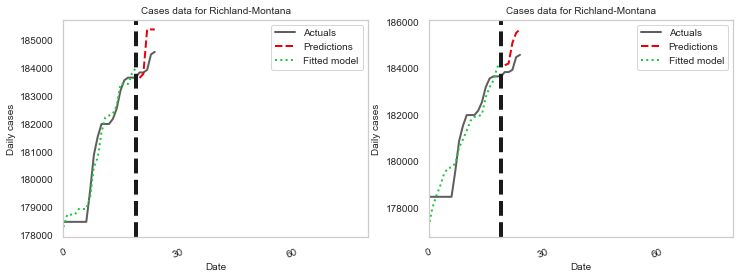

(40, 100)
(5, 100)
tau_hat: 0.6082688361238197
tau_pre: 1.4329692307249618e-05
2D for Richland-Montana True
Richland-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.48331045828882147
tau_pre: 1.3855225469989934e-06
1D for Richland-North Dakota True


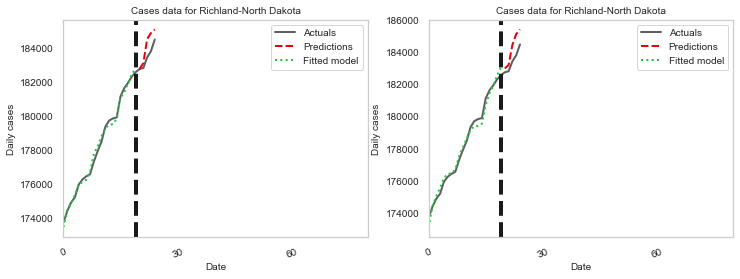

(40, 100)
(5, 100)
tau_hat: 0.5874898697577019
tau_pre: 6.532513853234388e-06
2D for Richland-North Dakota True
Ripley-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5090010094030543
tau_pre: 3.802286454494058e-06
1D for Ripley-Indiana True


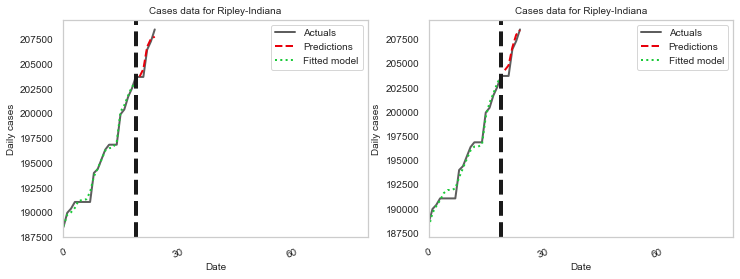

(40, 100)
(5, 100)
tau_hat: 0.6200786015925014
tau_pre: 7.854109819673508e-06
2D for Ripley-Indiana True
Roberts-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5230022594404555
tau_pre: 1.7000118290907685e-06
1D for Roberts-South Dakota True


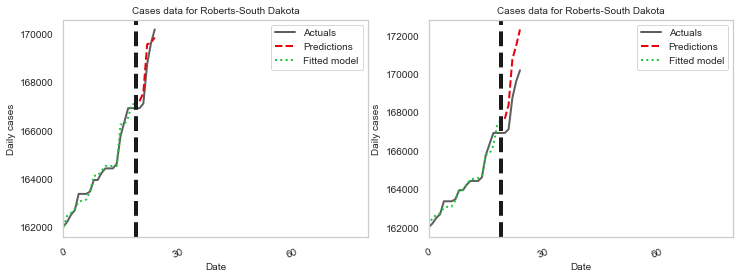

(40, 100)
(5, 100)
tau_hat: 0.6116763314712302
tau_pre: 1.3728312206765467e-05
2D for Roberts-South Dakota True
Roger Mills-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648357613
tau_pre: 0.00025298613084595676
1D for Roger Mills-Oklahoma True


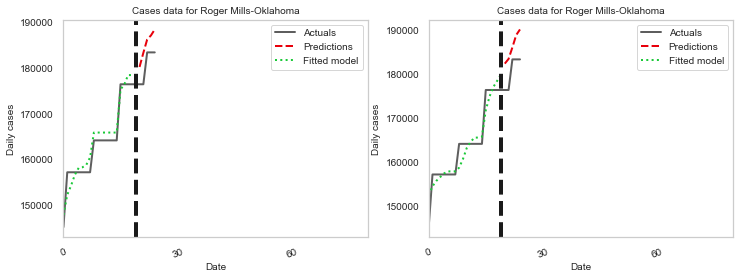

(40, 100)
(5, 100)
tau_hat: 0.593595220938786
tau_pre: 0.0002736427683140366
2D for Roger Mills-Oklahoma True
Rogers-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5197248755771496
tau_pre: 4.660589476097839e-06
1D for Rogers-Oklahoma True


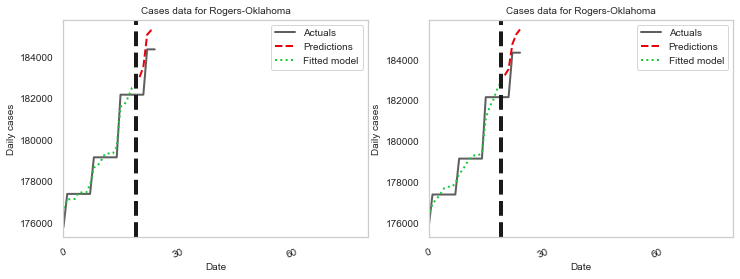

(40, 100)
(5, 100)
tau_hat: 0.6221763666786295
tau_pre: 7.178748097913219e-06
2D for Rogers-Oklahoma True
Rolette-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5332213259026977
tau_pre: 1.0909736480263597e-05
1D for Rolette-North Dakota True


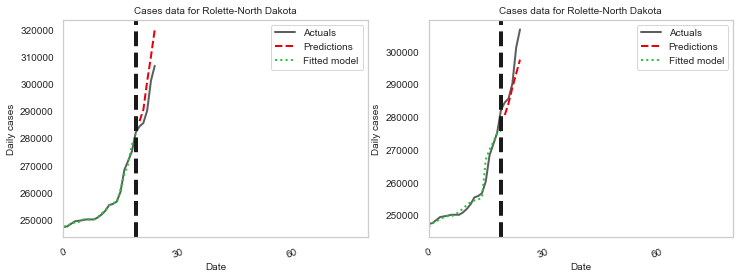

(40, 100)
(5, 100)
tau_hat: 0.6193464279899319
tau_pre: 7.34802843485161e-05
2D for Rolette-North Dakota True
Roosevelt-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5441050823085912
tau_pre: 3.0674201931651023e-06
1D for Roosevelt-Montana True


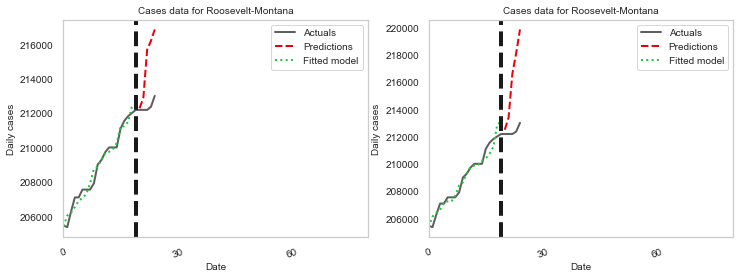

(40, 100)
(5, 100)
tau_hat: 0.6378384416684381
tau_pre: 6.856160866448719e-06
2D for Roosevelt-Montana True
Rosebud-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5685099623783347
tau_pre: 1.673906097681116e-05
1D for Rosebud-Montana True


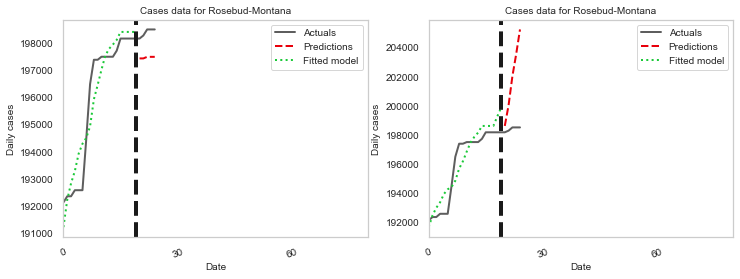

(40, 100)
(5, 100)
tau_hat: 0.6569921617598135
tau_pre: 2.770701386392455e-05
2D for Rosebud-Montana True
Rush-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5090010093903921
tau_pre: 1.2901109353111646e-05
1D for Rush-Indiana True


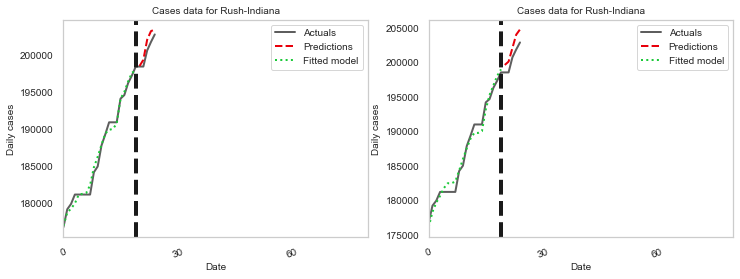

(40, 100)
(5, 100)
tau_hat: 0.6200786015992358
tau_pre: 2.3142459036839355e-05
2D for Rush-Indiana True
Rutland-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5319339067882614
tau_pre: 0.00010749061176630332
1D for Rutland-Vermont True


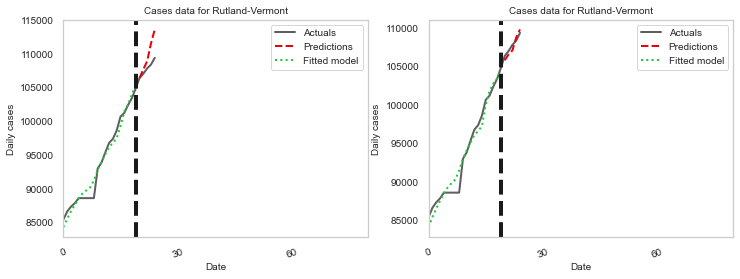

(40, 100)
(5, 100)
tau_hat: 0.6172676882368647
tau_pre: 9.198395667231431e-05
2D for Rutland-Vermont True
Sanborn-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.47848489639321146
tau_pre: 1.6198472624420814e-05
1D for Sanborn-South Dakota True


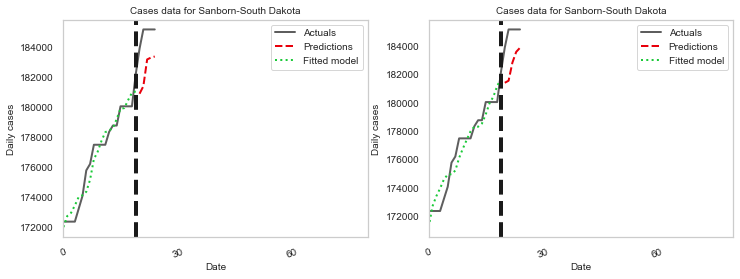

(40, 100)
(5, 100)
tau_hat: 0.5573539266455245
tau_pre: 2.7308117899158972e-05
2D for Sanborn-South Dakota True
Sanders-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218758803
tau_pre: 3.427546084107123e-06
1D for Sanders-Montana True


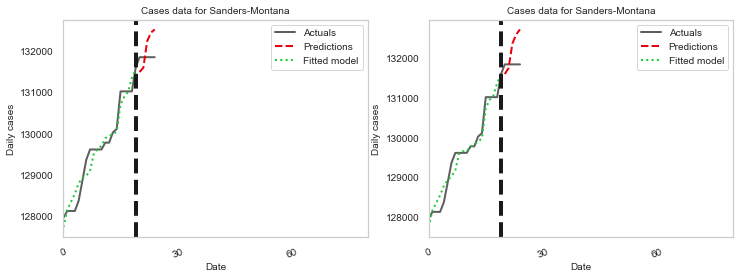

(40, 100)
(5, 100)
tau_hat: 0.6082688361233117
tau_pre: 5.590157857165864e-06
2D for Sanders-Montana True
Sargent-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5649808456962424
tau_pre: 6.14939649068258e-06
1D for Sargent-North Dakota True


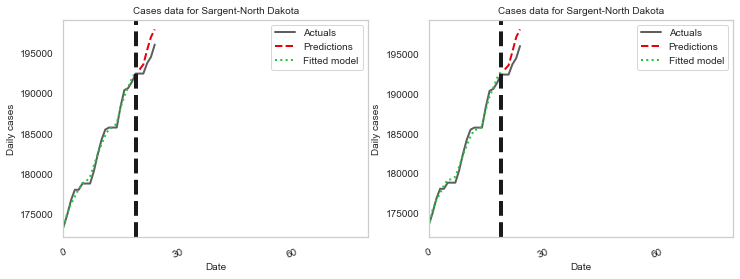

(40, 100)
(5, 100)
tau_hat: 0.6387544775767254
tau_pre: 1.5841352413561176e-05
2D for Sargent-North Dakota True
Scott-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5488244118315981
tau_pre: 2.5254459186563475e-06
1D for Scott-Indiana True


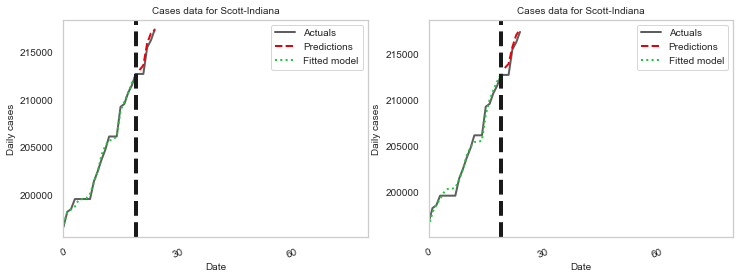

(40, 100)
(5, 100)
tau_hat: 0.6050138735432683
tau_pre: 8.43616728089425e-06
2D for Scott-Indiana True
Seminole-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.48331045828039154
tau_pre: 1.7576644466143995e-06
1D for Seminole-Oklahoma True


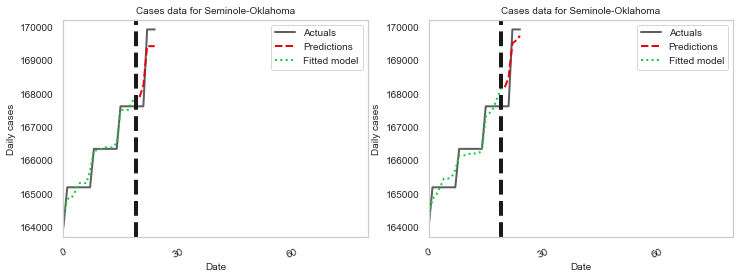

(40, 100)
(5, 100)
tau_hat: 0.5874898697322578
tau_pre: 5.447531259342399e-06
2D for Seminole-Oklahoma True
Sequoyah-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5463033942139185
tau_pre: 3.0061722584363144e-06
1D for Sequoyah-Oklahoma True


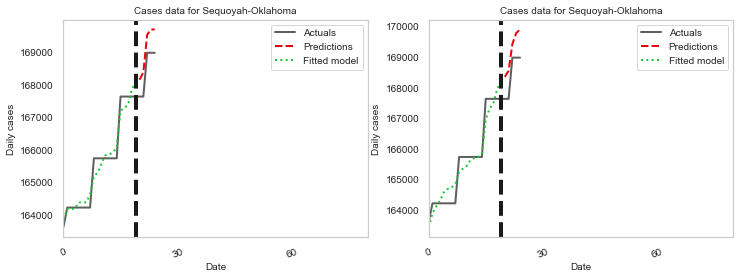

(40, 100)
(5, 100)
tau_hat: 0.6079376227236697
tau_pre: 5.513134731813174e-06
2D for Sequoyah-Oklahoma True
Shelby-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.549305363356432
tau_pre: 1.0021608663937093e-05
1D for Shelby-Indiana True


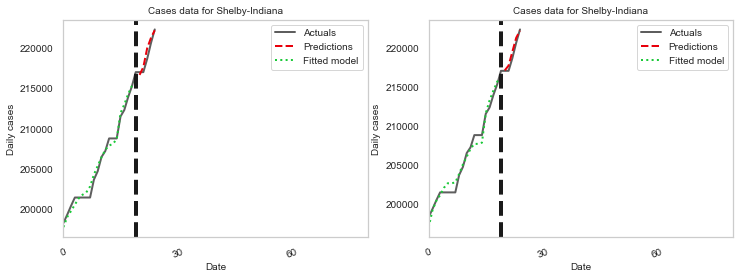

(40, 100)
(5, 100)
tau_hat: 0.6184502164306491
tau_pre: 1.9897321605381618e-05
2D for Shelby-Indiana True
Sheridan-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.49625676718721917
tau_pre: 6.196161422855539e-06
1D for Sheridan-Montana True


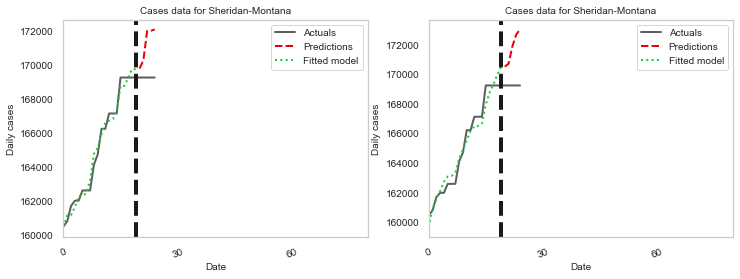

(40, 100)
(5, 100)
tau_hat: 0.601919277025306
tau_pre: 1.946459499960605e-05
2D for Sheridan-Montana True
Sheridan-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648538005
tau_pre: 6.210589988004253e-05
1D for Sheridan-North Dakota True


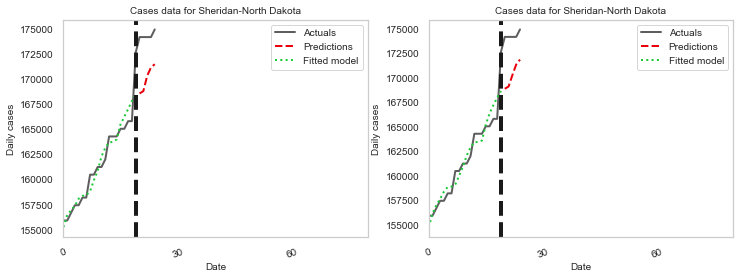

(40, 100)
(5, 100)
tau_hat: 0.5935952209309829
tau_pre: 6.288519134661586e-05
2D for Sheridan-North Dakota True
Silver Bow-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5665300783093313
tau_pre: 5.283266990619346e-06
1D for Silver Bow-Montana True


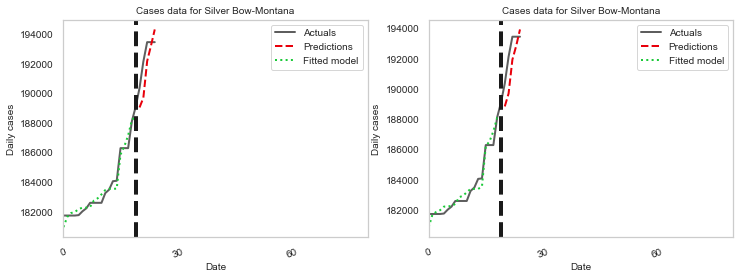

(40, 100)
(5, 100)
tau_hat: 0.6426911230770818
tau_pre: 7.66304403653441e-06
2D for Silver Bow-Montana True
Sioux-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5096753108932048
tau_pre: 2.9371130035339946e-06
1D for Sioux-North Dakota True


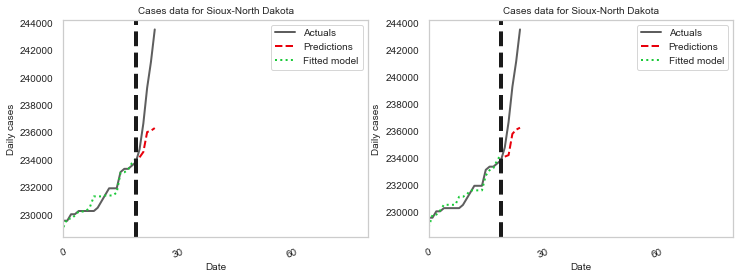

(40, 100)
(5, 100)
tau_hat: 0.6195320616288622
tau_pre: 6.174111906519101e-06
2D for Sioux-North Dakota True
Slope-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5681405967085134
tau_pre: 1.197121760210967e-05
1D for Slope-North Dakota True


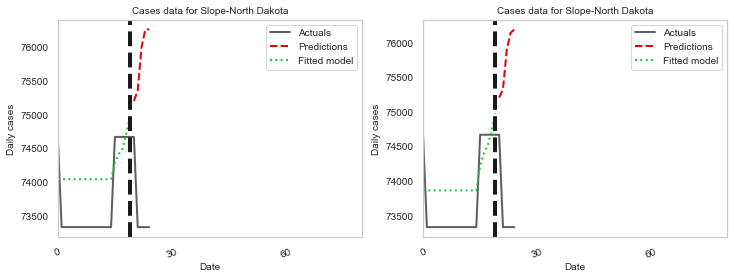

(40, 100)
(5, 100)
tau_hat: 0.6108728044118319
tau_pre: 1.4422543464848616e-05
2D for Slope-North Dakota True
Spencer-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5141050538030336
tau_pre: 4.438147906697068e-06
1D for Spencer-Indiana True


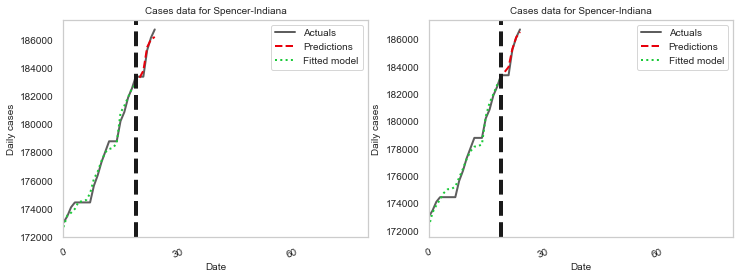

(40, 100)
(5, 100)
tau_hat: 0.6095083606555798
tau_pre: 7.653316864520756e-06
2D for Spencer-Indiana True
Spink-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.42307894830904225
tau_pre: 8.407430056694881e-07
1D for Spink-South Dakota True


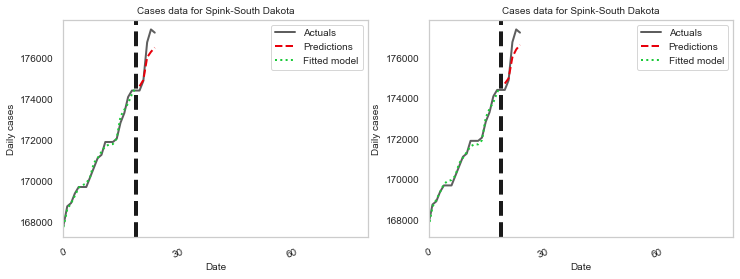

(40, 100)
(5, 100)
tau_hat: 0.5171614363032571
tau_pre: 4.000655361761702e-06
2D for Spink-South Dakota True
St. Joseph-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5550346942706146
tau_pre: 7.4712296680117214e-06
1D for St. Joseph-Indiana True


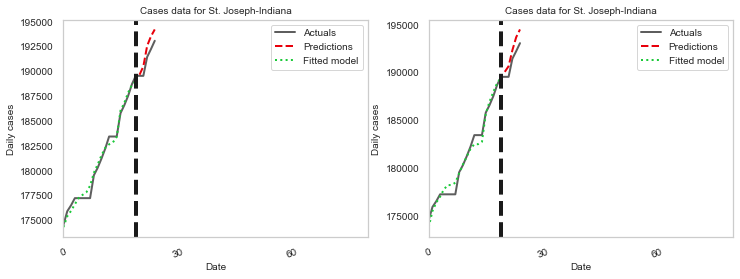

(40, 100)
(5, 100)
tau_hat: 0.6271615839998288
tau_pre: 1.4727154663843515e-05
2D for St. Joseph-Indiana True
Stanley-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.555034694273843
tau_pre: 9.062146974963584e-06
1D for Stanley-South Dakota True


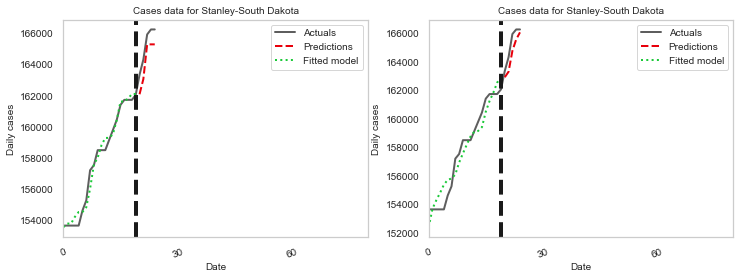

(40, 100)
(5, 100)
tau_hat: 0.6271615840036066
tau_pre: 3.284346072191755e-05
2D for Stanley-South Dakota True
Stark-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.537311564846643
tau_pre: 1.858278543628949e-06
1D for Stark-North Dakota True


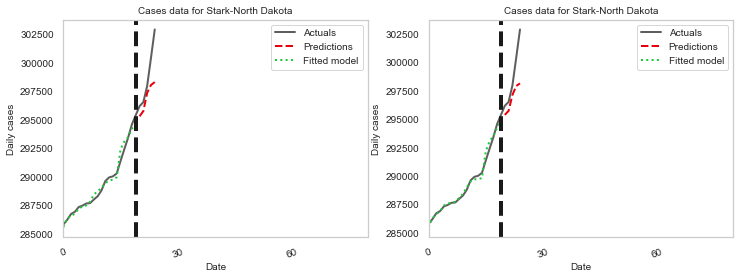

(40, 100)
(5, 100)
tau_hat: 0.5935952209321896
tau_pre: 1.5977799216136043e-06
2D for Stark-North Dakota True
Starke-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648290713
tau_pre: 3.4432274909874146e-06
1D for Starke-Indiana True


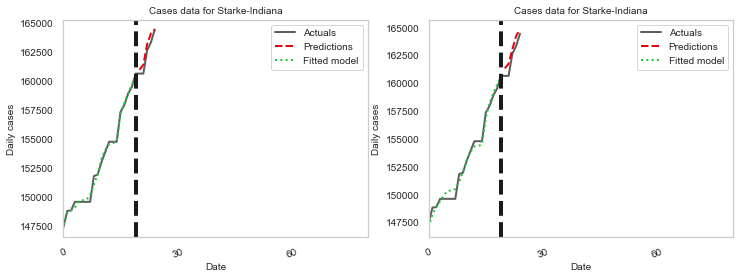

(40, 100)
(5, 100)
tau_hat: 0.5935952209365382
tau_pre: 9.607345388446067e-06
2D for Starke-Indiana True
Steele-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5200790342757006
tau_pre: 2.6227025503328404e-05
1D for Steele-North Dakota True


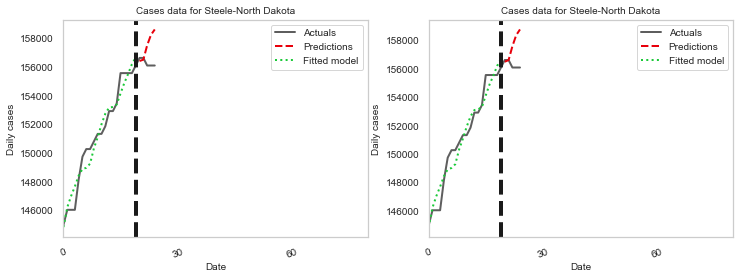

(40, 100)
(5, 100)
tau_hat: 0.6234264168775987
tau_pre: 2.7055915830840487e-05
2D for Steele-North Dakota True
Stephens-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5090010093911155
tau_pre: 3.403757811586619e-06
1D for Stephens-Oklahoma True


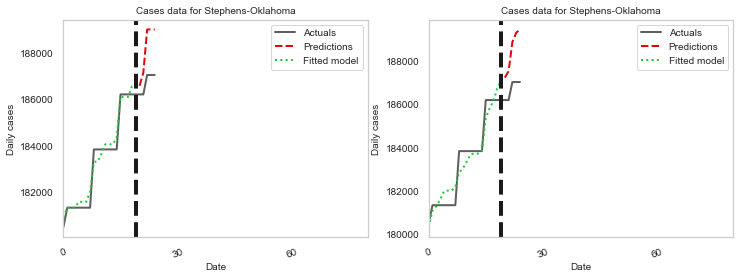

(40, 100)
(5, 100)
tau_hat: 0.6200786015951029
tau_pre: 1.0712960611363734e-05
2D for Stephens-Oklahoma True
Steuben-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5090010094035421
tau_pre: 7.641947717381284e-06
1D for Steuben-Indiana True


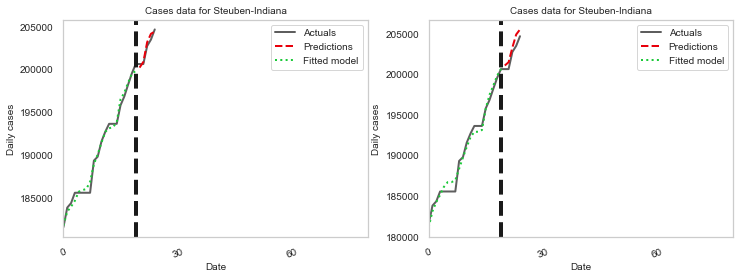

(40, 100)
(5, 100)
tau_hat: 0.6200786016033407
tau_pre: 1.5868456316934584e-05
2D for Steuben-Indiana True
Stillwater-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.552424753698381
tau_pre: 4.648135700989537e-06
1D for Stillwater-Montana True


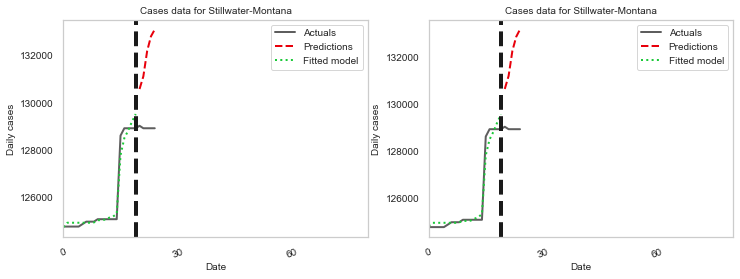

(40, 100)
(5, 100)
tau_hat: 0.6061585095800471
tau_pre: 4.6209213349572165e-06
2D for Stillwater-Montana True
Stutsman-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4802534320353924
tau_pre: 6.215574236626536e-06
1D for Stutsman-North Dakota True


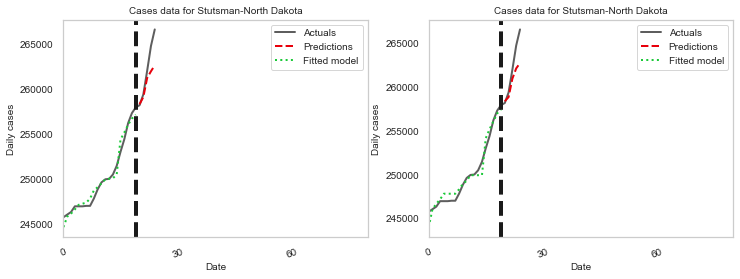

(40, 100)
(5, 100)
tau_hat: 0.5534807662521122
tau_pre: 1.2552453337107509e-05
2D for Stutsman-North Dakota True
Sullivan-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4900805852530149
tau_pre: 3.2172807555895543e-06
1D for Sullivan-Indiana True


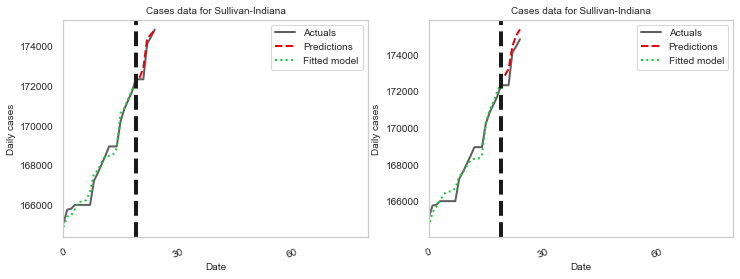

(40, 100)
(5, 100)
tau_hat: 0.5896494831456236
tau_pre: 7.5319065815346115e-06
2D for Sullivan-Indiana True
Sully-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5225247176142809
tau_pre: 2.132971415938928e-05
1D for Sully-South Dakota True


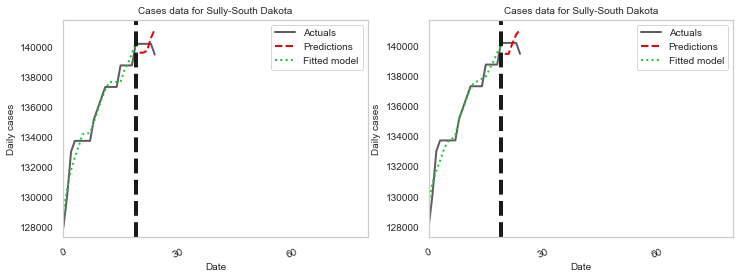

(40, 100)
(5, 100)
tau_hat: 0.6175553516797861
tau_pre: 2.7171082667580512e-05
2D for Sully-South Dakota True
Sweet Grass-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536973687
tau_pre: 1.5567163465043478e-06
1D for Sweet Grass-Montana True


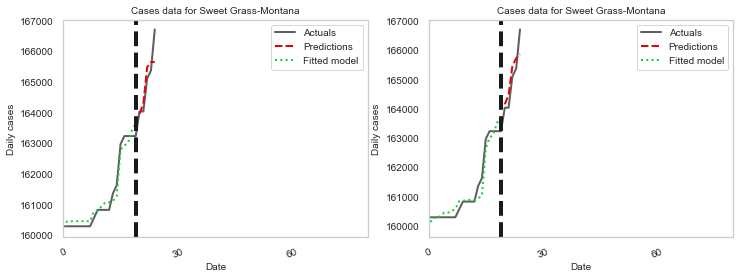

(40, 100)
(5, 100)
tau_hat: 0.6061585095832456
tau_pre: 4.177427617022616e-06
2D for Sweet Grass-Montana True
Switzerland-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648375135
tau_pre: 2.050740074696495e-06
1D for Switzerland-Indiana True


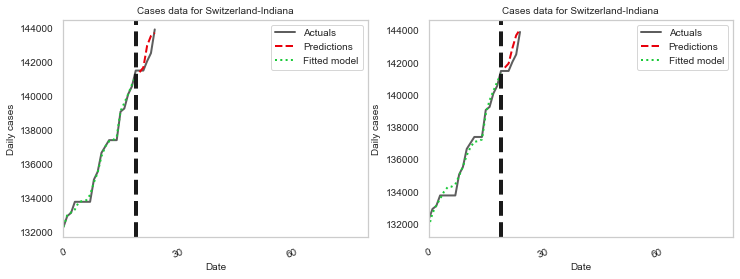

(40, 100)
(5, 100)
tau_hat: 0.5935952209201544
tau_pre: 7.733590163201512e-06
2D for Switzerland-Indiana True
Teton-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536579237
tau_pre: 1.0253363469285729e-06
1D for Teton-Montana True


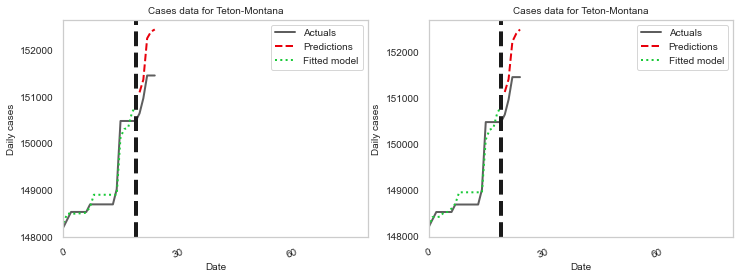

(40, 100)
(5, 100)
tau_hat: 0.6061585095825053
tau_pre: 2.605192290001246e-06
2D for Teton-Montana True
Texas-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5535025421563763
tau_pre: 6.071595742952095e-06
1D for Texas-Oklahoma True


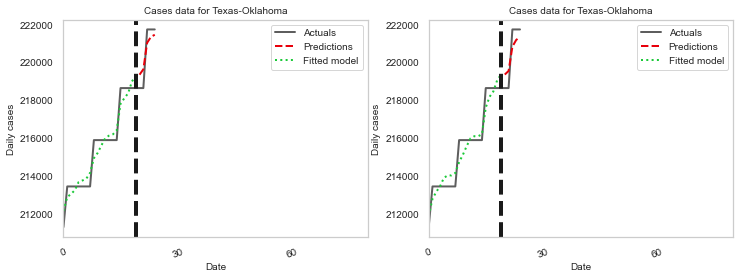

(40, 100)
(5, 100)
tau_hat: 0.6067432896993059
tau_pre: 7.750043475825074e-06
2D for Texas-Oklahoma True
Tillman-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.4962567671527484
tau_pre: 4.336492667260315e-06
1D for Tillman-Oklahoma True


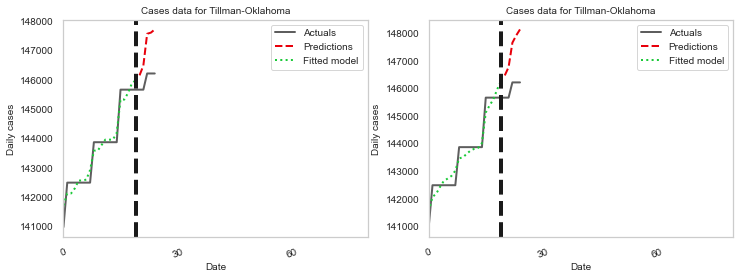

(40, 100)
(5, 100)
tau_hat: 0.6019192769258358
tau_pre: 6.738521123052981e-06
2D for Tillman-Oklahoma True
Tippecanoe-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5493053633584297
tau_pre: 6.819482167581957e-06
1D for Tippecanoe-Indiana True


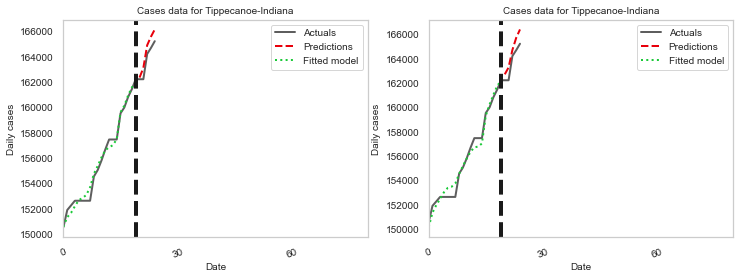

(40, 100)
(5, 100)
tau_hat: 0.61845021642657
tau_pre: 1.239685469621473e-05
2D for Tippecanoe-Indiana True
Tipton-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5263311152290044
tau_pre: 3.1159916352228435e-06
1D for Tipton-Indiana True


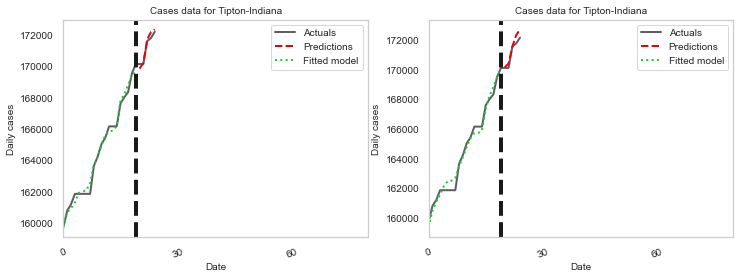

(40, 100)
(5, 100)
tau_hat: 0.6218541358900291
tau_pre: 7.81897109831611e-06
2D for Tipton-Indiana True
Todd-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5021295355576088
tau_pre: 5.443298350901552e-06
1D for Todd-South Dakota True


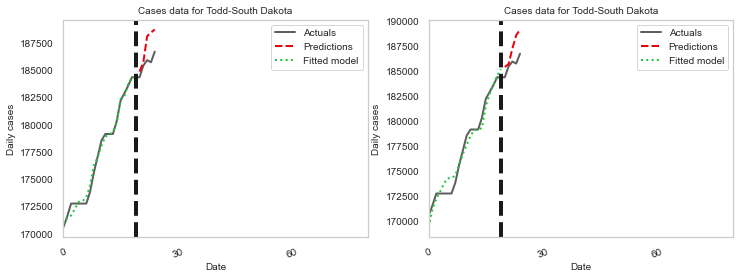

(40, 100)
(5, 100)
tau_hat: 0.5714046063613303
tau_pre: 2.543999789622478e-05
2D for Todd-South Dakota True
Toole-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5220028870851916
tau_pre: 1.1964163316626622e-06
1D for Toole-Montana True


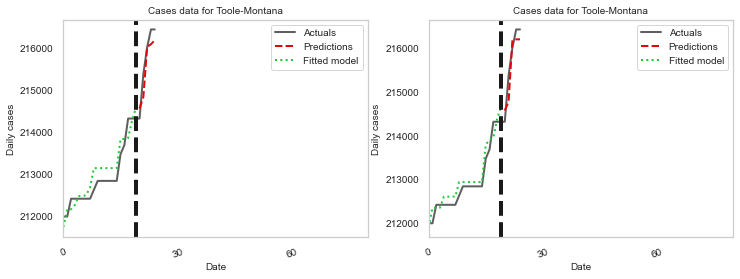

(40, 100)
(5, 100)
tau_hat: 0.6282157351593939
tau_pre: 2.292918493411426e-06
2D for Toole-Montana True
Towner-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5099653544225483
tau_pre: 1.6916874378817586e-05
1D for Towner-North Dakota True


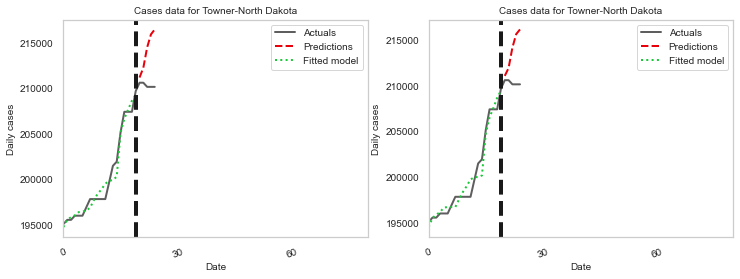

(40, 100)
(5, 100)
tau_hat: 0.619007003551718
tau_pre: 2.0517844583285094e-05
2D for Towner-North Dakota True
Traill-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4784848963917877
tau_pre: 6.257840228215137e-06
1D for Traill-North Dakota True


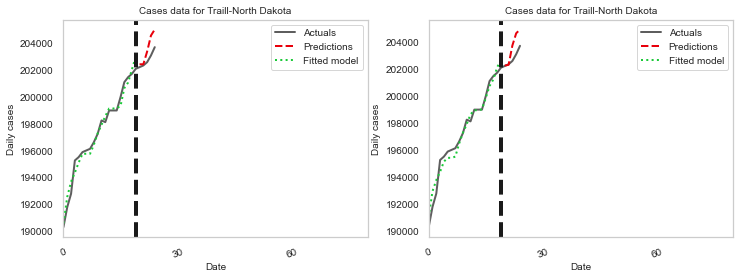

(40, 100)
(5, 100)
tau_hat: 0.557353926653135
tau_pre: 4.1327514455338124e-05
2D for Traill-North Dakota True
Treasure-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.4884940249589243
tau_pre: 2.6063544851393667e-06
1D for Treasure-Montana True


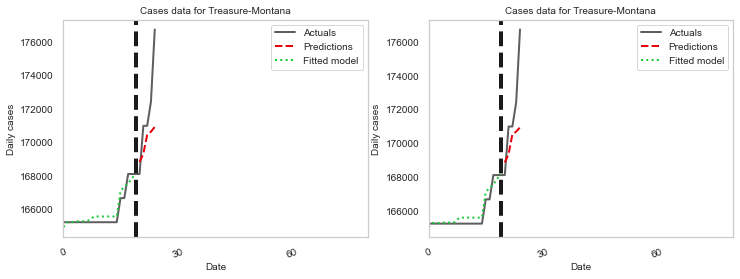

(40, 100)
(5, 100)
tau_hat: 0.5860272890597331
tau_pre: 3.0036057768279833e-06
2D for Treasure-Montana True
Tripp-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5237802019982185
tau_pre: 1.529235001704048e-06
1D for Tripp-South Dakota True


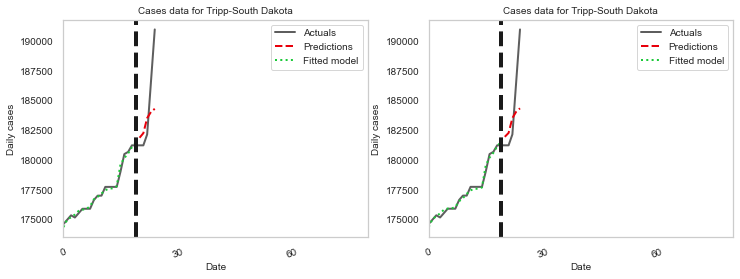

(40, 100)
(5, 100)
tau_hat: 0.6236040897330638
tau_pre: 3.42095555933617e-06
2D for Tripp-South Dakota True
Tulsa-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5643530639956442
tau_pre: 2.0112029352649994e-06
1D for Tulsa-Oklahoma True


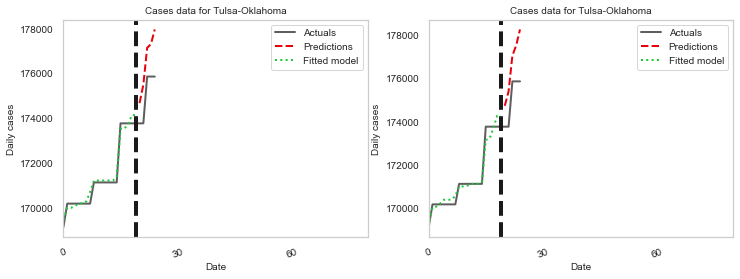

(40, 100)
(5, 100)
tau_hat: 0.6466207427294948
tau_pre: 3.972867966532209e-06
2D for Tulsa-Oklahoma True
Turner-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4230789483096688
tau_pre: 4.459576359167138e-06
1D for Turner-South Dakota True


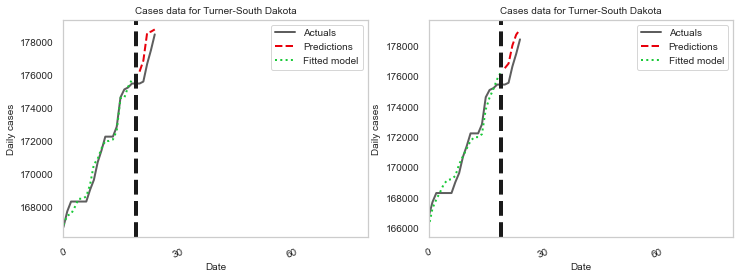

(40, 100)
(5, 100)
tau_hat: 0.5171614362923453
tau_pre: 1.1949304337520912e-05
2D for Turner-South Dakota True
Union-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.49584453029051667
tau_pre: 1.4077365311871742e-05
1D for Union-Indiana True


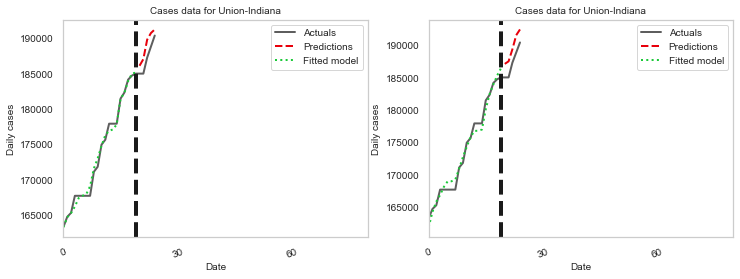

(40, 100)
(5, 100)
tau_hat: 0.6012928236416212
tau_pre: 3.128184486795414e-05
2D for Union-Indiana True
Union-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.4659151836116646
tau_pre: 1.5327161185738372e-05
1D for Union-South Dakota True


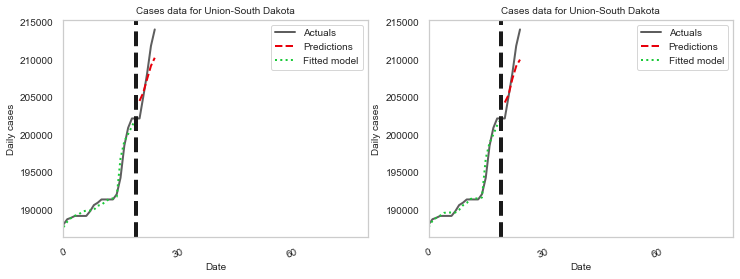

(40, 100)
(5, 100)
tau_hat: 0.5677342870650689
tau_pre: 1.3606304931183829e-05
2D for Union-South Dakota True
Valley-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5267568248596418
tau_pre: 5.928203539675001e-06
1D for Valley-Montana True


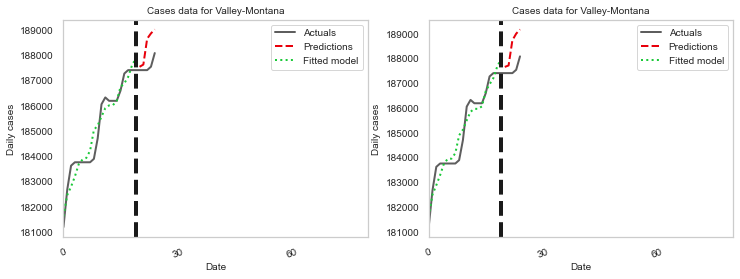

(40, 100)
(5, 100)
tau_hat: 0.6231553196779486
tau_pre: 6.8867978817012765e-06
2D for Valley-Montana True
Vanderburgh-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5552442547246172
tau_pre: 9.36352987827541e-07
1D for Vanderburgh-Indiana True


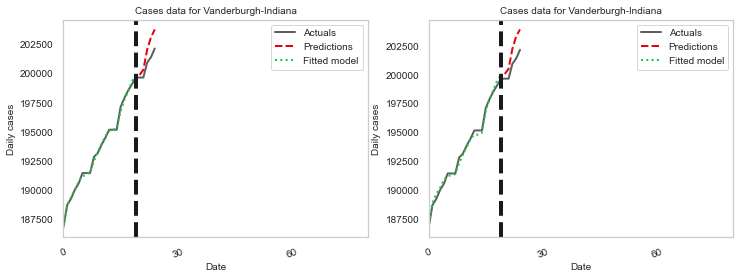

(40, 100)
(5, 100)
tau_hat: 0.6237900013657172
tau_pre: 7.3108068746959304e-06
2D for Vanderburgh-Indiana True
Vermillion-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5147078530772295
tau_pre: 2.822498517298809e-06
1D for Vermillion-Indiana True


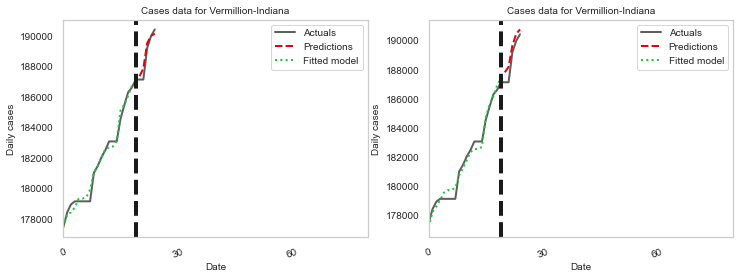

(40, 100)
(5, 100)
tau_hat: 0.6183218662397452
tau_pre: 6.70773662929973e-06
2D for Vermillion-Indiana True
Vigo-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4857281229774542
tau_pre: 4.182661354846105e-06
1D for Vigo-Indiana True


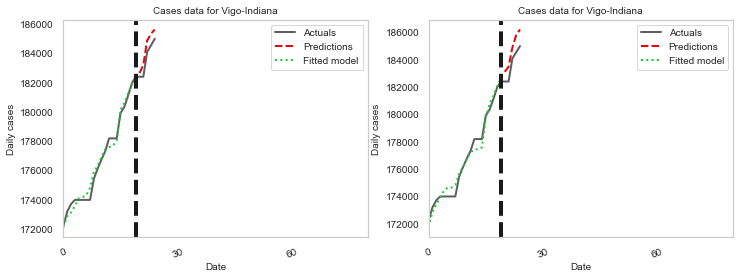

(40, 100)
(5, 100)
tau_hat: 0.5814598003642194
tau_pre: 9.235506232647643e-06
2D for Vigo-Indiana True
Wabash-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536983166
tau_pre: 4.245401284766202e-06
1D for Wabash-Indiana True


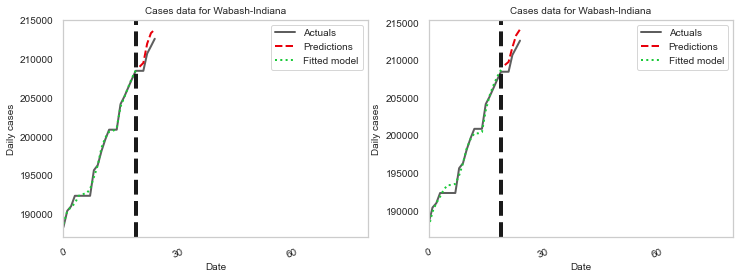

(40, 100)
(5, 100)
tau_hat: 0.6061585095946015
tau_pre: 1.1946326845013355e-05
2D for Wabash-Indiana True
Wagoner-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5267129134806002
tau_pre: 4.882430760563481e-06
1D for Wagoner-Oklahoma True


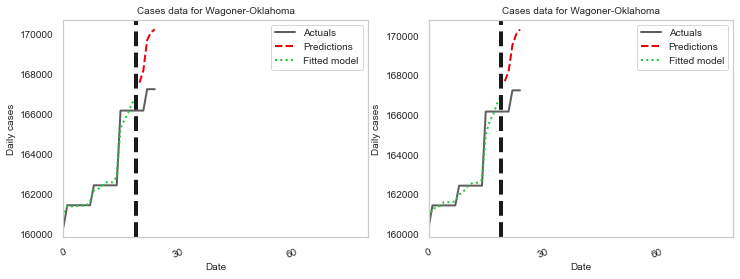

(40, 100)
(5, 100)
tau_hat: 0.6259695256091553
tau_pre: 6.470532526401861e-06
2D for Wagoner-Oklahoma True
Walsh-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.555244254719278
tau_pre: 1.2675006400020445e-06
1D for Walsh-North Dakota True


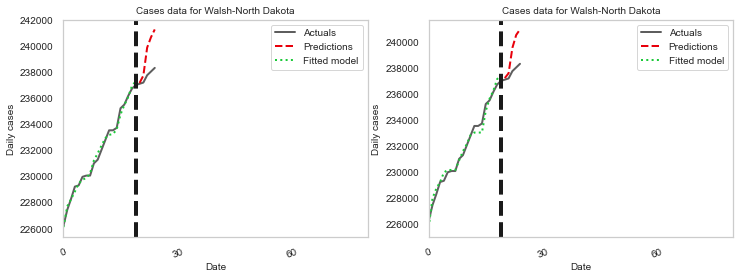

(40, 100)
(5, 100)
tau_hat: 0.6237900013661904
tau_pre: 1.275351253336825e-05
2D for Walsh-North Dakota True
Walworth-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5090010093820999
tau_pre: 6.841728932800627e-07
1D for Walworth-South Dakota True


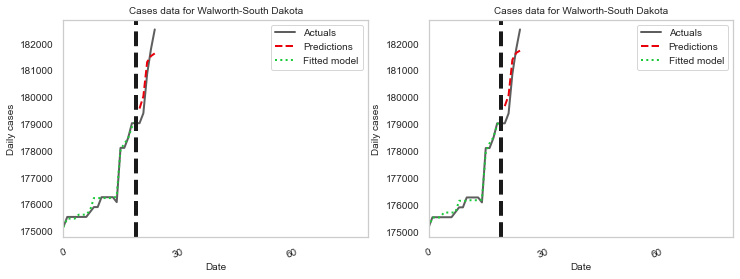

(40, 100)
(5, 100)
tau_hat: 0.6200786015885412
tau_pre: 2.174650616648168e-06
2D for Walworth-South Dakota True
Ward-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5066418823745187
tau_pre: 5.2269900745932435e-06
1D for Ward-North Dakota True


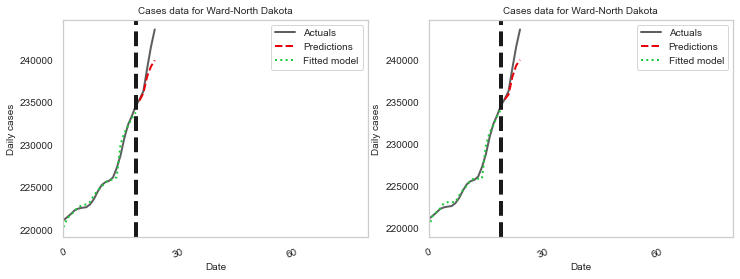

(40, 100)
(5, 100)
tau_hat: 0.616170145275293
tau_pre: 5.479198321273886e-06
2D for Ward-North Dakota True
Warren-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5237802020005006
tau_pre: 1.4150956931713106e-05
1D for Warren-Indiana True


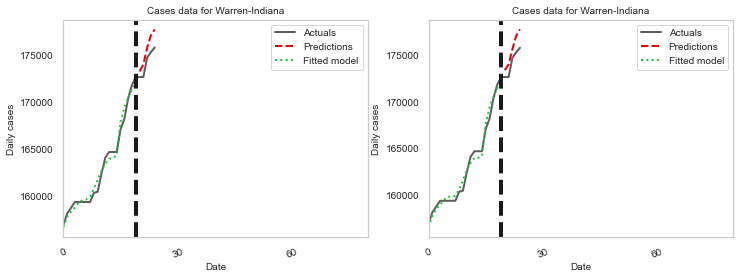

(40, 100)
(5, 100)
tau_hat: 0.6236040897307814
tau_pre: 1.273250047565519e-05
2D for Warren-Indiana True
Warrick-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5672020078792084
tau_pre: 5.754981444105299e-06
1D for Warrick-Indiana True


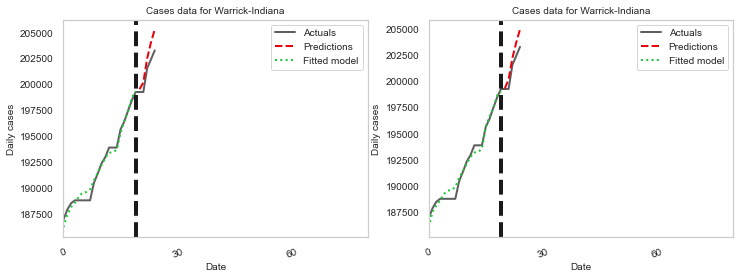

(40, 100)
(5, 100)
tau_hat: 0.6442289221724871
tau_pre: 1.1023668340144513e-05
2D for Warrick-Indiana True
Washington-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218854296
tau_pre: 2.297024481461475e-06
1D for Washington-Indiana True


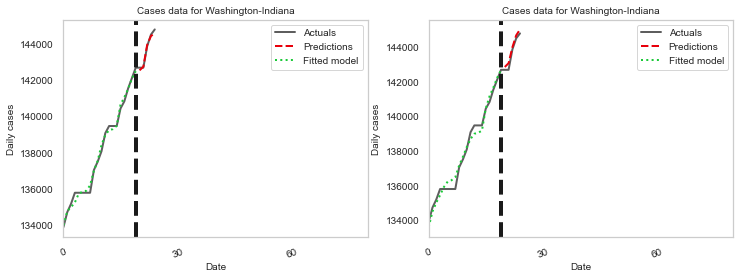

(40, 100)
(5, 100)
tau_hat: 0.608268836120096
tau_pre: 7.942660916040198e-06
2D for Washington-Indiana True
Washington-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247537103045
tau_pre: 2.204006209646061e-06
1D for Washington-Oklahoma True


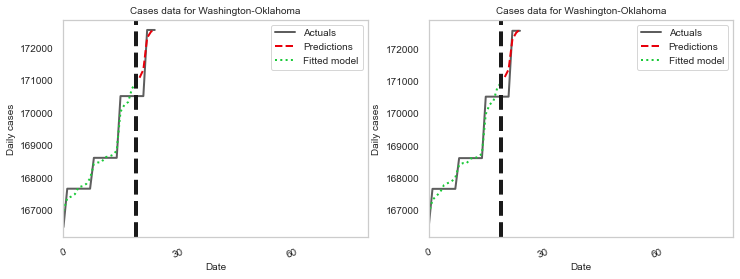

(40, 100)
(5, 100)
tau_hat: 0.606158509582661
tau_pre: 3.3015796217993593e-06
2D for Washington-Oklahoma True
Washington-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5108036436585737
tau_pre: 2.6121109790066896e-05
1D for Washington-Vermont True


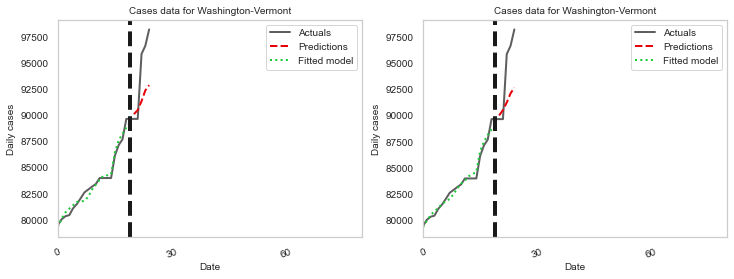

(40, 100)
(5, 100)
tau_hat: 0.6204346875185536
tau_pre: 2.4161169669116428e-05
2D for Washington-Vermont True
Washita-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5484198218600201
tau_pre: 2.955355106096616e-05
1D for Washita-Oklahoma True


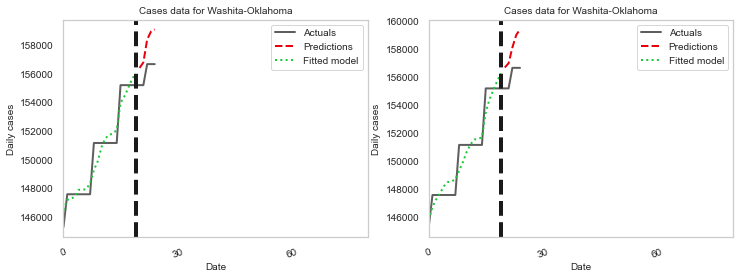

(40, 100)
(5, 100)
tau_hat: 0.6082688361141835
tau_pre: 3.256209855403896e-05
2D for Washita-Oklahoma True
Wayne-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5066418823790696
tau_pre: 4.68878656252428e-06
1D for Wayne-Indiana True


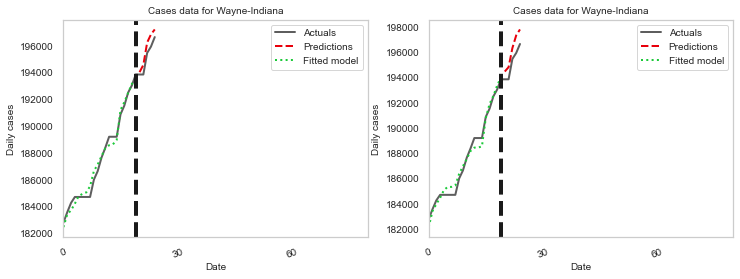

(40, 100)
(5, 100)
tau_hat: 0.6161701452662327
tau_pre: 8.021500929541186e-06
2D for Wayne-Indiana True
Wells-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536890239
tau_pre: 4.803259155868874e-06
1D for Wells-Indiana True


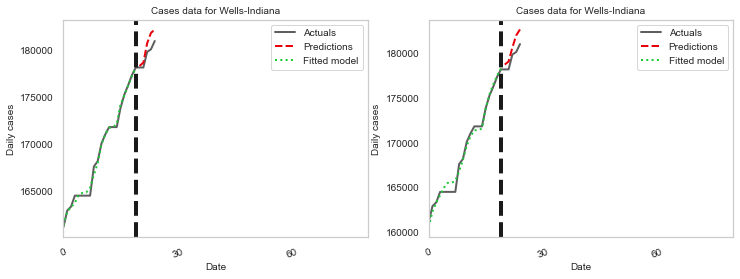

(40, 100)
(5, 100)
tau_hat: 0.6061585095832432
tau_pre: 1.3270479581609817e-05
2D for Wells-Indiana True
Wells-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5141050538348197
tau_pre: 1.4337490578985318e-05
1D for Wells-North Dakota True


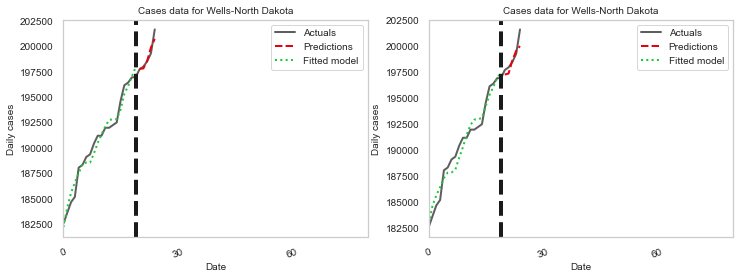

(40, 100)
(5, 100)
tau_hat: 0.6095083606665411
tau_pre: 1.9628969376505135e-05
2D for Wells-North Dakota True
Wheatland-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648473624
tau_pre: 2.166696776762806e-06
1D for Wheatland-Montana True


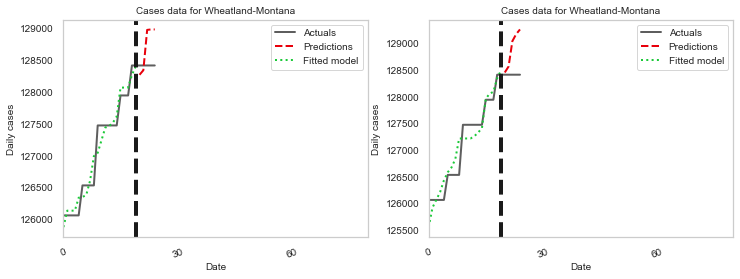

(40, 100)
(5, 100)
tau_hat: 0.5935952209451624
tau_pre: 5.7968788278971535e-06
2D for Wheatland-Montana True
White-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.4218196996011337
tau_pre: 7.639232660702149e-06
1D for White-Indiana True


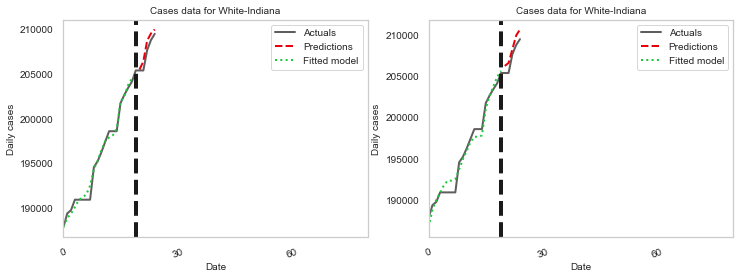

(40, 100)
(5, 100)
tau_hat: 0.4992037330285005
tau_pre: 2.6030998067244533e-05
2D for White-Indiana True
Whitley-Indiana
100
(20, 100)
(5, 100)
tau_hat: 0.5147078530665739
tau_pre: 8.373987670469013e-06
1D for Whitley-Indiana True


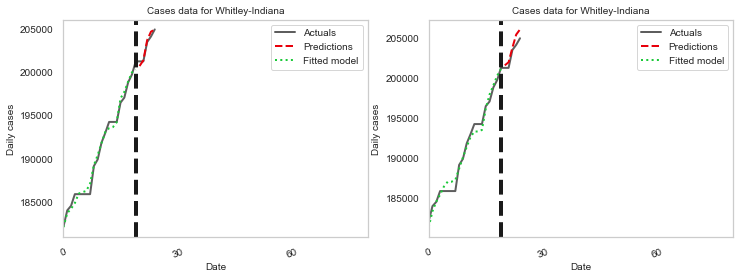

(40, 100)
(5, 100)
tau_hat: 0.6183218662262485
tau_pre: 1.672994439184623e-05
2D for Whitley-Indiana True
Wibaux-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648448913
tau_pre: 2.5579688175950345e-06
1D for Wibaux-Montana True


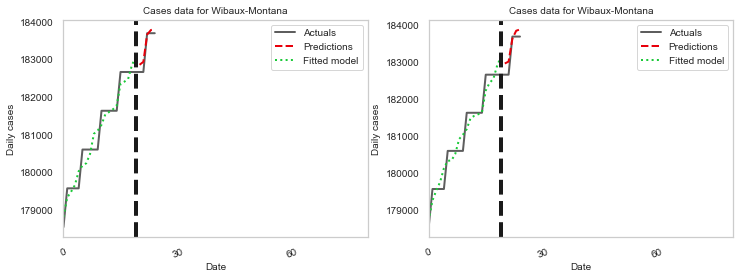

(40, 100)
(5, 100)
tau_hat: 0.593595220926827
tau_pre: 3.7015028442670498e-06
2D for Wibaux-Montana True
Williams-North Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648533268
tau_pre: 2.3931210680061e-06
1D for Williams-North Dakota True


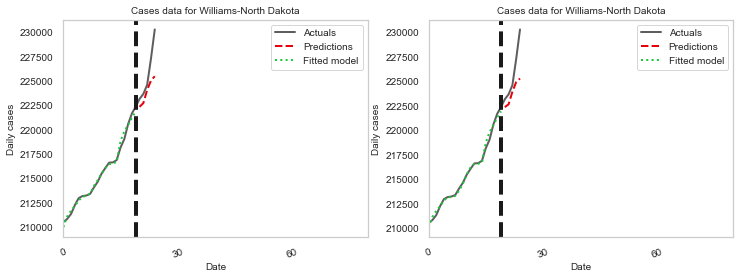

(40, 100)
(5, 100)
tau_hat: 0.5935952209303986
tau_pre: 2.461594665452155e-06
2D for Williams-North Dakota True
Windham-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.5373662554452762
tau_pre: 3.668888409243412e-05
1D for Windham-Vermont True


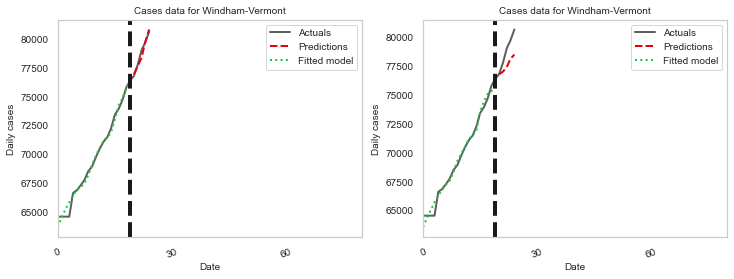

(40, 100)
(5, 100)
tau_hat: 0.6243351998398872
tau_pre: 8.858875327061065e-05
2D for Windham-Vermont True
Windsor-Vermont
100
(20, 100)
(5, 100)
tau_hat: 0.4900805853139196
tau_pre: 8.952441691704657e-05
1D for Windsor-Vermont True


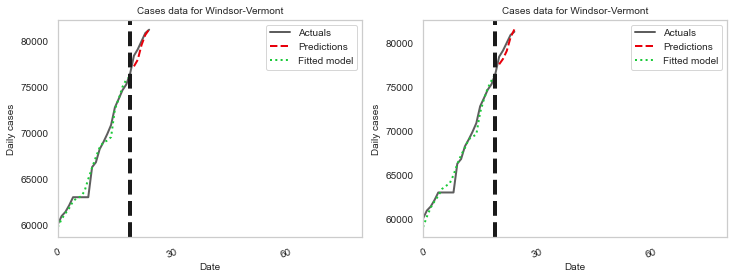

(40, 100)
(5, 100)
tau_hat: 0.5896494831273138
tau_pre: 8.428057383240486e-05
2D for Windsor-Vermont True
Woods-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5524247536962117
tau_pre: 3.2054687134734435e-06
1D for Woods-Oklahoma True


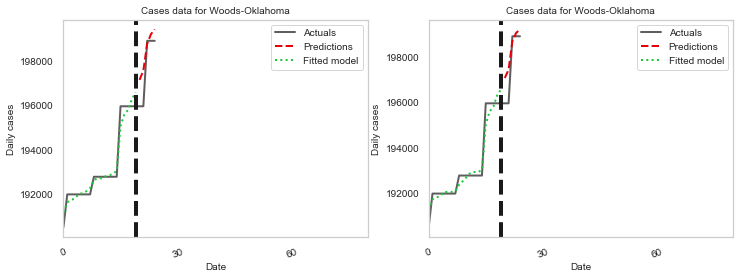

(40, 100)
(5, 100)
tau_hat: 0.6061585095668496
tau_pre: 4.1442044448197505e-06
2D for Woods-Oklahoma True
Woodward-Oklahoma
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648440187
tau_pre: 4.299974004593629e-06
1D for Woodward-Oklahoma True


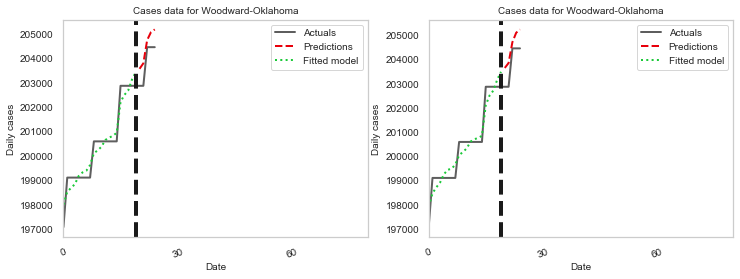

(40, 100)
(5, 100)
tau_hat: 0.5935952209317257
tau_pre: 5.264845198134971e-06
2D for Woodward-Oklahoma True
Yankton-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5685615907936099
tau_pre: 3.5171268519132915e-06
1D for Yankton-South Dakota True


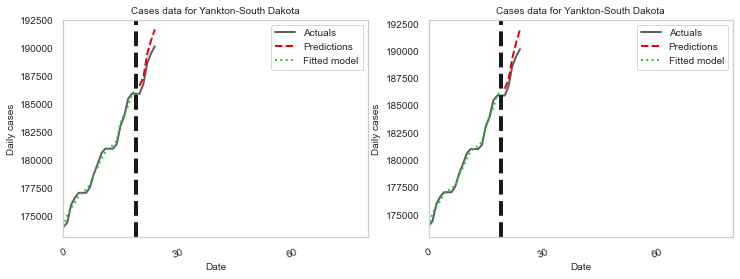

(40, 100)
(5, 100)
tau_hat: 0.655689476289545
tau_pre: 3.546280909241647e-06
2D for Yankton-South Dakota True
Yellowstone-Montana
100
(20, 100)
(5, 100)
tau_hat: 0.4716697728540463
tau_pre: 5.254737144906363e-06
1D for Yellowstone-Montana True


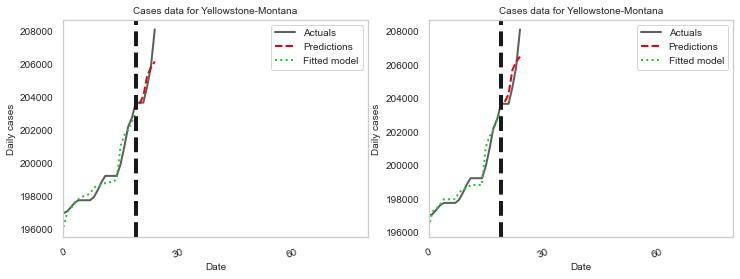

(40, 100)
(5, 100)
tau_hat: 0.5670037974698358
tau_pre: 7.898671615219684e-06
2D for Yellowstone-Montana True
Ziebach-South Dakota
100
(20, 100)
(5, 100)
tau_hat: 0.5373115648436068
tau_pre: 1.6035678138321472e-05
1D for Ziebach-South Dakota True


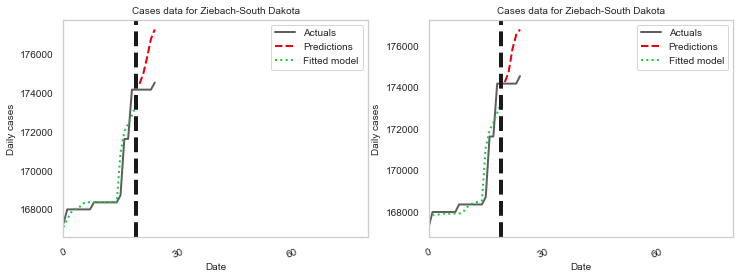

(40, 100)
(5, 100)
tau_hat: 0.5935952209310909
tau_pre: 2.265812860626041e-05
2D for Ziebach-South Dakota True


In [36]:

# predict west/south based on North East and Midwest groups = [northeast, west, south, midwest]
#import warnings
percent_change_in_day = []
H0_t = []
pre_R2 = {}
pre_R2_1d = {}

from syn_model import *

# RMSE
Test_err = []
Test_R2 = []

#RMSE
Test_err_2d = []
Test_R2_2d = []

FONTSIZE = 10
singVals = 4
warnings.simplefilter('ignore')

projection_period=80
training_period=20
df1 =  omicron_cases_pop_adjusted.fillna(0)  # 
df2 = county_full_vaccine_pop_adjusted_US
pre_H0 = {}

for day in range(projection_period-training_period):
    percent_change_in_day.append([])


for state in targets: #south+west:
    if state == "Maine" or state == "Hawaii" or state not in df2.columns:
        continue
        
    print(state)

    


    otherStates = list(generate_donors(state, df2, training_period, donors))
#         otherStates = omicron_cases_pop_adjusted_county.columns[(omicron_cases_pop_adjusted_county.iloc[training_period] < 
#                                       omicron_cases_pop_adjusted_county[state].iloc[training_period]
# #                                        +.1*omicron_cases_pop_adjusted_county[state].iloc[training_period])&(omicron_cases_pop_adjusted_county.iloc[training_period])]
#     except:
#         continue
        

    
    #otherStates = list(otherStates[otherStates.isin(donors)]) # list(otherStates[otherStates.isin(northeast+midwest)])
    
    '''
    '''
    # only keep the states that omicron hit them earlier than 5 days before the target
#     early_omicron_states = [key for key in omincron_variant_data_US if datetime.datetime.strptime(omincron_variant_data_US[key],"%Y-%m-%d") <= datetime.datetime.strptime(omincron_variant_data_US[state],"%Y-%m-%d")-datetime.timedelta(days=5)]
#     otherStates = list(set(early_omicron_states).intersection(set(otherStates)))
    print(len(otherStates))
    if len(otherStates) < 10:
        continue
    
    
    if state in otherStates:
        otherStates.remove(state)  

    rscModel =syn_model(state, singVals, [df1], projection_period, training_period, otherStates=otherStates, mRSC=True)

    rscModel.fit_model(filter_donor = False, filter_method = 'hbo', backward_donor_eliminate = False, singVals_estimate = False, singval_mathod ='auto', daily = False)
    
#     except: 
#         print(1)
#         continue
        
    fig, axes = plt.subplots(1,2, figsize=(12,4)) 
    #print(state, 'singvals:', rscModel.kSingularValues)
    #print(rscModel.donors)
    rscModel.plot(figure=fig, axes=axes[0], title_text="Cases data", xlimit=[0,projection_period], logy=False, show_donors=False, tick_spacing=30, yaxis="Daily cases", intervention_date_x_ticks=None, fontsize = FONTSIZE)
    plt.title(state + ' with '+str(len(rscModel.donors))+' donors and singval '+str(rscModel.kSingularValues)+ ', 1D' )

    Test_err.append(np.sqrt(rscModel.test_err)) #RMSE
    Test_R2.append(1-rscModel.test_err/np.var(df1[state].iloc[training_period:projection_period]))
    
    pre_R2_1d[state] = 1-(mean_squared_error(rscModel.train[state][:training_period], rscModel.model_fit[:training_period])/np.var(rscModel.train[state][:training_period]))
#     for day in range(len(rscModel.predictions)):
#         #percent_change_in_day[day].append((df1[state].iloc[training_period+day]-rscModel.predictions[day])/df1[state].iloc[training_period+day])
#         percent_change_in_day[day].append((df1[state].iloc[training_period+day]-rscModel.predictions[day]))
    #pre_H0[rscModel.state] =  passed_H0(rscModel.donors, rscModel.state, rscModel.kSingularValues, alpha = 0.05, train=rscModel.train, test=rscModel.test, H0_t = H0_t)

      

    #hypothesis test

    print('1D for',rscModel.state, passed_H0(rscModel.donors, rscModel.state, rscModel.kSingularValues, alpha = 0.05, train=rscModel.train, test=rscModel.test))

    ############
    ############

    rscModel = syn_model(state, singVals, [df1,df2], projection_period, training_period, otherStates=otherStates, mRSC=True, lambdas = [1,0.1])
    rscModel.fit_model(filter_donor = False, filter_method = 'hbo', backward_donor_eliminate = False, singVals_estimate = False, singval_mathod ='auto', daily = False)
    rscModel.plot(figure=fig, axes=axes[1], title_text="Cases data", xlimit=[0,projection_period], logy=False, show_donors=False, tick_spacing=30, yaxis="Daily cases", intervention_date_x_ticks=None, fontsize = FONTSIZE)

    Test_err_2d.append(np.sqrt(rscModel.test_err)) #RMSE
    Test_R2_2d.append(1-rscModel.test_err/np.var(df1[state].iloc[training_period:projection_period]))

    pre_R2[state] = 1-(mean_squared_error(rscModel.train[state][:training_period], rscModel.model_fit[:training_period])/np.var(rscModel.train[state][:training_period]))
    
    for day in range(len(rscModel.predictions)):
        rscModel.predictions[day]
        percent_change_in_day[day].append((df1[state].iloc[training_period+day]-rscModel.predictions[day]))
        

    plt.show()
    pre_H0[rscModel.state] =  passed_H0(rscModel.donors, rscModel.state, rscModel.kSingularValues, alpha = 0.05, train=rscModel.train, test=rscModel.test, H0_t = H0_t)
    
    print( '2D for',rscModel.state,pre_H0[rscModel.state])
    
   

1535.3385473699966
-inf
0.9420527361651028
{'Adair-Oklahoma': 0.9289695214168909, 'Adams-Indiana': 0.9848825683685322, 'Adams-North Dakota': 0.9212745750305729, 'Addison-Vermont': 0.9576113473624038, 'Alfalfa-Oklahoma': 0.9231664009543028, 'Allen-Indiana': 0.9846111470055224, 'Atoka-Oklahoma': 0.9567597207430266, 'Aurora-South Dakota': 0.9262032281922998, 'Barnes-North Dakota': 0.9620013281005935, 'Bartholomew-Indiana': 0.9829337510060563, 'Beadle-South Dakota': 0.9408493850729573, 'Beaver-Oklahoma': 0.9381587837582395, 'Beaverhead-Montana': 0.962856023203482, 'Beckham-Oklahoma': 0.9314929119894997, 'Bennett-South Dakota': 0.9122082312102798, 'Bennington-Vermont': 0.9575758365118503, 'Benson-North Dakota': 0.9589443711827421, 'Benton-Indiana': 0.9738235791072363, 'Big Horn-Montana': 0.6120203021228029, 'Billings-North Dakota': 0.926481485411915, 'Blackford-Indiana': 0.9843930392051649, 'Blaine-Montana': 0.8106242057118354, 'Blaine-Oklahoma': 0.9334494353235707, 'Bon Homme-South Dakota'

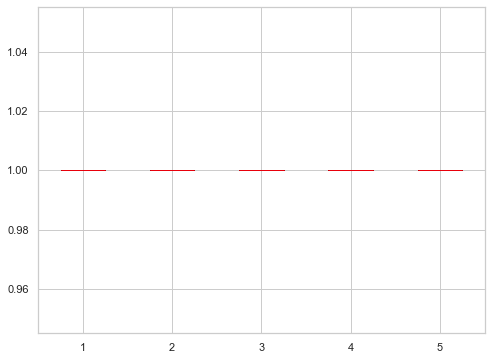

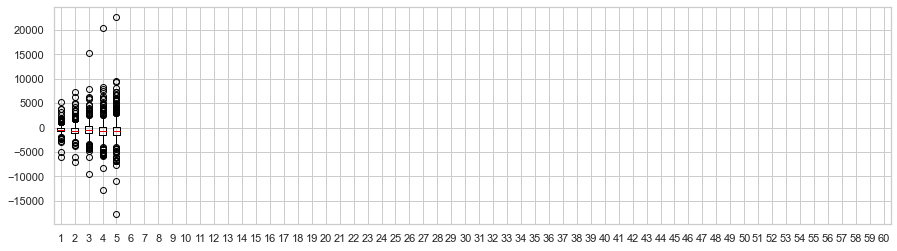

In [37]:
# democrat

print(np.mean(Test_err_2d))
print(np.mean(Test_R2_2d))
print(np.mean(list(pre_R2.values())))
print(pre_R2)
print(sum(np.array(list(pre_R2.values()))>0))


fig, ax = plt.subplots()
plt.rcParams['figure.figsize'] = (15.0, 4.0)
plt.boxplot(list(np.array(H0_t).astype(int)))
plt.show()


fig, ax = plt.subplots()
plt.rcParams['figure.figsize'] = (15.0, 4.0)
plt.boxplot(percent_change_in_day)
#plt.ylim([-1,1])
plt.show()